# Benchmarking Field Transformations


### DONE - FT-HMC implemented for 8x8 2D QED (using SiLU as activation function).

- [x] Try to minimize size of the force in training. No significant improvements.
- [x]  Some test on ergodicity
- [x] (calculate the probablity of generating the configs obtained via conventional HMC).

### TODO

- [ ] Plot the force size distribution 
- [ ] Is the large force from the original action or Field-Transforma
tion the determinant?
- [ ] If from the determinant, then the fermion force won't cause problem for HMC
- [ ] Use the same Field-Transformation for larger system (say 16x16, 32x32, 64x64, etc)
- [ ] Study how the delta H depends on the system size ( perhaps delta H ~ sqrt(volume) )
- [ ] Study the auto-correlation for observables, topo, plaq, flowed plaq, etc.
- [ ] Improving the Field-Transformation to reduce force.

## Setup, `import`'s, ..., etc

In [1]:
import os
import sys
import torch

from functools import reduce
from IPython.core.interactiveshell import InteractiveShell

%load_ext autoreload
%autoreload 2

%config InlineBackend.figure_format ='retina'

InteractiveShell.ast_node_interactivity = "all"


project_dir = os.path.abspath('../../')
if project_dir not in sys.path:
    sys.path.append(project_dir)

import fthmc.utils.io as io
logger = io.Logger()

torch.manual_seed(9)
# torch.set_default_tensor_type(torch.FloatTensor)

#torch.set_num_threads(param.nth)
#torch.set_num_interop_threads(param.nth_interop)
#os.environ["OMP_NUM_THREADS"] = str(param.nth)
#os.environ["KMP_BLOCKTIME"] = "0"
#os.environ["KMP_SETTINGS"] = "1"
#os.environ["KMP_AFFINITY"]= "granularity=fine,verbose,compact,1,0"

if torch.cuda.is_available():
    torch.set_default_tensor_type(torch.cuda.FloatTensor)
else:
    torch.set_default_tensor_type(torch.FloatTensor)

import matplotlib as mpl
import matplotlib.pyplot as plt

from fthmc.train import train
from fthmc.config import Param, TrainConfig, PI
from fthmc.utils.distributions import MultivariateUniform
from fthmc.utils.layers import make_u1_equiv_layers, set_weights
from fthmc.utils.plot_helpers import save_live_plots
from fthmc.utils.logger import Logger

import fthmc.utils.qed_helpers as qed

import datetime

from fthmc.config import LOGS_DIR

mpl.rcParams['text.usetex'] = False
%matplotlib inline
plt.style.use('~/.matplotlib/stylelib/molokai.mplstyle')

Duplicate key in file PosixPath('/home/foremans1/.config/matplotlib/stylelib/dark_jupyter.mplstyle'), line 92 ('figure.facecolor: 474747')
Duplicate key in file PosixPath('/home/foremans1/.config/matplotlib/stylelib/dark_jupyter.mplstyle'), line 93 ('figure.edgecolor: 0.50')
In /home/foremans1/.config/matplotlib/stylelib/dark_jupyter.mplstyle: 
The savefig.jpeg_quality rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.


Missing colon in file '~/.matplotlib/stylelib/molokai.mplstyle', line 3 ('font.size = 10')
Bad value in file '~/.matplotlib/stylelib/molokai.mplstyle', line 11 ('grid.color: #465457'): Key grid.color: '' does not look like a color arg


TORCH DEVICE: cuda


## Setup experiment

- Specify `Param` object for lattice and HMC info

- Specify `TrainConfig` object for training our model

- Note, we train the `pre_flow_model` using the Kullback-Leibler divergence:

$$
D_{\mathrm{KL}} = \left(P\|Q\right) = \sum_{x\in\mathcal{X}} P(x)\log\left(\frac{P(x)}{Q(x)}\right)
$$

In [17]:
#import seaborn as sns
#sns.set_context('paper', font_scale=0.6)

<!-- ## New heading -->

[03:52:57]  Param:                                                                           
            ----------------                                                                 
            beta=4.0                                                                         
            L=8                                                                              
            tau=0.5                                                                          
            nstep=10                                                                         
            ntraj=1000                                                                       
            nrun=1                                                                           
            nprint=100                                                                       
            seed=1331                                                                        
            randinit=False                                                                   
            nth_interop=2                                                                    
            nth=2                                                                            
            lat=[8, 8]                                                                       
            nd=2                                                                             
            shape=[2, 8, 8]                                                                  
            volume=64                                                                        
            dt=0.05

            TrainConfig:                                                                     
            ----------------                                                                 
            n_era=10                                                                         
            n_epoch=1000                                                                     
            batch_size=128                                                                   
            base_lr=0.001                                                                    
            n_s_nets=2                                                                       
            n_layers=24                                                                      
            kernel_size=3                                                                    
            with_force=False                                                                 
            print_freq=500                                                                   
            plot_freq=50                                                                     
            hidden_sizes=[8, 8]

[03:52:57]  Creating directory: ../../logs/hmc/t8x8_b4.0_n1000_t0.5_s10/2021-06-23-035257

[03:52:57]  Creating directory:                                                              
            ../../logs/hmc/t8x8_b4.0_n1000_t0.5_s10/2021-06-23-035257/plots

[03:52:57]  Param:                                                                           
            ----------------                                                                 
            beta=4.0                                                                         
            L=8                                                                              
            tau=0.5                                                                          
            nstep=10                                                                         
            ntraj=1000                                                                       
            nrun=1                                                                           
            nprint=100                                                                       
            seed=1331                                                                        
            randinit=False                                                                   
            nth_interop=2                                                                    
            nth=2                                                                            
            lat=[8, 8]                                                                       
            nd=2                                                                             
            shape=[2, 8, 8]                                                                  
            volume=64                                                                        
            dt=0.05

──────────────────────────────── RUN: 0, last took: 0 m 0 s ─────────────────────────────────

            plaq=1.000 q=0.000

            traj=2 dt=0.008 acc=1.000 dH=-0.044 q=0 dqsq=0 plaq=0.893

            traj=102 dt=0.007 acc=1.000 dH=-0.089 q=0 dqsq=0 plaq=0.819

[03:52:58]  traj=202 dt=0.007 acc=1.000 dH=0.028 q=0 dqsq=0 plaq=0.870

[03:52:59]  traj=302 dt=0.007 acc=1.000 dH=-0.070 q=1 dqsq=0 plaq=0.843

[03:53:00]  traj=402 dt=0.007 acc=1.000 dH=0.018 q=0 dqsq=0 plaq=0.871

            traj=502 dt=0.007 acc=1.000 dH=0.013 q=0 dqsq=0 plaq=0.896

[03:53:01]  traj=602 dt=0.007 acc=1.000 dH=0.051 q=0 dqsq=0 plaq=0.873

[03:53:02]  traj=702 dt=0.007 acc=1.000 dH=-0.007 q=0 dqsq=0 plaq=0.844

            traj=802 dt=0.007 acc=1.000 dH=0.024 q=0 dqsq=0 plaq=0.816

[03:53:03]  traj=902 dt=0.007 acc=1.000 dH=-0.043 q=1 dqsq=1 plaq=0.859

[03:53:04]  Creating directory:                                                              
            ../../logs/hmc/t8x8_b4.0_n1000_t0.5_s10/2021-06-23-035257/plots/run0

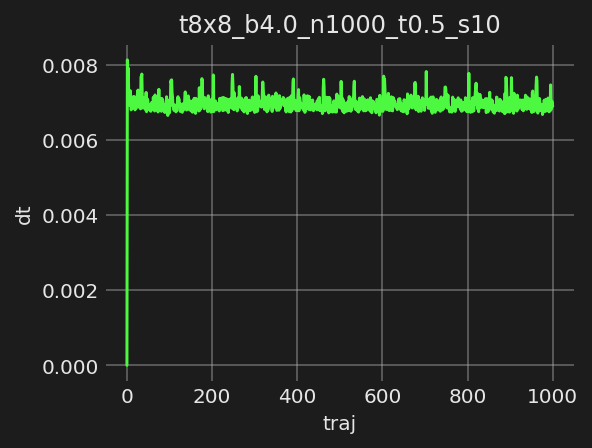

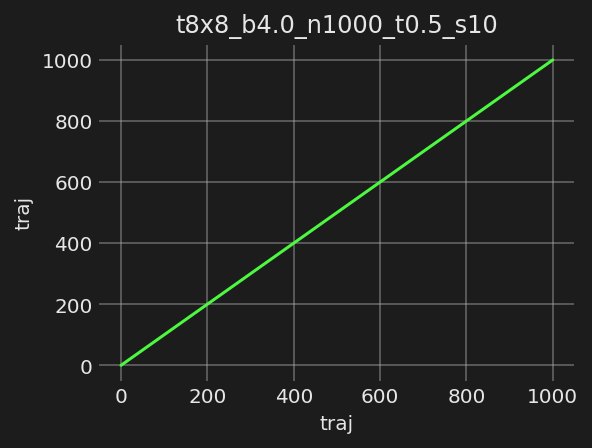

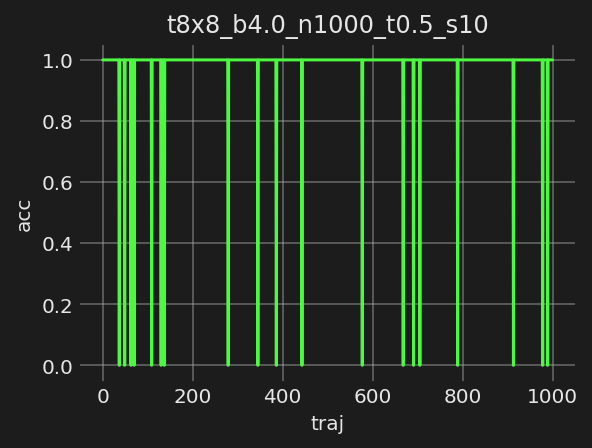

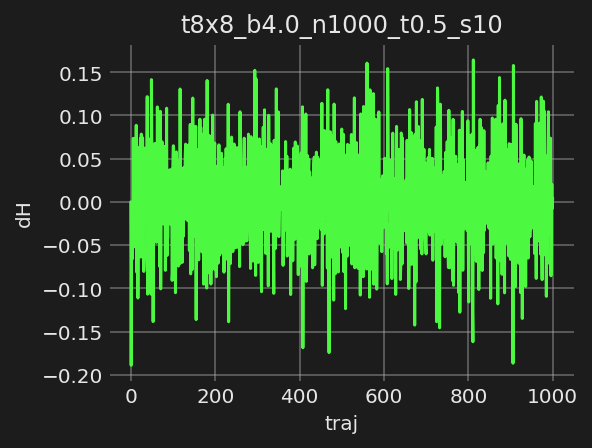

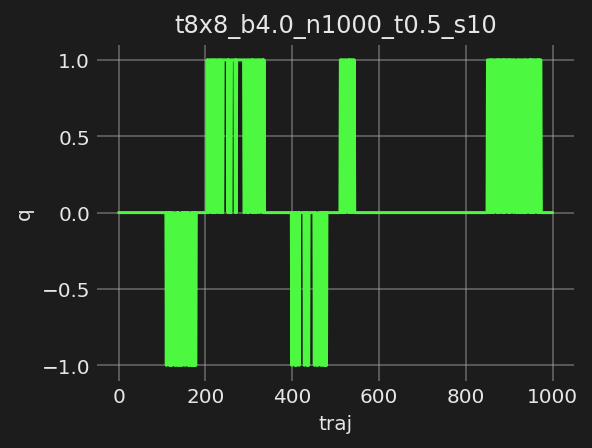

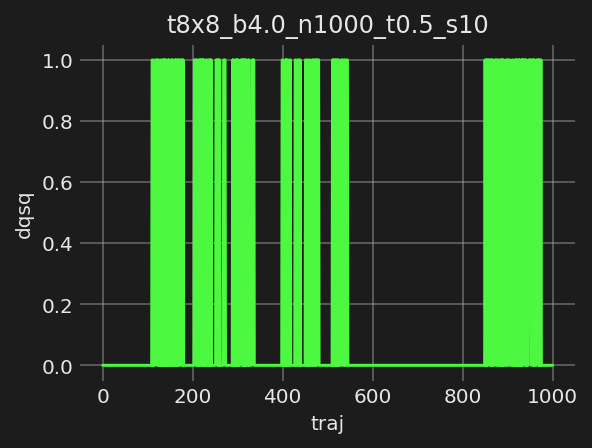

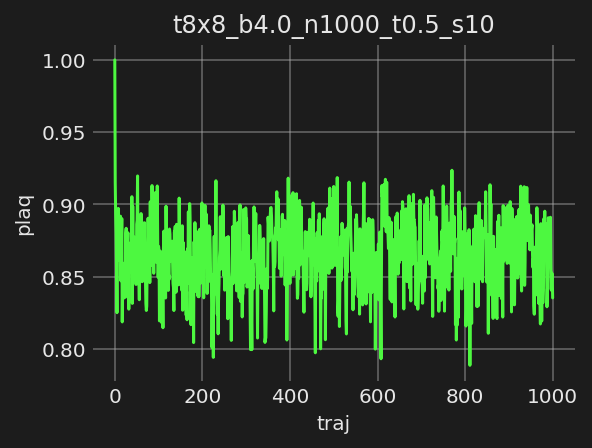

[03:53:06]  Run times: ['7.0121']

            Per trajectory: ['0.0070']

[03:53:06]  Saving hmc_histories to                                                          
            ../../logs/hmc/t8x8_b4.0_n1000_t0.5_s10/2021-06-23-035257/hmc_histories.z.

[03:53:06]  Saving hmc_fields_arr to                                                         
            ../../logs/hmc/t8x8_b4.0_n1000_t0.5_s10/2021-06-23-035257/hmc_fields_arr.z.

[03:53:07]  Creating directory: ../../logs/t8x8_b4.0_n1000_t0.5_s10/nb128_nh24_ns2_ks3_hl88_l
            r0.001_era10_epoch1000/training/2021-06-23-035307

[03:53:07]  Creating directory: ../../logs/t8x8_b4.0_n1000_t0.5_s10/nb128_nh24_ns2_ks3_hl88_l
            r0.001_era10_epoch1000/training/2021-06-23-035307/plots

[03:53:07]  Creating directory: ../../logs/t8x8_b4.0_n1000_t0.5_s10/nb128_nh24_ns2_ks3_hl88_l
            r0.001_era10_epoch1000/training/2021-06-23-035307/checkpoints

[03:53:07]  Scheduler created!

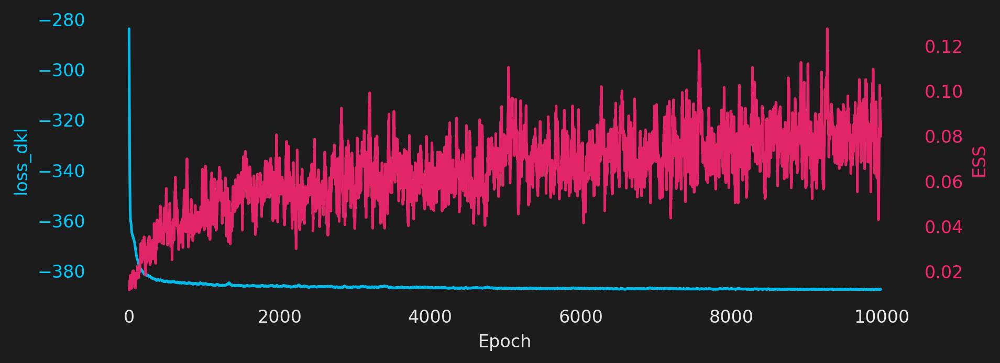

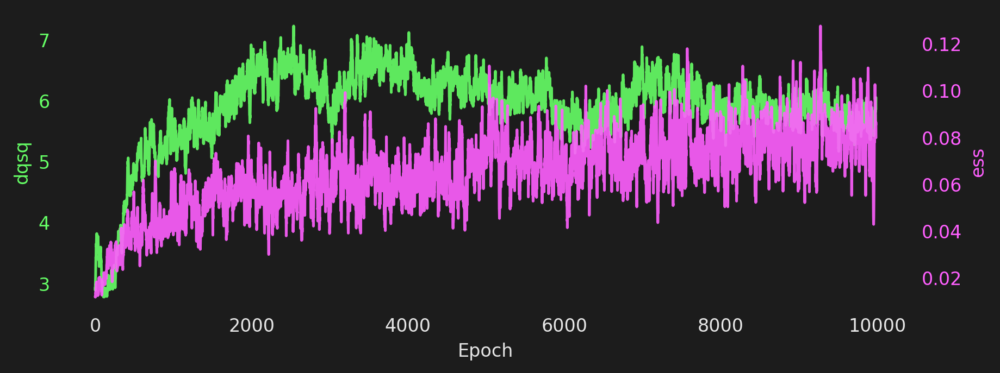

─────────────────────────────── ERA=0, last took: 0 min 0 sec ───────────────────────────────

[03:54:19]  (now) epoch: 499 dt=0.134 ess=0.054 loss_dkl=-384.167 logp=211.847 logq=-172.320 
            dqsq=5.680 plaq=0.828

            (avg) epoch: 499 dt=0.134 ess=0.045 loss_dkl=-384.379 logp=212.451 logq=-171.928 
            dqsq=4.671 plaq=0.830

Epoch   518: reducing learning rate of group 0 to 9.9000e-04.
Epoch   733: reducing learning rate of group 0 to 9.8010e-04.
Epoch   812: reducing learning rate of group 0 to 9.7030e-04.
Epoch   986: reducing learning rate of group 0 to 9.6060e-04.


[03:55:31]  (now) epoch: 999 dt=0.135 ess=0.027 loss_dkl=-385.018 logp=212.838 logq=-172.179 
            dqsq=5.273 plaq=0.831

            (avg) epoch: 999 dt=0.135 ess=0.057 loss_dkl=-385.384 logp=213.427 logq=-171.958 
            dqsq=5.643 plaq=0.834

[03:55:31]  Saving checkpoint to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/
            logs/t8x8_b4.0_n1000_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.001_era10_epoch1000/tra
            ining/2021-06-23-035307/checkpoints/ckpt-era0-epoch999.tar

───────────────────────────── ERA=1, last took: 2 min 24.03 sec ─────────────────────────────

Epoch  1083: reducing learning rate of group 0 to 9.5099e-04.
Epoch  1209: reducing learning rate of group 0 to 9.4148e-04.
Epoch  1283: reducing learning rate of group 0 to 9.3207e-04.
Epoch  1334: reducing learning rate of group 0 to 9.2274e-04.
Epoch  1385: reducing learning rate of group 0 to 9.1352e-04.
Epoch  1488: reducing learning rate of group 0 to 9.0438e-04.


[03:56:43]  (now) epoch: 499 dt=0.135 ess=0.022 loss_dkl=-385.742 logp=212.443 logq=-173.299 
            dqsq=5.656 plaq=0.830

            (avg) epoch: 499 dt=0.135 ess=0.057 loss_dkl=-385.920 logp=213.909 logq=-172.011 
            dqsq=5.260 plaq=0.836

Epoch  1590: reducing learning rate of group 0 to 8.9534e-04.
Epoch  1641: reducing learning rate of group 0 to 8.8638e-04.
Epoch  1739: reducing learning rate of group 0 to 8.7752e-04.
Epoch  1790: reducing learning rate of group 0 to 8.6875e-04.
Epoch  1857: reducing learning rate of group 0 to 8.6006e-04.
Epoch  1908: reducing learning rate of group 0 to 8.5146e-04.
Epoch  1959: reducing learning rate of group 0 to 8.4294e-04.


[03:57:55]  (now) epoch: 999 dt=0.135 ess=0.021 loss_dkl=-386.013 logp=212.886 logq=-173.127 
            dqsq=6.195 plaq=0.832

[03:57:56]  (avg) epoch: 999 dt=0.135 ess=0.061 loss_dkl=-386.323 logp=214.531 logq=-171.792 
            dqsq=5.983 plaq=0.838

[03:57:56]  Saving checkpoint to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/
            logs/t8x8_b4.0_n1000_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.001_era10_epoch1000/tra
            ining/2021-06-23-035307/checkpoints/ckpt-era1-epoch999.tar

───────────────────────────── ERA=2, last took: 2 min 24.82 sec ─────────────────────────────

Epoch  2010: reducing learning rate of group 0 to 8.3451e-04.
Epoch  2079: reducing learning rate of group 0 to 8.2617e-04.
Epoch  2130: reducing learning rate of group 0 to 8.1791e-04.
Epoch  2242: reducing learning rate of group 0 to 8.0973e-04.
Epoch  2335: reducing learning rate of group 0 to 8.0163e-04.
Epoch  2386: reducing learning rate of group 0 to 7.9361e-04.
Epoch  2437: reducing learning rate of group 0 to 7.8568e-04.


[03:59:08]  (now) epoch: 499 dt=0.135 ess=0.051 loss_dkl=-386.701 logp=216.022 logq=-170.679 
            dqsq=5.953 plaq=0.844

            (avg) epoch: 499 dt=0.135 ess=0.050 loss_dkl=-386.491 logp=215.362 logq=-171.129 
            dqsq=6.480 plaq=0.841

Epoch  2514: reducing learning rate of group 0 to 7.7782e-04.
Epoch  2565: reducing learning rate of group 0 to 7.7004e-04.
Epoch  2616: reducing learning rate of group 0 to 7.6234e-04.
Epoch  2667: reducing learning rate of group 0 to 7.5472e-04.
Epoch  2718: reducing learning rate of group 0 to 7.4717e-04.
Epoch  2769: reducing learning rate of group 0 to 7.3970e-04.
Epoch  2870: reducing learning rate of group 0 to 7.3230e-04.
Epoch  2921: reducing learning rate of group 0 to 7.2498e-04.


[04:00:20]  (now) epoch: 999 dt=0.135 ess=0.067 loss_dkl=-386.208 logp=215.586 logq=-170.622 
            dqsq=6.070 plaq=0.842

            (avg) epoch: 999 dt=0.135 ess=0.055 loss_dkl=-386.467 logp=215.360 logq=-171.107 
            dqsq=5.781 plaq=0.841

[04:00:21]  Saving checkpoint to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/
            logs/t8x8_b4.0_n1000_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.001_era10_epoch1000/tra
            ining/2021-06-23-035307/checkpoints/ckpt-era2-epoch999.tar

───────────────────────────── ERA=3, last took: 2 min 24.83 sec ─────────────────────────────

Epoch  3004: reducing learning rate of group 0 to 7.1773e-04.
Epoch  3055: reducing learning rate of group 0 to 7.1055e-04.
Epoch  3106: reducing learning rate of group 0 to 7.0345e-04.
Epoch  3157: reducing learning rate of group 0 to 6.9641e-04.
Epoch  3240: reducing learning rate of group 0 to 6.8945e-04.
Epoch  3291: reducing learning rate of group 0 to 6.8255e-04.
Epoch  3370: reducing learning rate of group 0 to 6.7573e-04.
Epoch  3421: reducing learning rate of group 0 to 6.6897e-04.
Epoch  3472: reducing learning rate of group 0 to 6.6228e-04.


[04:01:33]  (now) epoch: 499 dt=0.135 ess=0.069 loss_dkl=-387.227 logp=215.386 logq=-171.841 
            dqsq=6.039 plaq=0.841

            (avg) epoch: 499 dt=0.135 ess=0.060 loss_dkl=-386.678 logp=215.597 logq=-171.081 
            dqsq=6.664 plaq=0.842

Epoch  3523: reducing learning rate of group 0 to 6.5566e-04.
Epoch  3574: reducing learning rate of group 0 to 6.4910e-04.
Epoch  3625: reducing learning rate of group 0 to 6.4261e-04.
Epoch  3676: reducing learning rate of group 0 to 6.3619e-04.
Epoch  3777: reducing learning rate of group 0 to 6.2982e-04.
Epoch  3828: reducing learning rate of group 0 to 6.2353e-04.
Epoch  3879: reducing learning rate of group 0 to 6.1729e-04.
Epoch  3930: reducing learning rate of group 0 to 6.1112e-04.
Epoch  3981: reducing learning rate of group 0 to 6.0501e-04.


[04:02:46]  (now) epoch: 999 dt=0.135 ess=0.026 loss_dkl=-386.923 logp=215.981 logq=-170.942 
            dqsq=6.484 plaq=0.844

            (avg) epoch: 999 dt=0.135 ess=0.058 loss_dkl=-386.750 logp=214.843 logq=-171.906 
            dqsq=6.610 plaq=0.839

[04:02:46]  Saving checkpoint to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/
            logs/t8x8_b4.0_n1000_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.001_era10_epoch1000/tra
            ining/2021-06-23-035307/checkpoints/ckpt-era3-epoch999.tar

───────────────────────────── ERA=4, last took: 2 min 25.12 sec ─────────────────────────────

Epoch  4032: reducing learning rate of group 0 to 5.9896e-04.
Epoch  4119: reducing learning rate of group 0 to 5.9297e-04.
Epoch  4170: reducing learning rate of group 0 to 5.8704e-04.
Epoch  4221: reducing learning rate of group 0 to 5.8117e-04.
Epoch  4313: reducing learning rate of group 0 to 5.7535e-04.
Epoch  4364: reducing learning rate of group 0 to 5.6960e-04.
Epoch  4415: reducing learning rate of group 0 to 5.6391e-04.
Epoch  4466: reducing learning rate of group 0 to 5.5827e-04.


[04:03:59]  (now) epoch: 499 dt=0.135 ess=0.026 loss_dkl=-386.989 logp=217.511 logq=-169.478 
            dqsq=6.094 plaq=0.850

            (avg) epoch: 499 dt=0.135 ess=0.071 loss_dkl=-386.820 logp=216.259 logq=-170.562 
            dqsq=6.422 plaq=0.845

Epoch  4517: reducing learning rate of group 0 to 5.5268e-04.
Epoch  4568: reducing learning rate of group 0 to 5.4716e-04.
Epoch  4619: reducing learning rate of group 0 to 5.4169e-04.
Epoch  4670: reducing learning rate of group 0 to 5.3627e-04.
Epoch  4721: reducing learning rate of group 0 to 5.3091e-04.
Epoch  4772: reducing learning rate of group 0 to 5.2560e-04.
Epoch  4823: reducing learning rate of group 0 to 5.2034e-04.
Epoch  4925: reducing learning rate of group 0 to 5.1514e-04.
Epoch  4976: reducing learning rate of group 0 to 5.0999e-04.


[04:05:11]  (now) epoch: 999 dt=0.136 ess=0.076 loss_dkl=-387.008 logp=216.080 logq=-170.928 
            dqsq=6.516 plaq=0.844

            (avg) epoch: 999 dt=0.135 ess=0.077 loss_dkl=-387.024 logp=215.950 logq=-171.074 
            dqsq=6.297 plaq=0.844

[04:05:12]  Saving checkpoint to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/
            logs/t8x8_b4.0_n1000_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.001_era10_epoch1000/tra
            ining/2021-06-23-035307/checkpoints/ckpt-era4-epoch999.tar

───────────────────────────── ERA=5, last took: 2 min 25.3 sec ──────────────────────────────

Epoch  5027: reducing learning rate of group 0 to 5.0489e-04.
Epoch  5078: reducing learning rate of group 0 to 4.9984e-04.
Epoch  5129: reducing learning rate of group 0 to 4.9484e-04.
Epoch  5192: reducing learning rate of group 0 to 4.8989e-04.
Epoch  5243: reducing learning rate of group 0 to 4.8499e-04.
Epoch  5294: reducing learning rate of group 0 to 4.8014e-04.
Epoch  5345: reducing learning rate of group 0 to 4.7534e-04.
Epoch  5396: reducing learning rate of group 0 to 4.7059e-04.
Epoch  5447: reducing learning rate of group 0 to 4.6588e-04.
Epoch  5498: reducing learning rate of group 0 to 4.6122e-04.


[04:06:25]  (now) epoch: 499 dt=0.135 ess=0.055 loss_dkl=-387.362 logp=215.026 logq=-172.336 
            dqsq=4.695 plaq=0.840

            (avg) epoch: 499 dt=0.135 ess=0.067 loss_dkl=-387.185 logp=215.625 logq=-171.560 
            dqsq=6.094 plaq=0.842

Epoch  5549: reducing learning rate of group 0 to 4.5661e-04.
Epoch  5600: reducing learning rate of group 0 to 4.5204e-04.
Epoch  5651: reducing learning rate of group 0 to 4.4752e-04.
Epoch  5702: reducing learning rate of group 0 to 4.4305e-04.
Epoch  5753: reducing learning rate of group 0 to 4.3862e-04.
Epoch  5804: reducing learning rate of group 0 to 4.3423e-04.
Epoch  5855: reducing learning rate of group 0 to 4.2989e-04.
Epoch  5906: reducing learning rate of group 0 to 4.2559e-04.
Epoch  5957: reducing learning rate of group 0 to 4.2133e-04.


[04:07:37]  (now) epoch: 999 dt=0.135 ess=0.046 loss_dkl=-387.249 logp=217.465 logq=-169.784 
            dqsq=4.844 plaq=0.849

            (avg) epoch: 999 dt=0.135 ess=0.067 loss_dkl=-387.174 logp=216.589 logq=-170.585 
            dqsq=5.761 plaq=0.846

[04:07:38]  Saving checkpoint to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/
            logs/t8x8_b4.0_n1000_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.001_era10_epoch1000/tra
            ining/2021-06-23-035307/checkpoints/ckpt-era5-epoch999.tar

───────────────────────────── ERA=6, last took: 2 min 25.69 sec ─────────────────────────────

Epoch  6008: reducing learning rate of group 0 to 4.1712e-04.
Epoch  6059: reducing learning rate of group 0 to 4.1295e-04.
Epoch  6110: reducing learning rate of group 0 to 4.0882e-04.
Epoch  6161: reducing learning rate of group 0 to 4.0473e-04.
Epoch  6212: reducing learning rate of group 0 to 4.0068e-04.
Epoch  6263: reducing learning rate of group 0 to 3.9668e-04.
Epoch  6314: reducing learning rate of group 0 to 3.9271e-04.
Epoch  6365: reducing learning rate of group 0 to 3.8878e-04.
Epoch  6416: reducing learning rate of group 0 to 3.8490e-04.
Epoch  6467: reducing learning rate of group 0 to 3.8105e-04.


[04:08:51]  (now) epoch: 499 dt=0.136 ess=0.058 loss_dkl=-387.167 logp=216.004 logq=-171.163 
            dqsq=5.906 plaq=0.844

            (avg) epoch: 499 dt=0.135 ess=0.072 loss_dkl=-387.242 logp=216.020 logq=-171.221 
            dqsq=5.839 plaq=0.844

Epoch  6564: reducing learning rate of group 0 to 3.7724e-04.
Epoch  6651: reducing learning rate of group 0 to 3.7346e-04.
Epoch  6702: reducing learning rate of group 0 to 3.6973e-04.
Epoch  6753: reducing learning rate of group 0 to 3.6603e-04.
Epoch  6804: reducing learning rate of group 0 to 3.6237e-04.
Epoch  6855: reducing learning rate of group 0 to 3.5875e-04.
Epoch  6917: reducing learning rate of group 0 to 3.5516e-04.
Epoch  6968: reducing learning rate of group 0 to 3.5161e-04.


[04:10:04]  (now) epoch: 999 dt=0.135 ess=0.029 loss_dkl=-387.286 logp=216.790 logq=-170.496 
            dqsq=5.648 plaq=0.847

            (avg) epoch: 999 dt=0.135 ess=0.074 loss_dkl=-387.029 logp=216.208 logq=-170.820 
            dqsq=6.491 plaq=0.845

[04:10:05]  Saving checkpoint to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/
            logs/t8x8_b4.0_n1000_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.001_era10_epoch1000/tra
            ining/2021-06-23-035307/checkpoints/ckpt-era6-epoch999.tar

───────────────────────────── ERA=7, last took: 2 min 26.2 sec ──────────────────────────────

Epoch  7019: reducing learning rate of group 0 to 3.4809e-04.
Epoch  7070: reducing learning rate of group 0 to 3.4461e-04.
Epoch  7121: reducing learning rate of group 0 to 3.4117e-04.
Epoch  7172: reducing learning rate of group 0 to 3.3775e-04.
Epoch  7223: reducing learning rate of group 0 to 3.3438e-04.
Epoch  7274: reducing learning rate of group 0 to 3.3103e-04.
Epoch  7325: reducing learning rate of group 0 to 3.2772e-04.
Epoch  7376: reducing learning rate of group 0 to 3.2445e-04.
Epoch  7427: reducing learning rate of group 0 to 3.2120e-04.
Epoch  7478: reducing learning rate of group 0 to 3.1799e-04.


[04:11:18]  (now) epoch: 499 dt=0.139 ess=0.091 loss_dkl=-387.296 logp=216.065 logq=-171.231 
            dqsq=8.312 plaq=0.844

            (avg) epoch: 499 dt=0.136 ess=0.072 loss_dkl=-387.239 logp=215.937 logq=-171.302 
            dqsq=6.201 plaq=0.844

Epoch  7579: reducing learning rate of group 0 to 3.1481e-04.
Epoch  7630: reducing learning rate of group 0 to 3.1166e-04.
Epoch  7681: reducing learning rate of group 0 to 3.0854e-04.
Epoch  7732: reducing learning rate of group 0 to 3.0546e-04.
Epoch  7783: reducing learning rate of group 0 to 3.0240e-04.
Epoch  7834: reducing learning rate of group 0 to 2.9938e-04.
Epoch  7885: reducing learning rate of group 0 to 2.9639e-04.
Epoch  7936: reducing learning rate of group 0 to 2.9342e-04.
Epoch  7987: reducing learning rate of group 0 to 2.9049e-04.


[04:12:31]  (now) epoch: 999 dt=0.135 ess=0.036 loss_dkl=-387.535 logp=216.531 logq=-171.004 
            dqsq=5.539 plaq=0.846

            (avg) epoch: 999 dt=0.135 ess=0.078 loss_dkl=-387.313 logp=215.894 logq=-171.420 
            dqsq=6.167 plaq=0.843

[04:12:32]  Saving checkpoint to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/
            logs/t8x8_b4.0_n1000_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.001_era10_epoch1000/tra
            ining/2021-06-23-035307/checkpoints/ckpt-era7-epoch999.tar

───────────────────────────── ERA=8, last took: 2 min 26.73 sec ─────────────────────────────

Epoch  8038: reducing learning rate of group 0 to 2.8758e-04.
Epoch  8089: reducing learning rate of group 0 to 2.8471e-04.
Epoch  8140: reducing learning rate of group 0 to 2.8186e-04.
Epoch  8191: reducing learning rate of group 0 to 2.7904e-04.
Epoch  8242: reducing learning rate of group 0 to 2.7625e-04.
Epoch  8293: reducing learning rate of group 0 to 2.7349e-04.
Epoch  8344: reducing learning rate of group 0 to 2.7075e-04.
Epoch  8395: reducing learning rate of group 0 to 2.6805e-04.
Epoch  8446: reducing learning rate of group 0 to 2.6537e-04.
Epoch  8497: reducing learning rate of group 0 to 2.6271e-04.


[04:13:45]  (now) epoch: 499 dt=0.135 ess=0.017 loss_dkl=-387.475 logp=216.226 logq=-171.249 
            dqsq=5.914 plaq=0.845

            (avg) epoch: 499 dt=0.136 ess=0.074 loss_dkl=-387.317 logp=216.059 logq=-171.258 
            dqsq=5.974 plaq=0.844

Epoch  8548: reducing learning rate of group 0 to 2.6009e-04.
Epoch  8599: reducing learning rate of group 0 to 2.5748e-04.
Epoch  8650: reducing learning rate of group 0 to 2.5491e-04.
Epoch  8701: reducing learning rate of group 0 to 2.5236e-04.
Epoch  8752: reducing learning rate of group 0 to 2.4984e-04.
Epoch  8803: reducing learning rate of group 0 to 2.4734e-04.
Epoch  8854: reducing learning rate of group 0 to 2.4487e-04.
Epoch  8905: reducing learning rate of group 0 to 2.4242e-04.
Epoch  8956: reducing learning rate of group 0 to 2.3999e-04.


[04:14:59]  (now) epoch: 999 dt=0.136 ess=0.079 loss_dkl=-387.739 logp=217.254 logq=-170.485 
            dqsq=4.672 plaq=0.849

            (avg) epoch: 999 dt=0.135 ess=0.072 loss_dkl=-387.436 logp=216.353 logq=-171.082 
            dqsq=5.650 plaq=0.845

[04:14:59]  Saving checkpoint to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/
            logs/t8x8_b4.0_n1000_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.001_era10_epoch1000/tra
            ining/2021-06-23-035307/checkpoints/ckpt-era8-epoch999.tar

───────────────────────────── ERA=9, last took: 2 min 26.95 sec ─────────────────────────────

Epoch  9007: reducing learning rate of group 0 to 2.3759e-04.
Epoch  9058: reducing learning rate of group 0 to 2.3522e-04.
Epoch  9109: reducing learning rate of group 0 to 2.3286e-04.
Epoch  9160: reducing learning rate of group 0 to 2.3054e-04.
Epoch  9211: reducing learning rate of group 0 to 2.2823e-04.
Epoch  9262: reducing learning rate of group 0 to 2.2595e-04.
Epoch  9313: reducing learning rate of group 0 to 2.2369e-04.
Epoch  9364: reducing learning rate of group 0 to 2.2145e-04.
Epoch  9415: reducing learning rate of group 0 to 2.1924e-04.
Epoch  9466: reducing learning rate of group 0 to 2.1704e-04.


[04:16:13]  (now) epoch: 499 dt=0.136 ess=0.224 loss_dkl=-387.341 logp=216.427 logq=-170.914 
            dqsq=4.852 plaq=0.845

            (avg) epoch: 499 dt=0.136 ess=0.085 loss_dkl=-387.449 logp=216.212 logq=-171.236 
            dqsq=5.605 plaq=0.845

Epoch  9517: reducing learning rate of group 0 to 2.1487e-04.
Epoch  9568: reducing learning rate of group 0 to 2.1273e-04.
Epoch  9619: reducing learning rate of group 0 to 2.1060e-04.
Epoch  9670: reducing learning rate of group 0 to 2.0849e-04.
Epoch  9721: reducing learning rate of group 0 to 2.0641e-04.
Epoch  9772: reducing learning rate of group 0 to 2.0434e-04.
Epoch  9823: reducing learning rate of group 0 to 2.0230e-04.
Epoch  9874: reducing learning rate of group 0 to 2.0028e-04.
Epoch  9925: reducing learning rate of group 0 to 1.9827e-04.
Epoch  9976: reducing learning rate of group 0 to 1.9629e-04.


[04:17:26]  (now) epoch: 999 dt=0.135 ess=0.029 loss_dkl=-387.425 logp=216.570 logq=-170.854 
            dqsq=6.680 plaq=0.846

            (avg) epoch: 999 dt=0.135 ess=0.076 loss_dkl=-387.492 logp=216.361 logq=-171.131 
            dqsq=5.970 plaq=0.845

[04:17:27]  Saving checkpoint to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/
            logs/t8x8_b4.0_n1000_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.001_era10_epoch1000/tra
            ining/2021-06-23-035307/checkpoints/ckpt-era9-epoch999.tar

[04:17:28]  Saving checkpoint to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/
            logs/t8x8_b4.0_n1000_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.001_era10_epoch1000/tra
            ining/2021-06-23-035307/checkpoints/ckpt-era10-epoch1001.tar

[04:17:28]  Saving live plots to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/
            logs/t8x8_b4.0_n1000_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.001_era10_epoch1000/tra
            ining/2021-06-23-035307/plots

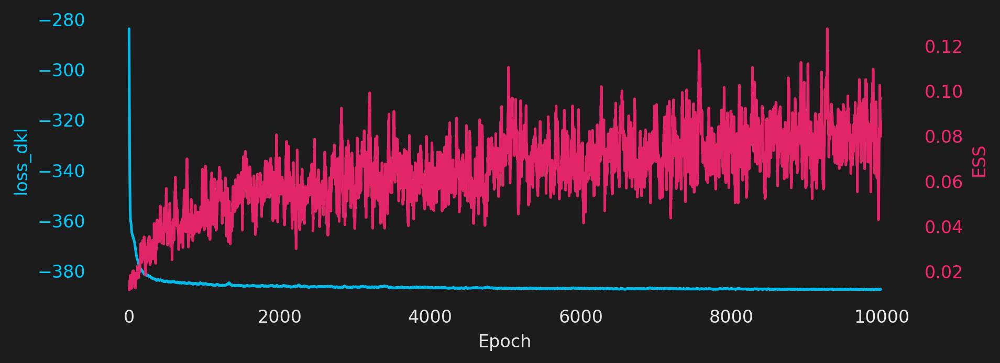

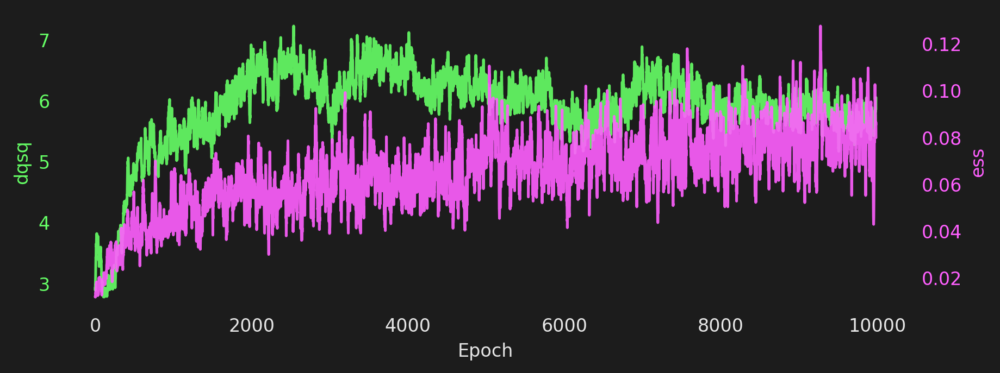

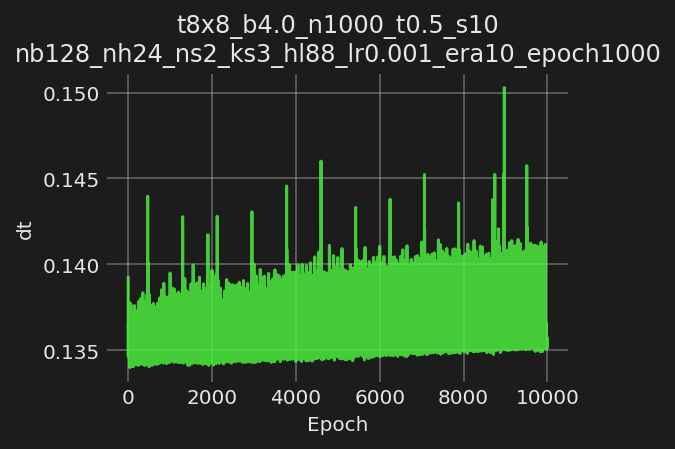

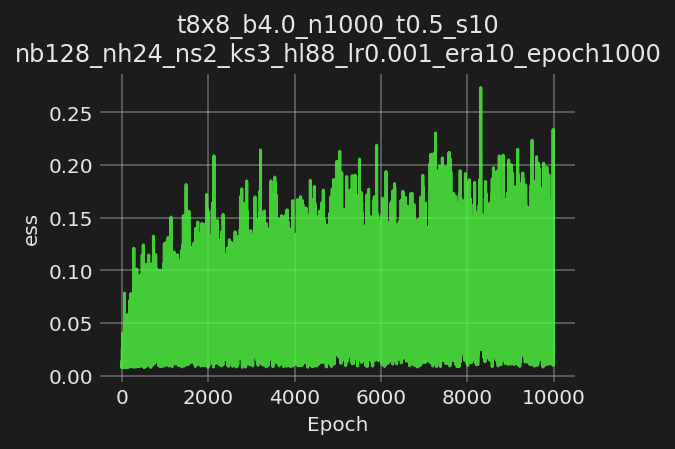

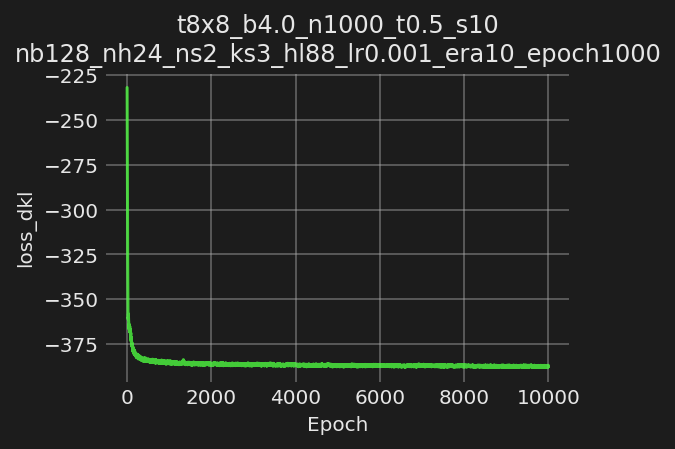

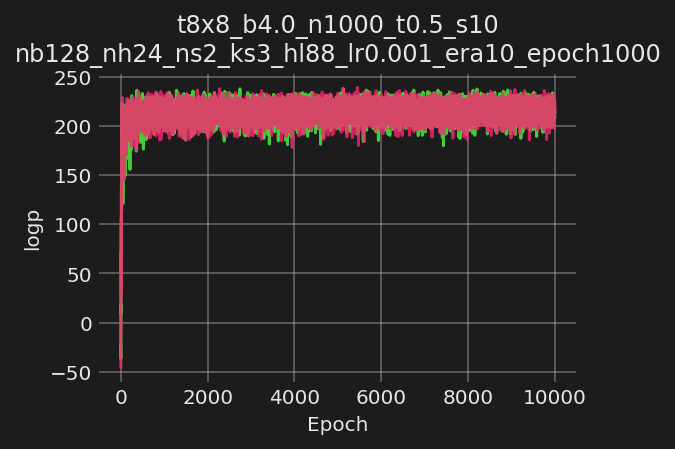

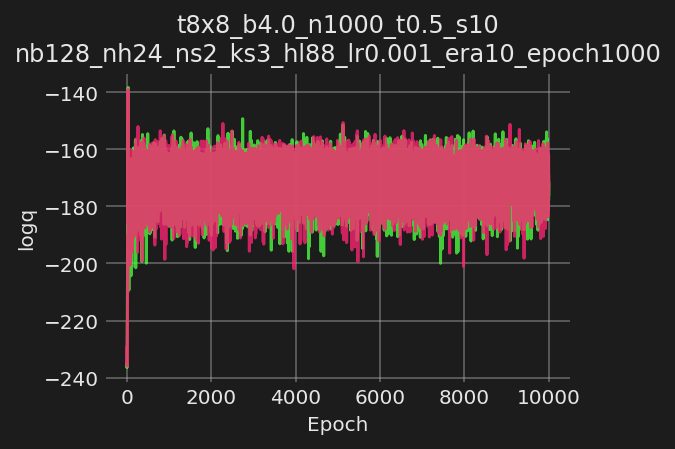

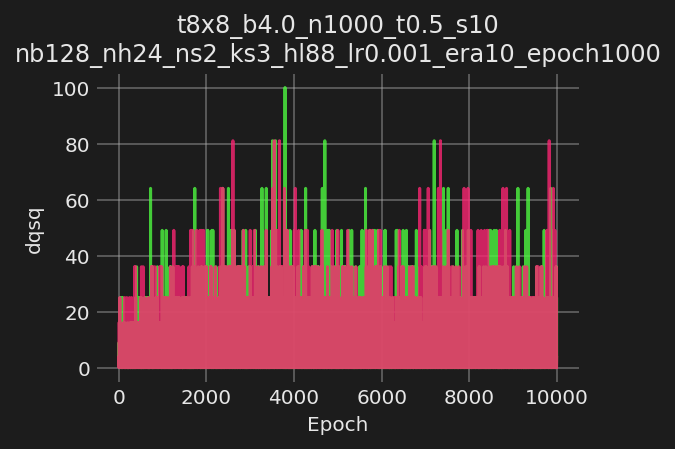

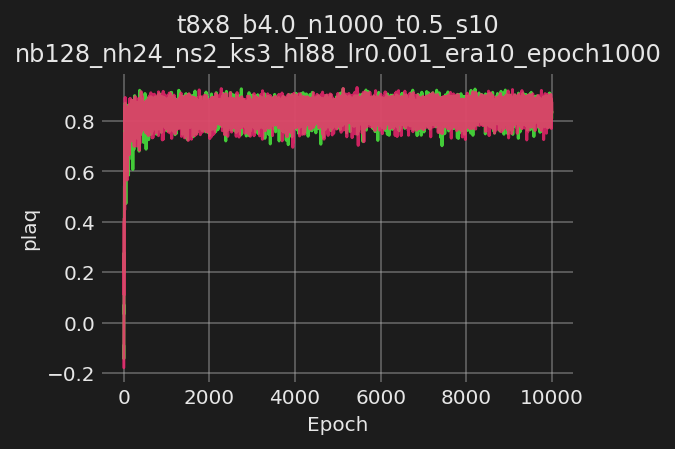

[04:17:33]  Saving train_history to ../../logs/t8x8_b4.0_n1000_t0.5_s10/nb128_nh24_ns2_ks3_hl
            88_lr0.001_era10_epoch1000/training/2021-06-23-035307/train_history.z.

[04:17:37]  Creating directory: ../../logs/t8x8_b4.0_n1000_t0.5_s10/nb128_nh24_ns2_ks3_hl88_l
            r0.001_era10_epoch1000/inference/plots

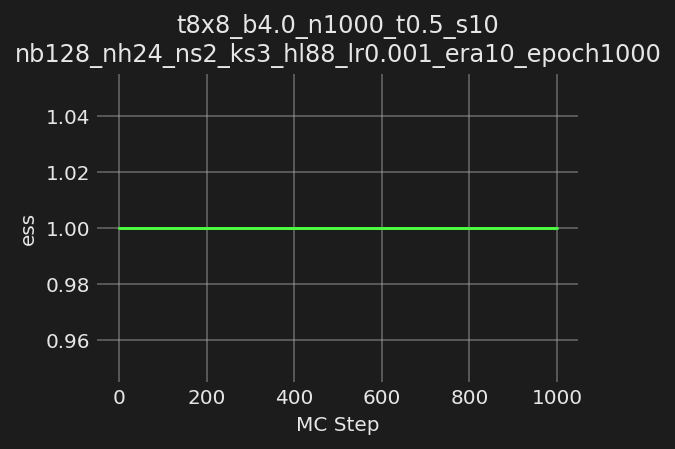

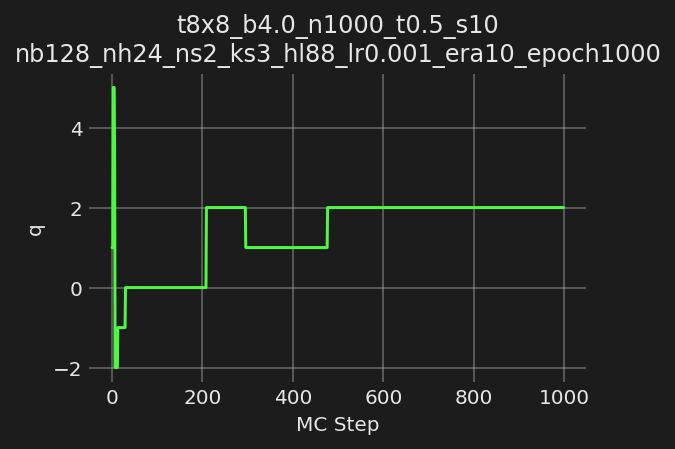

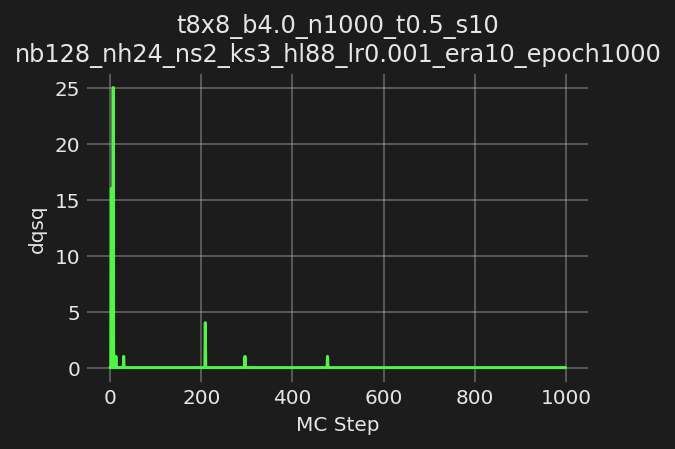

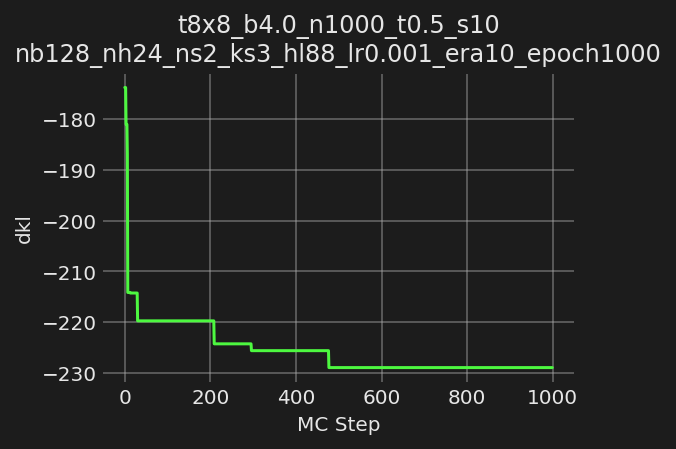

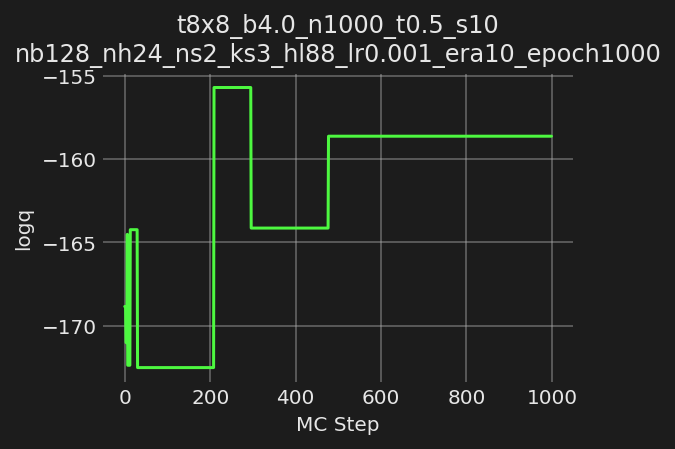

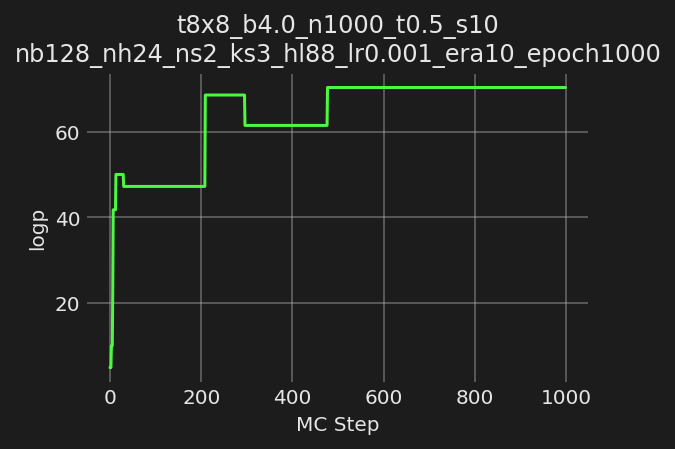

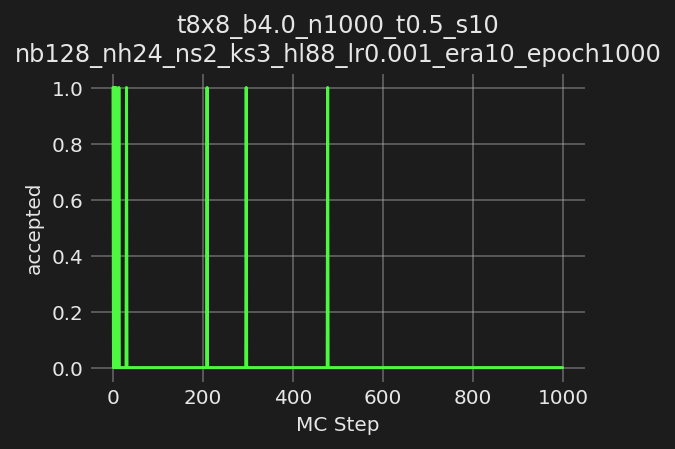

In [24]:
import numpy as np

from train import SchedulerConfig

# -------------------------------------------
# Specify `param` and `train_config` objects
# -------------------------------------------

# param.formatting:
# -----------------
# t{L}x{L}_b{beta}_n{ntraj}_t{tau}_s{nstep}

param = {
    'L': 8,
    'tau': 0.5,
    'nrun': 1,
    'beta': 4.,
    'nstep': 10,
    'ntraj': 1000,
    'nprint': 100,
    'seed': 1331,
}

param = Param(**param)
logger.log(param)

train_config = TrainConfig(**{
    'n_era': 10,
    'n_epoch': 1000,
    'n_layers': 24,
    'n_s_nets': 2,
    'hidden_sizes': [8, 8],
    'kernel_size': 3,
    'batch_size': 128,
    'print_freq': 500,
    'plot_freq': 50,
})

scheduler_config = SchedulerConfig(
    factor=0.99,
    mode='min',
    patience=50,
    min_lr=5e-6,
    verbose=True,
)

logger.log(repr(train_config))

#torch.set_num_threads(param.nth)
#torch.set_num_interop_threads(param.nth_interop)
#os.environ["OMP_NUM_THREADS"] = str(param.nth)
os.environ["KMP_BLOCKTIME"] = "0"
os.environ["KMP_SETTINGS"] = "1"
os.environ["KMP_AFFINITY"]= "granularity=fine,verbose,compact,1,0"


# train_config.uniquestr() = '_'.join([
#    f'nb{batch_size}',
#    f'nh{n_layers}',
#    f'ns{n_s_nets}',
#    f'ks{kernel_size}',
#    f'hl{hstr}',
#    f'lr{base_lr}',
#    f'era{n_era}',
#    f'epoch{n_epoch}',
# ]
 

# ------------------------------
# Run HMC using `param` above
# ------------------------------
from fthmc.hmc import run_hmc

hmc_fields, hmc_history = run_hmc(param)


# ---------------------------------------
# Train model using `train_config` above
# ---------------------------------------
from fthmc.train import train


train_outputs = train(param,
                      train_config,
                      model=None,
                      pre_model=None,
                      figsize=(8, 2.75),
                      dpi=150,
                      scheduler_config=scheduler_config)

pre_flow_plots = train_outputs['plots']
pre_flow_history = train_outputs['history']
flow_act = train_outputs['action']
pre_flow_model = train_outputs['model']
pre_flow_optimizer = train_outputs['optimizer']


# -----------------------------------------------------------
# Run inference on trained model and evaluate / plot metrics
# -----------------------------------------------------------
import fthmc.utils.qed_helpers as qed
from fthmc.utils.plot_helpers import plot_history
from fthmc.utils.samplers import make_mcmc_ensemble

action_fn = qed.BatchAction(param.beta)
dirs = train_outputs['dirs']
logdir = dirs['logdir']

inf_dir = os.path.join(logdir, 'inference')
inf_pdir = os.path.join(inf_dir, 'plots')
history = make_mcmc_ensemble(model=train_outputs['model'], action_fn=action_fn,
                             batch_size=train_config.batch_size, num_samples=1000)
plot_history(history=history,
             param=param, config=train_config, skip=['epoch', 'x'],
             num_chains=4, therm_frac=0.0, xlabel='MC Step', outdir=inf_pdir)

In [22]:
import time
import torch.nn as nn

from fthmc.utils.plot_helpers import init_live_plot, update_plot
from math import pi as PI

TWO_PI = 2. * PI

NameError: name 'sns' is not defined

In [51]:
from fthmc.utils.plot_helpers import update_plot
from fthmc.field_transformation import FieldTransformation

flow = train_outputs['model'].layers
flow.eval()

#param = Param(**{
#    'L': 8,
#    'tau': 0.5,
#    'nrun': 1,
#    'beta': 4.,
#    'nstep': 10,
#    'ntraj': 1000,
#    'nprint': 100,
#    'seed': 1331,
#})


field_transformation = FieldTransformation(flow=flow, param=param)

ModuleList(
  (0): GaugeEquivCouplingLayer(
    (plaq_coupling): NCPPlaqCouplingLayer(
      (net): Sequential(
        (0): Conv2d(2, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (1): SiLU()
        (2): Conv2d(8, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (3): SiLU()
        (4): Conv2d(8, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
      )
    )
  )
  (1): GaugeEquivCouplingLayer(
    (plaq_coupling): NCPPlaqCouplingLayer(
      (net): Sequential(
        (0): Conv2d(2, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (1): SiLU()
        (2): Conv2d(8, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (3): SiLU()
        (4): Conv2d(8, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
      )
    )
  )
  (2): GaugeEquivCouplingLayer(
    (plaq_coupling): NCPPlaqCouplingLaye

Bad value in file '~/.matplotlib/stylelib/molokai.mplstyle', line 11 ('grid.color: #404040'): Key grid.color: '' does not look like a color arg


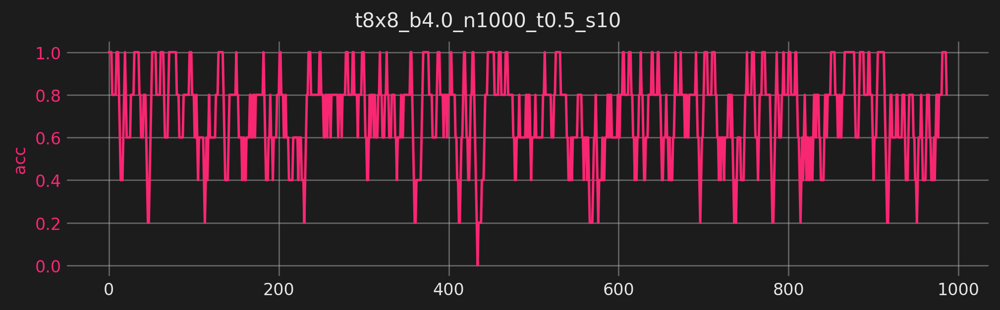

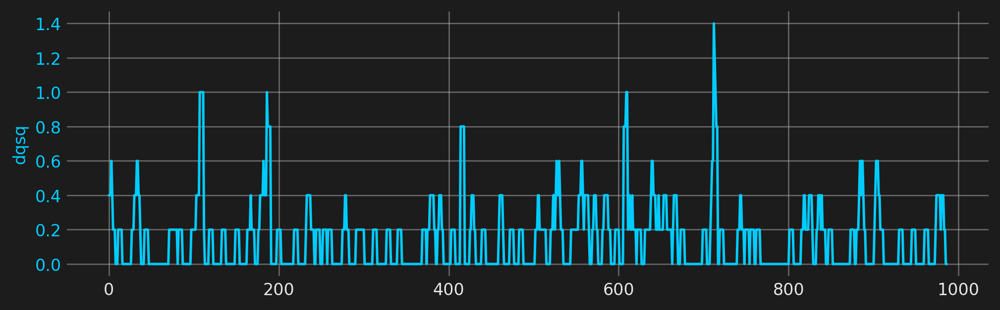

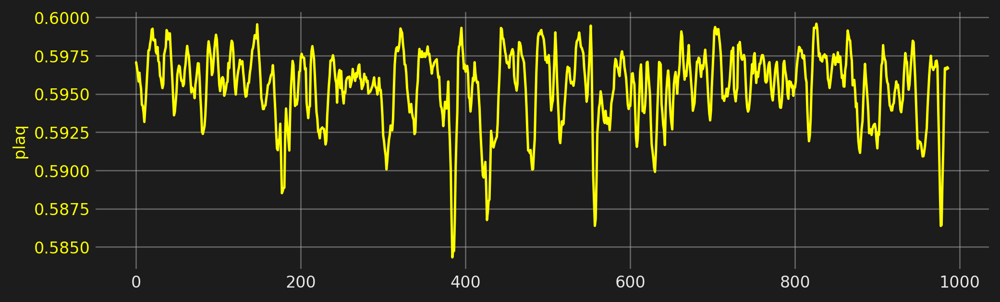

[05:14:02]  (now) traj=0 dt=1.292 acc=1.000 dH=0.008 exp_mdH=0.992 dqsq=0.000 plaq=0.600

            (avg) traj=0 dt=1.292 acc=1.000 dH=0.008 exp_mdH=0.992 dqsq=0.000 plaq=0.600

[05:14:08]  (now) traj=5 dt=1.289 acc=1.000 dH=0.006 exp_mdH=0.994 dqsq=0.000 plaq=0.598

            (avg) traj=5 dt=1.289 acc=1.000 dH=0.006 exp_mdH=0.994 dqsq=0.000 plaq=0.598

[05:14:15]  (now) traj=10 dt=1.325 acc=1.000 dH=0.020 exp_mdH=0.980 dqsq=0.000 plaq=0.596

            (avg) traj=10 dt=1.325 acc=1.000 dH=0.020 exp_mdH=0.980 dqsq=0.000 plaq=0.596

[05:14:22]  (now) traj=15 dt=1.289 acc=1.000 dH=0.491 exp_mdH=0.612 dqsq=1.000 plaq=0.600

            (avg) traj=15 dt=1.289 acc=1.000 dH=0.491 exp_mdH=0.612 dqsq=1.000 plaq=0.600

[05:14:29]  (now) traj=20 dt=1.293 acc=1.000 dH=0.006 exp_mdH=0.994 dqsq=0.000 plaq=0.601

            (avg) traj=20 dt=1.293 acc=1.000 dH=0.006 exp_mdH=0.994 dqsq=0.000 plaq=0.601

[05:14:35]  (now) traj=25 dt=1.297 acc=0.000 dH=9.811 exp_mdH=0.000 dqsq=0.000 plaq=0.597

            (avg) traj=25 dt=1.297 acc=0.000 dH=9.811 exp_mdH=0.000 dqsq=0.000 plaq=0.597

[05:14:42]  (now) traj=30 dt=1.290 acc=1.000 dH=0.002 exp_mdH=0.998 dqsq=0.000 plaq=0.599

            (avg) traj=30 dt=1.290 acc=1.000 dH=0.002 exp_mdH=0.998 dqsq=0.000 plaq=0.599

[05:14:49]  (now) traj=35 dt=1.291 acc=1.000 dH=-0.017 exp_mdH=1.017 dqsq=0.000 plaq=0.597

            (avg) traj=35 dt=1.291 acc=1.000 dH=-0.017 exp_mdH=1.017 dqsq=0.000 plaq=0.597

[05:14:56]  (now) traj=40 dt=1.290 acc=0.000 dH=1.066 exp_mdH=0.344 dqsq=0.000 plaq=0.598

            (avg) traj=40 dt=1.290 acc=0.000 dH=1.066 exp_mdH=0.344 dqsq=0.000 plaq=0.598

[05:15:02]  (now) traj=45 dt=1.294 acc=1.000 dH=-0.111 exp_mdH=1.117 dqsq=0.000 plaq=0.598

            (avg) traj=45 dt=1.294 acc=1.000 dH=-0.111 exp_mdH=1.117 dqsq=0.000 plaq=0.598

[05:15:09]  (now) traj=50 dt=1.292 acc=0.000 dH=1.361 exp_mdH=0.256 dqsq=0.000 plaq=0.593

            (avg) traj=50 dt=1.292 acc=0.000 dH=1.361 exp_mdH=0.256 dqsq=0.000 plaq=0.593

[05:15:16]  (now) traj=55 dt=1.295 acc=1.000 dH=-0.031 exp_mdH=1.032 dqsq=0.000 plaq=0.595

            (avg) traj=55 dt=1.295 acc=1.000 dH=-0.031 exp_mdH=1.032 dqsq=0.000 plaq=0.595

[05:15:23]  (now) traj=60 dt=1.293 acc=0.000 dH=26.296 exp_mdH=0.000 dqsq=0.000 plaq=0.595

            (avg) traj=60 dt=1.293 acc=0.000 dH=26.296 exp_mdH=0.000 dqsq=0.000 plaq=0.595

[05:15:29]  (now) traj=65 dt=1.291 acc=1.000 dH=0.003 exp_mdH=0.997 dqsq=0.000 plaq=0.598

            (avg) traj=65 dt=1.291 acc=1.000 dH=0.003 exp_mdH=0.997 dqsq=0.000 plaq=0.598

[05:15:36]  (now) traj=70 dt=1.296 acc=0.000 dH=19.901 exp_mdH=0.000 dqsq=0.000 plaq=0.594

            (avg) traj=70 dt=1.296 acc=0.000 dH=19.901 exp_mdH=0.000 dqsq=0.000 plaq=0.594

[05:15:43]  (now) traj=75 dt=1.294 acc=1.000 dH=-3.564 exp_mdH=35.297 dqsq=1.000 plaq=0.592

            (avg) traj=75 dt=1.294 acc=1.000 dH=-3.564 exp_mdH=35.297 dqsq=1.000 plaq=0.592

[05:15:50]  (now) traj=80 dt=1.295 acc=1.000 dH=0.239 exp_mdH=0.788 dqsq=1.000 plaq=0.592

            (avg) traj=80 dt=1.295 acc=1.000 dH=0.239 exp_mdH=0.788 dqsq=1.000 plaq=0.592

[05:15:56]  (now) traj=85 dt=1.294 acc=1.000 dH=-0.009 exp_mdH=1.009 dqsq=0.000 plaq=0.591

            (avg) traj=85 dt=1.294 acc=1.000 dH=-0.009 exp_mdH=1.009 dqsq=0.000 plaq=0.591

[05:16:03]  (now) traj=90 dt=1.298 acc=1.000 dH=-0.001 exp_mdH=1.001 dqsq=0.000 plaq=0.598

            (avg) traj=90 dt=1.298 acc=1.000 dH=-0.001 exp_mdH=1.001 dqsq=0.000 plaq=0.598

[05:16:10]  (now) traj=95 dt=1.296 acc=1.000 dH=-0.076 exp_mdH=1.079 dqsq=0.000 plaq=0.596

            (avg) traj=95 dt=1.296 acc=1.000 dH=-0.076 exp_mdH=1.079 dqsq=0.000 plaq=0.596

[05:16:17]  (now) traj=100 dt=1.303 acc=1.000 dH=0.010 exp_mdH=0.990 dqsq=0.000 plaq=0.599

            (avg) traj=100 dt=1.303 acc=1.000 dH=0.010 exp_mdH=0.990 dqsq=0.000 plaq=0.599

[05:16:23]  (now) traj=105 dt=1.301 acc=0.000 dH=2.804 exp_mdH=0.061 dqsq=0.000 plaq=0.594

            (avg) traj=105 dt=1.301 acc=0.000 dH=2.804 exp_mdH=0.061 dqsq=0.000 plaq=0.594

[05:16:30]  (now) traj=110 dt=1.300 acc=1.000 dH=-0.005 exp_mdH=1.005 dqsq=0.000 plaq=0.594

            (avg) traj=110 dt=1.300 acc=1.000 dH=-0.005 exp_mdH=1.005 dqsq=0.000 plaq=0.594

[05:16:37]  (now) traj=115 dt=1.298 acc=1.000 dH=-0.242 exp_mdH=1.274 dqsq=0.000 plaq=0.594

            (avg) traj=115 dt=1.298 acc=1.000 dH=-0.242 exp_mdH=1.274 dqsq=0.000 plaq=0.594

[05:16:44]  (now) traj=120 dt=1.297 acc=0.000 dH=7.788 exp_mdH=0.000 dqsq=0.000 plaq=0.596

            (avg) traj=120 dt=1.297 acc=0.000 dH=7.788 exp_mdH=0.000 dqsq=0.000 plaq=0.596

[05:16:50]  (now) traj=125 dt=1.292 acc=0.000 dH=1.660 exp_mdH=0.190 dqsq=0.000 plaq=0.594

            (avg) traj=125 dt=1.292 acc=0.000 dH=1.660 exp_mdH=0.190 dqsq=0.000 plaq=0.594

[05:16:57]  (now) traj=130 dt=1.294 acc=1.000 dH=0.022 exp_mdH=0.979 dqsq=0.000 plaq=0.596

            (avg) traj=130 dt=1.294 acc=1.000 dH=0.022 exp_mdH=0.979 dqsq=0.000 plaq=0.596

[05:17:04]  (now) traj=135 dt=1.297 acc=1.000 dH=0.002 exp_mdH=0.998 dqsq=0.000 plaq=0.594

            (avg) traj=135 dt=1.297 acc=1.000 dH=0.002 exp_mdH=0.998 dqsq=0.000 plaq=0.594

[05:17:11]  (now) traj=140 dt=1.293 acc=0.000 dH=60.769 exp_mdH=0.000 dqsq=0.000 plaq=0.595

            (avg) traj=140 dt=1.293 acc=0.000 dH=60.769 exp_mdH=0.000 dqsq=0.000 plaq=0.595

[05:17:17]  (now) traj=145 dt=1.292 acc=1.000 dH=0.011 exp_mdH=0.989 dqsq=0.000 plaq=0.599

            (avg) traj=145 dt=1.292 acc=1.000 dH=0.011 exp_mdH=0.989 dqsq=0.000 plaq=0.599

[05:17:24]  (now) traj=150 dt=1.296 acc=1.000 dH=0.003 exp_mdH=0.997 dqsq=0.000 plaq=0.598

[05:17:25]  (avg) traj=150 dt=1.296 acc=1.000 dH=0.003 exp_mdH=0.997 dqsq=0.000 plaq=0.598

[05:17:31]  (now) traj=155 dt=1.297 acc=0.000 dH=4.012 exp_mdH=0.018 dqsq=0.000 plaq=0.594

            (avg) traj=155 dt=1.297 acc=0.000 dH=4.012 exp_mdH=0.018 dqsq=0.000 plaq=0.594

[05:17:38]  (now) traj=160 dt=1.299 acc=0.000 dH=337.328 exp_mdH=0.000 dqsq=0.000 plaq=0.595

            (avg) traj=160 dt=1.299 acc=0.000 dH=337.328 exp_mdH=0.000 dqsq=0.000 plaq=0.595

[05:17:45]  (now) traj=165 dt=1.297 acc=0.000 dH=1058.834 exp_mdH=0.000 dqsq=0.000 plaq=0.595

            (avg) traj=165 dt=1.297 acc=0.000 dH=1058.834 exp_mdH=0.000 dqsq=0.000 plaq=0.595

[05:17:52]  (now) traj=170 dt=1.299 acc=1.000 dH=-0.006 exp_mdH=1.006 dqsq=0.000 plaq=0.598

            (avg) traj=170 dt=1.299 acc=1.000 dH=-0.006 exp_mdH=1.006 dqsq=0.000 plaq=0.598

[05:17:58]  (now) traj=175 dt=1.305 acc=1.000 dH=0.002 exp_mdH=0.998 dqsq=0.000 plaq=0.593

            (avg) traj=175 dt=1.305 acc=1.000 dH=0.002 exp_mdH=0.998 dqsq=0.000 plaq=0.593

[05:18:05]  (now) traj=180 dt=1.300 acc=1.000 dH=-0.386 exp_mdH=1.471 dqsq=1.000 plaq=0.582

            (avg) traj=180 dt=1.300 acc=1.000 dH=-0.386 exp_mdH=1.471 dqsq=1.000 plaq=0.582

[05:18:12]  (now) traj=185 dt=1.305 acc=1.000 dH=0.949 exp_mdH=0.387 dqsq=1.000 plaq=0.599

            (avg) traj=185 dt=1.305 acc=1.000 dH=0.949 exp_mdH=0.387 dqsq=1.000 plaq=0.599

[05:18:19]  (now) traj=190 dt=1.304 acc=1.000 dH=-0.216 exp_mdH=1.241 dqsq=4.000 plaq=0.596

            (avg) traj=190 dt=1.304 acc=1.000 dH=-0.216 exp_mdH=1.241 dqsq=4.000 plaq=0.596

[05:18:25]  (now) traj=195 dt=1.301 acc=0.000 dH=4.987 exp_mdH=0.007 dqsq=0.000 plaq=0.595

            (avg) traj=195 dt=1.301 acc=0.000 dH=4.987 exp_mdH=0.007 dqsq=0.000 plaq=0.595

[05:18:32]  (now) traj=200 dt=1.299 acc=0.000 dH=5.528 exp_mdH=0.004 dqsq=0.000 plaq=0.596

            (avg) traj=200 dt=1.299 acc=0.000 dH=5.528 exp_mdH=0.004 dqsq=0.000 plaq=0.596

[05:18:39]  (now) traj=205 dt=1.298 acc=1.000 dH=0.005 exp_mdH=0.995 dqsq=0.000 plaq=0.597

            (avg) traj=205 dt=1.298 acc=1.000 dH=0.005 exp_mdH=0.995 dqsq=0.000 plaq=0.597

[05:18:46]  (now) traj=210 dt=1.297 acc=0.000 dH=176.694 exp_mdH=0.000 dqsq=0.000 plaq=0.598

            (avg) traj=210 dt=1.297 acc=0.000 dH=176.694 exp_mdH=0.000 dqsq=0.000 plaq=0.598

[05:18:53]  (now) traj=215 dt=1.298 acc=0.000 dH=0.982 exp_mdH=0.375 dqsq=0.000 plaq=0.598

            (avg) traj=215 dt=1.298 acc=0.000 dH=0.982 exp_mdH=0.375 dqsq=0.000 plaq=0.598

[05:19:00]  (now) traj=220 dt=1.301 acc=0.000 dH=31.378 exp_mdH=0.000 dqsq=0.000 plaq=0.596

            (avg) traj=220 dt=1.301 acc=0.000 dH=31.378 exp_mdH=0.000 dqsq=0.000 plaq=0.596

[05:19:06]  (now) traj=225 dt=1.301 acc=0.000 dH=6.355 exp_mdH=0.002 dqsq=0.000 plaq=0.592

            (avg) traj=225 dt=1.301 acc=0.000 dH=6.355 exp_mdH=0.002 dqsq=0.000 plaq=0.592

[05:19:13]  (now) traj=230 dt=1.298 acc=0.000 dH=56.101 exp_mdH=0.000 dqsq=0.000 plaq=0.592

            (avg) traj=230 dt=1.298 acc=0.000 dH=56.101 exp_mdH=0.000 dqsq=0.000 plaq=0.592

[05:19:20]  (now) traj=235 dt=1.304 acc=1.000 dH=0.010 exp_mdH=0.990 dqsq=0.000 plaq=0.593

            (avg) traj=235 dt=1.304 acc=1.000 dH=0.010 exp_mdH=0.990 dqsq=0.000 plaq=0.593

[05:19:27]  (now) traj=240 dt=1.293 acc=1.000 dH=0.012 exp_mdH=0.989 dqsq=0.000 plaq=0.598

            (avg) traj=240 dt=1.293 acc=1.000 dH=0.012 exp_mdH=0.989 dqsq=0.000 plaq=0.598

[05:19:33]  (now) traj=245 dt=1.295 acc=1.000 dH=-0.007 exp_mdH=1.007 dqsq=0.000 plaq=0.595

            (avg) traj=245 dt=1.295 acc=1.000 dH=-0.007 exp_mdH=1.007 dqsq=0.000 plaq=0.595

[05:19:40]  (now) traj=250 dt=1.297 acc=1.000 dH=0.028 exp_mdH=0.973 dqsq=0.000 plaq=0.597

            (avg) traj=250 dt=1.297 acc=1.000 dH=0.028 exp_mdH=0.973 dqsq=0.000 plaq=0.597

[05:19:47]  (now) traj=255 dt=1.300 acc=1.000 dH=-0.004 exp_mdH=1.004 dqsq=0.000 plaq=0.594

            (avg) traj=255 dt=1.300 acc=1.000 dH=-0.004 exp_mdH=1.004 dqsq=0.000 plaq=0.594

[05:19:54]  (now) traj=260 dt=1.297 acc=1.000 dH=-0.012 exp_mdH=1.012 dqsq=0.000 plaq=0.595

            (avg) traj=260 dt=1.297 acc=1.000 dH=-0.012 exp_mdH=1.012 dqsq=0.000 plaq=0.595

[05:20:00]  (now) traj=265 dt=1.298 acc=0.000 dH=16.733 exp_mdH=0.000 dqsq=0.000 plaq=0.596

            (avg) traj=265 dt=1.298 acc=0.000 dH=16.733 exp_mdH=0.000 dqsq=0.000 plaq=0.596

[05:20:07]  (now) traj=270 dt=1.295 acc=0.000 dH=81.104 exp_mdH=0.000 dqsq=0.000 plaq=0.595

            (avg) traj=270 dt=1.295 acc=0.000 dH=81.104 exp_mdH=0.000 dqsq=0.000 plaq=0.595

[05:20:14]  (now) traj=275 dt=1.298 acc=1.000 dH=-1.834 exp_mdH=6.256 dqsq=0.000 plaq=0.596

            (avg) traj=275 dt=1.298 acc=1.000 dH=-1.834 exp_mdH=6.256 dqsq=0.000 plaq=0.596

[05:20:21]  (now) traj=280 dt=1.299 acc=1.000 dH=0.004 exp_mdH=0.996 dqsq=0.000 plaq=0.596

            (avg) traj=280 dt=1.299 acc=1.000 dH=0.004 exp_mdH=0.996 dqsq=0.000 plaq=0.596

[05:20:27]  (now) traj=285 dt=1.300 acc=1.000 dH=0.005 exp_mdH=0.995 dqsq=0.000 plaq=0.597

            (avg) traj=285 dt=1.300 acc=1.000 dH=0.005 exp_mdH=0.995 dqsq=0.000 plaq=0.597

[05:20:34]  (now) traj=290 dt=1.297 acc=1.000 dH=0.005 exp_mdH=0.995 dqsq=0.000 plaq=0.598

            (avg) traj=290 dt=1.297 acc=1.000 dH=0.005 exp_mdH=0.995 dqsq=0.000 plaq=0.598

[05:20:41]  (now) traj=295 dt=1.297 acc=1.000 dH=0.935 exp_mdH=0.393 dqsq=1.000 plaq=0.597

            (avg) traj=295 dt=1.297 acc=1.000 dH=0.935 exp_mdH=0.393 dqsq=1.000 plaq=0.597

[05:20:48]  (now) traj=300 dt=1.304 acc=1.000 dH=-0.169 exp_mdH=1.184 dqsq=1.000 plaq=0.593

            (avg) traj=300 dt=1.304 acc=1.000 dH=-0.169 exp_mdH=1.184 dqsq=1.000 plaq=0.593

[05:20:55]  (now) traj=305 dt=1.301 acc=0.000 dH=4.927 exp_mdH=0.007 dqsq=0.000 plaq=0.591

            (avg) traj=305 dt=1.301 acc=0.000 dH=4.927 exp_mdH=0.007 dqsq=0.000 plaq=0.591

[05:21:02]  (now) traj=310 dt=1.300 acc=1.000 dH=1.253 exp_mdH=0.286 dqsq=0.000 plaq=0.595

            (avg) traj=310 dt=1.300 acc=1.000 dH=1.253 exp_mdH=0.286 dqsq=0.000 plaq=0.595

[05:21:08]  (now) traj=315 dt=1.303 acc=1.000 dH=-0.378 exp_mdH=1.460 dqsq=1.000 plaq=0.595

            (avg) traj=315 dt=1.303 acc=1.000 dH=-0.378 exp_mdH=1.460 dqsq=1.000 plaq=0.595

[05:21:15]  (now) traj=320 dt=1.306 acc=1.000 dH=-0.028 exp_mdH=1.029 dqsq=0.000 plaq=0.596

            (avg) traj=320 dt=1.306 acc=1.000 dH=-0.028 exp_mdH=1.029 dqsq=0.000 plaq=0.596

[05:21:22]  (now) traj=325 dt=1.305 acc=1.000 dH=0.022 exp_mdH=0.978 dqsq=0.000 plaq=0.601

            (avg) traj=325 dt=1.305 acc=1.000 dH=0.022 exp_mdH=0.978 dqsq=0.000 plaq=0.601

[05:21:29]  (now) traj=330 dt=1.301 acc=1.000 dH=-0.014 exp_mdH=1.014 dqsq=0.000 plaq=0.596

            (avg) traj=330 dt=1.301 acc=1.000 dH=-0.014 exp_mdH=1.014 dqsq=0.000 plaq=0.596

[05:21:35]  (now) traj=335 dt=1.301 acc=1.000 dH=0.010 exp_mdH=0.990 dqsq=0.000 plaq=0.594

            (avg) traj=335 dt=1.301 acc=1.000 dH=0.010 exp_mdH=0.990 dqsq=0.000 plaq=0.594

[05:21:42]  (now) traj=340 dt=1.300 acc=1.000 dH=-0.090 exp_mdH=1.094 dqsq=0.000 plaq=0.593

            (avg) traj=340 dt=1.300 acc=1.000 dH=-0.090 exp_mdH=1.094 dqsq=0.000 plaq=0.593

[05:21:49]  (now) traj=345 dt=1.300 acc=1.000 dH=0.009 exp_mdH=0.991 dqsq=0.000 plaq=0.599

            (avg) traj=345 dt=1.300 acc=1.000 dH=0.009 exp_mdH=0.991 dqsq=0.000 plaq=0.599

[05:21:56]  (now) traj=350 dt=1.301 acc=1.000 dH=-0.039 exp_mdH=1.040 dqsq=0.000 plaq=0.598

            (avg) traj=350 dt=1.301 acc=1.000 dH=-0.039 exp_mdH=1.040 dqsq=0.000 plaq=0.598

[05:22:03]  (now) traj=355 dt=1.306 acc=1.000 dH=-0.334 exp_mdH=1.396 dqsq=0.000 plaq=0.597

            (avg) traj=355 dt=1.306 acc=1.000 dH=-0.334 exp_mdH=1.396 dqsq=0.000 plaq=0.597

[05:22:10]  (now) traj=360 dt=1.301 acc=1.000 dH=-0.083 exp_mdH=1.087 dqsq=0.000 plaq=0.597

            (avg) traj=360 dt=1.301 acc=1.000 dH=-0.083 exp_mdH=1.087 dqsq=0.000 plaq=0.597

[05:22:16]  (now) traj=365 dt=1.304 acc=1.000 dH=-0.028 exp_mdH=1.028 dqsq=0.000 plaq=0.598

            (avg) traj=365 dt=1.304 acc=1.000 dH=-0.028 exp_mdH=1.028 dqsq=0.000 plaq=0.598

[05:22:23]  (now) traj=370 dt=1.300 acc=1.000 dH=-0.681 exp_mdH=1.977 dqsq=0.000 plaq=0.594

            (avg) traj=370 dt=1.300 acc=1.000 dH=-0.681 exp_mdH=1.977 dqsq=0.000 plaq=0.594

[05:22:30]  (now) traj=375 dt=1.297 acc=1.000 dH=0.002 exp_mdH=0.998 dqsq=0.000 plaq=0.594

            (avg) traj=375 dt=1.297 acc=1.000 dH=0.002 exp_mdH=0.998 dqsq=0.000 plaq=0.594

[05:22:37]  (now) traj=380 dt=1.300 acc=1.000 dH=-0.065 exp_mdH=1.067 dqsq=0.000 plaq=0.592

            (avg) traj=380 dt=1.300 acc=1.000 dH=-0.065 exp_mdH=1.067 dqsq=0.000 plaq=0.592

[05:22:44]  (now) traj=385 dt=1.301 acc=0.000 dH=5.396 exp_mdH=0.005 dqsq=0.000 plaq=0.585

            (avg) traj=385 dt=1.301 acc=0.000 dH=5.396 exp_mdH=0.005 dqsq=0.000 plaq=0.585

[05:22:51]  (now) traj=390 dt=1.295 acc=1.000 dH=-0.137 exp_mdH=1.147 dqsq=0.000 plaq=0.585

            (avg) traj=390 dt=1.295 acc=1.000 dH=-0.137 exp_mdH=1.147 dqsq=0.000 plaq=0.585

[05:22:57]  (now) traj=395 dt=1.302 acc=1.000 dH=-0.060 exp_mdH=1.061 dqsq=0.000 plaq=0.602

            (avg) traj=395 dt=1.302 acc=1.000 dH=-0.060 exp_mdH=1.061 dqsq=0.000 plaq=0.602

[05:23:04]  (now) traj=400 dt=1.301 acc=1.000 dH=0.007 exp_mdH=0.993 dqsq=0.000 plaq=0.597

            (avg) traj=400 dt=1.301 acc=1.000 dH=0.007 exp_mdH=0.993 dqsq=0.000 plaq=0.597

[05:23:11]  (now) traj=405 dt=1.299 acc=1.000 dH=0.001 exp_mdH=0.999 dqsq=0.000 plaq=0.597

            (avg) traj=405 dt=1.299 acc=1.000 dH=0.001 exp_mdH=0.999 dqsq=0.000 plaq=0.597

[05:23:18]  (now) traj=410 dt=1.298 acc=1.000 dH=-0.005 exp_mdH=1.005 dqsq=0.000 plaq=0.593

            (avg) traj=410 dt=1.298 acc=1.000 dH=-0.005 exp_mdH=1.005 dqsq=0.000 plaq=0.593

[05:23:24]  (now) traj=415 dt=1.295 acc=1.000 dH=0.011 exp_mdH=0.989 dqsq=0.000 plaq=0.599

            (avg) traj=415 dt=1.295 acc=1.000 dH=0.011 exp_mdH=0.989 dqsq=0.000 plaq=0.599

[05:23:31]  (now) traj=420 dt=1.301 acc=1.000 dH=-0.044 exp_mdH=1.044 dqsq=0.000 plaq=0.595

            (avg) traj=420 dt=1.301 acc=1.000 dH=-0.044 exp_mdH=1.044 dqsq=0.000 plaq=0.595

[05:23:38]  (now) traj=425 dt=1.296 acc=0.000 dH=40.717 exp_mdH=0.000 dqsq=0.000 plaq=0.590

            (avg) traj=425 dt=1.296 acc=0.000 dH=40.717 exp_mdH=0.000 dqsq=0.000 plaq=0.590

[05:23:45]  (now) traj=430 dt=1.293 acc=1.000 dH=-0.008 exp_mdH=1.008 dqsq=0.000 plaq=0.579

            (avg) traj=430 dt=1.293 acc=1.000 dH=-0.008 exp_mdH=1.008 dqsq=0.000 plaq=0.579

[05:23:51]  (now) traj=435 dt=1.295 acc=0.000 dH=16.919 exp_mdH=0.000 dqsq=0.000 plaq=0.592

            (avg) traj=435 dt=1.295 acc=0.000 dH=16.919 exp_mdH=0.000 dqsq=0.000 plaq=0.592

[05:23:58]  (now) traj=440 dt=1.293 acc=0.000 dH=7.857 exp_mdH=0.000 dqsq=0.000 plaq=0.593

            (avg) traj=440 dt=1.293 acc=0.000 dH=7.857 exp_mdH=0.000 dqsq=0.000 plaq=0.593

[05:24:05]  (now) traj=445 dt=1.295 acc=0.000 dH=57.595 exp_mdH=0.000 dqsq=0.000 plaq=0.598

            (avg) traj=445 dt=1.295 acc=0.000 dH=57.595 exp_mdH=0.000 dqsq=0.000 plaq=0.598

[05:24:12]  (now) traj=450 dt=1.294 acc=1.000 dH=0.017 exp_mdH=0.983 dqsq=0.000 plaq=0.598

            (avg) traj=450 dt=1.294 acc=1.000 dH=0.017 exp_mdH=0.983 dqsq=0.000 plaq=0.598

[05:24:19]  (now) traj=455 dt=1.296 acc=1.000 dH=-0.004 exp_mdH=1.004 dqsq=0.000 plaq=0.598

            (avg) traj=455 dt=1.296 acc=1.000 dH=-0.004 exp_mdH=1.004 dqsq=0.000 plaq=0.598

[05:24:26]  (now) traj=460 dt=1.299 acc=1.000 dH=-0.260 exp_mdH=1.297 dqsq=0.000 plaq=0.599

            (avg) traj=460 dt=1.299 acc=1.000 dH=-0.260 exp_mdH=1.297 dqsq=0.000 plaq=0.599

[05:24:32]  (now) traj=465 dt=1.299 acc=1.000 dH=0.001 exp_mdH=0.999 dqsq=0.000 plaq=0.598

            (avg) traj=465 dt=1.299 acc=1.000 dH=0.001 exp_mdH=0.999 dqsq=0.000 plaq=0.598

[05:24:39]  (now) traj=470 dt=1.293 acc=1.000 dH=0.009 exp_mdH=0.991 dqsq=0.000 plaq=0.598

            (avg) traj=470 dt=1.293 acc=1.000 dH=0.009 exp_mdH=0.991 dqsq=0.000 plaq=0.598

[05:24:46]  (now) traj=475 dt=1.293 acc=1.000 dH=0.008 exp_mdH=0.992 dqsq=0.000 plaq=0.597

            (avg) traj=475 dt=1.293 acc=1.000 dH=0.008 exp_mdH=0.992 dqsq=0.000 plaq=0.597

[05:24:53]  (now) traj=480 dt=1.294 acc=0.000 dH=9.048 exp_mdH=0.000 dqsq=0.000 plaq=0.590

            (avg) traj=480 dt=1.294 acc=0.000 dH=9.048 exp_mdH=0.000 dqsq=0.000 plaq=0.590

[05:24:59]  (now) traj=485 dt=1.298 acc=0.000 dH=103.617 exp_mdH=0.000 dqsq=0.000 plaq=0.588

            (avg) traj=485 dt=1.298 acc=0.000 dH=103.617 exp_mdH=0.000 dqsq=0.000 plaq=0.588

[05:25:06]  (now) traj=490 dt=1.289 acc=0.000 dH=22.668 exp_mdH=0.000 dqsq=0.000 plaq=0.598

            (avg) traj=490 dt=1.289 acc=0.000 dH=22.668 exp_mdH=0.000 dqsq=0.000 plaq=0.598

[05:25:13]  (now) traj=495 dt=1.292 acc=1.000 dH=0.009 exp_mdH=0.991 dqsq=0.000 plaq=0.599

            (avg) traj=495 dt=1.292 acc=1.000 dH=0.009 exp_mdH=0.991 dqsq=0.000 plaq=0.599

[05:25:20]  (now) traj=500 dt=1.295 acc=0.000 dH=279.054 exp_mdH=0.000 dqsq=0.000 plaq=0.596

            (avg) traj=500 dt=1.295 acc=0.000 dH=279.054 exp_mdH=0.000 dqsq=0.000 plaq=0.596

[05:25:26]  (now) traj=505 dt=1.295 acc=0.000 dH=0.335 exp_mdH=0.715 dqsq=0.000 plaq=0.598

            (avg) traj=505 dt=1.295 acc=0.000 dH=0.335 exp_mdH=0.715 dqsq=0.000 plaq=0.598

[05:25:33]  (now) traj=510 dt=1.295 acc=0.000 dH=1.285 exp_mdH=0.277 dqsq=0.000 plaq=0.599

            (avg) traj=510 dt=1.295 acc=0.000 dH=1.285 exp_mdH=0.277 dqsq=0.000 plaq=0.599

[05:25:40]  (now) traj=515 dt=1.293 acc=1.000 dH=0.020 exp_mdH=0.981 dqsq=0.000 plaq=0.590

            (avg) traj=515 dt=1.293 acc=1.000 dH=0.020 exp_mdH=0.981 dqsq=0.000 plaq=0.590

[05:25:47]  (now) traj=520 dt=1.290 acc=1.000 dH=-0.030 exp_mdH=1.031 dqsq=0.000 plaq=0.594

            (avg) traj=520 dt=1.290 acc=1.000 dH=-0.030 exp_mdH=1.031 dqsq=0.000 plaq=0.594

[05:25:53]  (now) traj=525 dt=1.287 acc=0.000 dH=4.335 exp_mdH=0.013 dqsq=0.000 plaq=0.597

            (avg) traj=525 dt=1.287 acc=0.000 dH=4.335 exp_mdH=0.013 dqsq=0.000 plaq=0.597

[05:26:00]  (now) traj=530 dt=1.286 acc=1.000 dH=-1.082 exp_mdH=2.950 dqsq=1.000 plaq=0.598

            (avg) traj=530 dt=1.286 acc=1.000 dH=-1.082 exp_mdH=2.950 dqsq=1.000 plaq=0.598

[05:26:07]  (now) traj=535 dt=1.287 acc=1.000 dH=-1.090 exp_mdH=2.973 dqsq=0.000 plaq=0.597

            (avg) traj=535 dt=1.287 acc=1.000 dH=-1.090 exp_mdH=2.973 dqsq=0.000 plaq=0.597

[05:26:14]  (now) traj=540 dt=1.287 acc=1.000 dH=0.011 exp_mdH=0.989 dqsq=0.000 plaq=0.598

            (avg) traj=540 dt=1.287 acc=1.000 dH=0.011 exp_mdH=0.989 dqsq=0.000 plaq=0.598

[05:26:20]  (now) traj=545 dt=1.285 acc=0.000 dH=55.563 exp_mdH=0.000 dqsq=0.000 plaq=0.597

            (avg) traj=545 dt=1.285 acc=0.000 dH=55.563 exp_mdH=0.000 dqsq=0.000 plaq=0.597

[05:26:27]  (now) traj=550 dt=1.287 acc=1.000 dH=0.005 exp_mdH=0.995 dqsq=0.000 plaq=0.593

            (avg) traj=550 dt=1.287 acc=1.000 dH=0.005 exp_mdH=0.995 dqsq=0.000 plaq=0.593

[05:26:34]  (now) traj=555 dt=1.289 acc=1.000 dH=0.005 exp_mdH=0.995 dqsq=0.000 plaq=0.600

            (avg) traj=555 dt=1.289 acc=1.000 dH=0.005 exp_mdH=0.995 dqsq=0.000 plaq=0.600

[05:26:41]  (now) traj=560 dt=1.291 acc=1.000 dH=-2.284 exp_mdH=9.815 dqsq=1.000 plaq=0.592

            (avg) traj=560 dt=1.291 acc=1.000 dH=-2.284 exp_mdH=9.815 dqsq=1.000 plaq=0.592

[05:26:47]  (now) traj=565 dt=1.288 acc=1.000 dH=-0.500 exp_mdH=1.648 dqsq=1.000 plaq=0.595

            (avg) traj=565 dt=1.288 acc=1.000 dH=-0.500 exp_mdH=1.648 dqsq=1.000 plaq=0.595

[05:26:54]  (now) traj=570 dt=1.290 acc=0.000 dH=29.133 exp_mdH=0.000 dqsq=0.000 plaq=0.593

            (avg) traj=570 dt=1.290 acc=0.000 dH=29.133 exp_mdH=0.000 dqsq=0.000 plaq=0.593

[05:27:00]  (now) traj=575 dt=1.283 acc=1.000 dH=-0.212 exp_mdH=1.237 dqsq=1.000 plaq=0.590

            (avg) traj=575 dt=1.283 acc=1.000 dH=-0.212 exp_mdH=1.237 dqsq=1.000 plaq=0.590

[05:27:07]  (now) traj=580 dt=1.289 acc=0.000 dH=0.856 exp_mdH=0.425 dqsq=0.000 plaq=0.594

            (avg) traj=580 dt=1.289 acc=0.000 dH=0.856 exp_mdH=0.425 dqsq=0.000 plaq=0.594

[05:27:14]  (now) traj=585 dt=1.288 acc=1.000 dH=-0.877 exp_mdH=2.404 dqsq=1.000 plaq=0.601

            (avg) traj=585 dt=1.288 acc=1.000 dH=-0.877 exp_mdH=2.404 dqsq=1.000 plaq=0.601

[05:27:21]  (now) traj=590 dt=1.287 acc=1.000 dH=0.263 exp_mdH=0.769 dqsq=1.000 plaq=0.599

            (avg) traj=590 dt=1.287 acc=1.000 dH=0.263 exp_mdH=0.769 dqsq=1.000 plaq=0.599

[05:27:27]  (now) traj=595 dt=1.290 acc=1.000 dH=0.340 exp_mdH=0.712 dqsq=0.000 plaq=0.597

            (avg) traj=595 dt=1.290 acc=1.000 dH=0.340 exp_mdH=0.712 dqsq=0.000 plaq=0.597

[05:27:34]  (now) traj=600 dt=1.288 acc=1.000 dH=0.802 exp_mdH=0.449 dqsq=1.000 plaq=0.593

            (avg) traj=600 dt=1.288 acc=1.000 dH=0.802 exp_mdH=0.449 dqsq=1.000 plaq=0.593

[05:27:41]  (now) traj=605 dt=1.281 acc=1.000 dH=0.004 exp_mdH=0.996 dqsq=0.000 plaq=0.598

            (avg) traj=605 dt=1.281 acc=1.000 dH=0.004 exp_mdH=0.996 dqsq=0.000 plaq=0.598

[05:27:48]  (now) traj=610 dt=1.287 acc=1.000 dH=-0.458 exp_mdH=1.580 dqsq=4.000 plaq=0.589

            (avg) traj=610 dt=1.287 acc=1.000 dH=-0.458 exp_mdH=1.580 dqsq=4.000 plaq=0.589

[05:27:54]  (now) traj=615 dt=1.290 acc=1.000 dH=-0.169 exp_mdH=1.184 dqsq=0.000 plaq=0.596

            (avg) traj=615 dt=1.290 acc=1.000 dH=-0.169 exp_mdH=1.184 dqsq=0.000 plaq=0.596

[05:28:01]  (now) traj=620 dt=1.288 acc=1.000 dH=0.736 exp_mdH=0.479 dqsq=1.000 plaq=0.597

            (avg) traj=620 dt=1.288 acc=1.000 dH=0.736 exp_mdH=0.479 dqsq=1.000 plaq=0.597

[05:28:08]  (now) traj=625 dt=1.291 acc=0.000 dH=3.410 exp_mdH=0.033 dqsq=0.000 plaq=0.597

            (avg) traj=625 dt=1.291 acc=0.000 dH=3.410 exp_mdH=0.033 dqsq=0.000 plaq=0.597

[05:28:15]  (now) traj=630 dt=1.293 acc=1.000 dH=0.042 exp_mdH=0.958 dqsq=0.000 plaq=0.590

            (avg) traj=630 dt=1.293 acc=1.000 dH=0.042 exp_mdH=0.958 dqsq=0.000 plaq=0.590

[05:28:21]  (now) traj=635 dt=1.288 acc=1.000 dH=-0.120 exp_mdH=1.127 dqsq=1.000 plaq=0.596

            (avg) traj=635 dt=1.288 acc=1.000 dH=-0.120 exp_mdH=1.127 dqsq=1.000 plaq=0.596

[05:28:28]  (now) traj=640 dt=1.285 acc=1.000 dH=-1.313 exp_mdH=3.719 dqsq=1.000 plaq=0.596

            (avg) traj=640 dt=1.285 acc=1.000 dH=-1.313 exp_mdH=3.719 dqsq=1.000 plaq=0.596

[05:28:35]  (now) traj=645 dt=1.285 acc=0.000 dH=402.252 exp_mdH=0.000 dqsq=0.000 plaq=0.594

            (avg) traj=645 dt=1.285 acc=0.000 dH=402.252 exp_mdH=0.000 dqsq=0.000 plaq=0.594

[05:28:42]  (now) traj=650 dt=1.282 acc=1.000 dH=0.004 exp_mdH=0.996 dqsq=0.000 plaq=0.596

            (avg) traj=650 dt=1.282 acc=1.000 dH=0.004 exp_mdH=0.996 dqsq=0.000 plaq=0.596

[05:28:48]  (now) traj=655 dt=1.287 acc=0.000 dH=3.078 exp_mdH=0.046 dqsq=0.000 plaq=0.594

            (avg) traj=655 dt=1.287 acc=0.000 dH=3.078 exp_mdH=0.046 dqsq=0.000 plaq=0.594

[05:28:55]  (now) traj=660 dt=1.278 acc=1.000 dH=-0.347 exp_mdH=1.415 dqsq=0.000 plaq=0.591

            (avg) traj=660 dt=1.278 acc=1.000 dH=-0.347 exp_mdH=1.415 dqsq=0.000 plaq=0.591

[05:29:02]  (now) traj=665 dt=1.276 acc=0.000 dH=13.159 exp_mdH=0.000 dqsq=0.000 plaq=0.598

            (avg) traj=665 dt=1.276 acc=0.000 dH=13.159 exp_mdH=0.000 dqsq=0.000 plaq=0.598

[05:29:09]  (now) traj=670 dt=1.278 acc=1.000 dH=1.054 exp_mdH=0.348 dqsq=0.000 plaq=0.595

            (avg) traj=670 dt=1.278 acc=1.000 dH=1.054 exp_mdH=0.348 dqsq=0.000 plaq=0.595

[05:29:15]  (now) traj=675 dt=1.281 acc=1.000 dH=-0.009 exp_mdH=1.009 dqsq=0.000 plaq=0.599

            (avg) traj=675 dt=1.281 acc=1.000 dH=-0.009 exp_mdH=1.009 dqsq=0.000 plaq=0.599

[05:29:22]  (now) traj=680 dt=1.283 acc=1.000 dH=0.819 exp_mdH=0.441 dqsq=0.000 plaq=0.593

            (avg) traj=680 dt=1.283 acc=1.000 dH=0.819 exp_mdH=0.441 dqsq=0.000 plaq=0.593

[05:29:28]  (now) traj=685 dt=1.282 acc=0.000 dH=3.482 exp_mdH=0.031 dqsq=0.000 plaq=0.598

            (avg) traj=685 dt=1.282 acc=0.000 dH=3.482 exp_mdH=0.031 dqsq=0.000 plaq=0.598

[05:29:35]  (now) traj=690 dt=1.280 acc=0.000 dH=0.368 exp_mdH=0.692 dqsq=0.000 plaq=0.595

            (avg) traj=690 dt=1.280 acc=0.000 dH=0.368 exp_mdH=0.692 dqsq=0.000 plaq=0.595

[05:29:42]  (now) traj=695 dt=1.275 acc=1.000 dH=0.004 exp_mdH=0.996 dqsq=0.000 plaq=0.597

            (avg) traj=695 dt=1.275 acc=1.000 dH=0.004 exp_mdH=0.996 dqsq=0.000 plaq=0.597

[05:29:49]  (now) traj=700 dt=1.275 acc=0.000 dH=8.586 exp_mdH=0.000 dqsq=0.000 plaq=0.593

            (avg) traj=700 dt=1.275 acc=0.000 dH=8.586 exp_mdH=0.000 dqsq=0.000 plaq=0.593

[05:29:55]  (now) traj=705 dt=1.278 acc=1.000 dH=-0.014 exp_mdH=1.014 dqsq=0.000 plaq=0.599

            (avg) traj=705 dt=1.278 acc=1.000 dH=-0.014 exp_mdH=1.014 dqsq=0.000 plaq=0.599

[05:30:02]  (now) traj=710 dt=1.272 acc=1.000 dH=0.014 exp_mdH=0.986 dqsq=0.000 plaq=0.601

            (avg) traj=710 dt=1.272 acc=1.000 dH=0.014 exp_mdH=0.986 dqsq=0.000 plaq=0.601

[05:30:08]  (now) traj=715 dt=1.272 acc=1.000 dH=-1.725 exp_mdH=5.613 dqsq=0.000 plaq=0.594

            (avg) traj=715 dt=1.272 acc=1.000 dH=-1.725 exp_mdH=5.613 dqsq=0.000 plaq=0.594

[05:30:15]  (now) traj=720 dt=1.311 acc=0.000 dH=13.946 exp_mdH=0.000 dqsq=0.000 plaq=0.594

            (avg) traj=720 dt=1.311 acc=0.000 dH=13.946 exp_mdH=0.000 dqsq=0.000 plaq=0.594

[05:30:22]  (now) traj=725 dt=1.281 acc=1.000 dH=-0.074 exp_mdH=1.077 dqsq=0.000 plaq=0.597

            (avg) traj=725 dt=1.281 acc=1.000 dH=-0.074 exp_mdH=1.077 dqsq=0.000 plaq=0.597

[05:30:29]  (now) traj=730 dt=1.280 acc=1.000 dH=2.072 exp_mdH=0.126 dqsq=0.000 plaq=0.583

            (avg) traj=730 dt=1.280 acc=1.000 dH=2.072 exp_mdH=0.126 dqsq=0.000 plaq=0.583

[05:30:35]  (now) traj=735 dt=1.277 acc=1.000 dH=0.007 exp_mdH=0.993 dqsq=0.000 plaq=0.597

            (avg) traj=735 dt=1.277 acc=1.000 dH=0.007 exp_mdH=0.993 dqsq=0.000 plaq=0.597

[05:30:42]  (now) traj=740 dt=1.274 acc=0.000 dH=1.534 exp_mdH=0.216 dqsq=0.000 plaq=0.597

            (avg) traj=740 dt=1.274 acc=0.000 dH=1.534 exp_mdH=0.216 dqsq=0.000 plaq=0.597

[05:30:49]  (now) traj=745 dt=1.279 acc=0.000 dH=6.279 exp_mdH=0.002 dqsq=0.000 plaq=0.591

            (avg) traj=745 dt=1.279 acc=0.000 dH=6.279 exp_mdH=0.002 dqsq=0.000 plaq=0.591

[05:30:56]  (now) traj=750 dt=1.277 acc=0.000 dH=129.788 exp_mdH=0.000 dqsq=0.000 plaq=0.594

            (avg) traj=750 dt=1.277 acc=0.000 dH=129.788 exp_mdH=0.000 dqsq=0.000 plaq=0.594

[05:31:02]  (now) traj=755 dt=1.275 acc=1.000 dH=0.001 exp_mdH=0.999 dqsq=0.000 plaq=0.596

            (avg) traj=755 dt=1.275 acc=1.000 dH=0.001 exp_mdH=0.999 dqsq=0.000 plaq=0.596

[05:31:09]  (now) traj=760 dt=1.277 acc=1.000 dH=-0.040 exp_mdH=1.040 dqsq=0.000 plaq=0.597

            (avg) traj=760 dt=1.277 acc=1.000 dH=-0.040 exp_mdH=1.040 dqsq=0.000 plaq=0.597

[05:31:15]  (now) traj=765 dt=1.274 acc=0.000 dH=138.268 exp_mdH=0.000 dqsq=0.000 plaq=0.597

            (avg) traj=765 dt=1.274 acc=0.000 dH=138.268 exp_mdH=0.000 dqsq=0.000 plaq=0.597

[05:31:22]  (now) traj=770 dt=1.273 acc=1.000 dH=-0.002 exp_mdH=1.002 dqsq=0.000 plaq=0.598

            (avg) traj=770 dt=1.273 acc=1.000 dH=-0.002 exp_mdH=1.002 dqsq=0.000 plaq=0.598

[05:31:29]  (now) traj=775 dt=1.277 acc=1.000 dH=0.001 exp_mdH=0.999 dqsq=0.000 plaq=0.594

            (avg) traj=775 dt=1.277 acc=1.000 dH=0.001 exp_mdH=0.999 dqsq=0.000 plaq=0.594

[05:31:36]  (now) traj=780 dt=1.276 acc=1.000 dH=-2.369 exp_mdH=10.686 dqsq=0.000 plaq=0.597

            (avg) traj=780 dt=1.276 acc=1.000 dH=-2.369 exp_mdH=10.686 dqsq=0.000 plaq=0.597

[05:31:42]  (now) traj=785 dt=1.278 acc=0.000 dH=11.299 exp_mdH=0.000 dqsq=0.000 plaq=0.593

            (avg) traj=785 dt=1.278 acc=0.000 dH=11.299 exp_mdH=0.000 dqsq=0.000 plaq=0.593

[05:31:49]  (now) traj=790 dt=1.275 acc=1.000 dH=-0.061 exp_mdH=1.063 dqsq=0.000 plaq=0.600

            (avg) traj=790 dt=1.275 acc=1.000 dH=-0.061 exp_mdH=1.063 dqsq=0.000 plaq=0.600

[05:31:56]  (now) traj=795 dt=1.277 acc=1.000 dH=-0.566 exp_mdH=1.761 dqsq=0.000 plaq=0.596

            (avg) traj=795 dt=1.277 acc=1.000 dH=-0.566 exp_mdH=1.761 dqsq=0.000 plaq=0.596

[05:32:03]  (now) traj=800 dt=1.275 acc=1.000 dH=-0.006 exp_mdH=1.006 dqsq=0.000 plaq=0.594

            (avg) traj=800 dt=1.275 acc=1.000 dH=-0.006 exp_mdH=1.006 dqsq=0.000 plaq=0.594

[05:32:09]  (now) traj=805 dt=1.276 acc=1.000 dH=1.664 exp_mdH=0.189 dqsq=1.000 plaq=0.596

            (avg) traj=805 dt=1.276 acc=1.000 dH=1.664 exp_mdH=0.189 dqsq=1.000 plaq=0.596

[05:32:16]  (now) traj=810 dt=1.316 acc=1.000 dH=-0.473 exp_mdH=1.604 dqsq=0.000 plaq=0.596

            (avg) traj=810 dt=1.316 acc=1.000 dH=-0.473 exp_mdH=1.604 dqsq=0.000 plaq=0.596

[05:32:22]  (now) traj=815 dt=1.272 acc=0.000 dH=41.195 exp_mdH=0.000 dqsq=0.000 plaq=0.597

            (avg) traj=815 dt=1.272 acc=0.000 dH=41.195 exp_mdH=0.000 dqsq=0.000 plaq=0.597

[05:32:29]  (now) traj=820 dt=1.271 acc=1.000 dH=0.005 exp_mdH=0.995 dqsq=0.000 plaq=0.591

            (avg) traj=820 dt=1.271 acc=1.000 dH=0.005 exp_mdH=0.995 dqsq=0.000 plaq=0.591

[05:32:36]  (now) traj=825 dt=1.272 acc=0.000 dH=1.947 exp_mdH=0.143 dqsq=0.000 plaq=0.597

            (avg) traj=825 dt=1.272 acc=0.000 dH=1.947 exp_mdH=0.143 dqsq=0.000 plaq=0.597

[05:32:43]  (now) traj=830 dt=1.272 acc=1.000 dH=0.017 exp_mdH=0.983 dqsq=0.000 plaq=0.598

            (avg) traj=830 dt=1.272 acc=1.000 dH=0.017 exp_mdH=0.983 dqsq=0.000 plaq=0.598

[05:32:49]  (now) traj=835 dt=1.271 acc=1.000 dH=-0.006 exp_mdH=1.006 dqsq=0.000 plaq=0.596

            (avg) traj=835 dt=1.271 acc=1.000 dH=-0.006 exp_mdH=1.006 dqsq=0.000 plaq=0.596

[05:32:56]  (now) traj=840 dt=1.272 acc=0.000 dH=8.405 exp_mdH=0.000 dqsq=0.000 plaq=0.597

            (avg) traj=840 dt=1.272 acc=0.000 dH=8.405 exp_mdH=0.000 dqsq=0.000 plaq=0.597

[05:33:02]  (now) traj=845 dt=1.270 acc=0.000 dH=3.446 exp_mdH=0.032 dqsq=0.000 plaq=0.596

            (avg) traj=845 dt=1.270 acc=0.000 dH=3.446 exp_mdH=0.032 dqsq=0.000 plaq=0.596

[05:33:09]  (now) traj=850 dt=1.270 acc=1.000 dH=0.013 exp_mdH=0.987 dqsq=0.000 plaq=0.598

            (avg) traj=850 dt=1.270 acc=1.000 dH=0.013 exp_mdH=0.987 dqsq=0.000 plaq=0.598

[05:33:16]  (now) traj=855 dt=1.274 acc=1.000 dH=0.003 exp_mdH=0.997 dqsq=0.000 plaq=0.597

            (avg) traj=855 dt=1.274 acc=1.000 dH=0.003 exp_mdH=0.997 dqsq=0.000 plaq=0.597

[05:33:23]  (now) traj=860 dt=1.276 acc=1.000 dH=-0.000 exp_mdH=1.000 dqsq=0.000 plaq=0.593

            (avg) traj=860 dt=1.276 acc=1.000 dH=-0.000 exp_mdH=1.000 dqsq=0.000 plaq=0.593

[05:33:29]  (now) traj=865 dt=1.277 acc=0.000 dH=1.209 exp_mdH=0.299 dqsq=0.000 plaq=0.598

            (avg) traj=865 dt=1.277 acc=0.000 dH=1.209 exp_mdH=0.299 dqsq=0.000 plaq=0.598

[05:33:36]  (now) traj=870 dt=1.273 acc=1.000 dH=-0.022 exp_mdH=1.022 dqsq=0.000 plaq=0.597

            (avg) traj=870 dt=1.273 acc=1.000 dH=-0.022 exp_mdH=1.022 dqsq=0.000 plaq=0.597

[05:33:42]  (now) traj=875 dt=1.276 acc=1.000 dH=0.017 exp_mdH=0.983 dqsq=0.000 plaq=0.598

            (avg) traj=875 dt=1.276 acc=1.000 dH=0.017 exp_mdH=0.983 dqsq=0.000 plaq=0.598

[05:33:49]  (now) traj=880 dt=1.273 acc=1.000 dH=-0.010 exp_mdH=1.010 dqsq=0.000 plaq=0.591

            (avg) traj=880 dt=1.273 acc=1.000 dH=-0.010 exp_mdH=1.010 dqsq=0.000 plaq=0.591

[05:33:56]  (now) traj=885 dt=1.273 acc=1.000 dH=0.013 exp_mdH=0.987 dqsq=0.000 plaq=0.595

            (avg) traj=885 dt=1.273 acc=1.000 dH=0.013 exp_mdH=0.987 dqsq=0.000 plaq=0.595

[05:34:03]  (now) traj=890 dt=1.271 acc=1.000 dH=3.087 exp_mdH=0.046 dqsq=1.000 plaq=0.591

            (avg) traj=890 dt=1.271 acc=1.000 dH=3.087 exp_mdH=0.046 dqsq=1.000 plaq=0.591

[05:34:09]  (now) traj=895 dt=1.272 acc=1.000 dH=0.004 exp_mdH=0.996 dqsq=0.000 plaq=0.591

            (avg) traj=895 dt=1.272 acc=1.000 dH=0.004 exp_mdH=0.996 dqsq=0.000 plaq=0.591

[05:34:16]  (now) traj=900 dt=1.321 acc=0.000 dH=2.398 exp_mdH=0.091 dqsq=0.000 plaq=0.592

            (avg) traj=900 dt=1.321 acc=0.000 dH=2.398 exp_mdH=0.091 dqsq=0.000 plaq=0.592

[05:34:22]  (now) traj=905 dt=1.270 acc=1.000 dH=0.334 exp_mdH=0.716 dqsq=1.000 plaq=0.597

            (avg) traj=905 dt=1.270 acc=1.000 dH=0.334 exp_mdH=0.716 dqsq=1.000 plaq=0.597

[05:34:29]  (now) traj=910 dt=1.271 acc=1.000 dH=-0.000 exp_mdH=1.000 dqsq=0.000 plaq=0.598

            (avg) traj=910 dt=1.271 acc=1.000 dH=-0.000 exp_mdH=1.000 dqsq=0.000 plaq=0.598

[05:34:36]  (now) traj=915 dt=1.271 acc=1.000 dH=0.266 exp_mdH=0.766 dqsq=0.000 plaq=0.593

            (avg) traj=915 dt=1.271 acc=1.000 dH=0.266 exp_mdH=0.766 dqsq=0.000 plaq=0.593

[05:34:42]  (now) traj=920 dt=1.270 acc=0.000 dH=195.673 exp_mdH=0.000 dqsq=0.000 plaq=0.593

            (avg) traj=920 dt=1.270 acc=0.000 dH=195.673 exp_mdH=0.000 dqsq=0.000 plaq=0.593

[05:34:49]  (now) traj=925 dt=1.269 acc=0.000 dH=3.777 exp_mdH=0.023 dqsq=0.000 plaq=0.596

            (avg) traj=925 dt=1.269 acc=0.000 dH=3.777 exp_mdH=0.023 dqsq=0.000 plaq=0.596

[05:34:56]  (now) traj=930 dt=1.270 acc=0.000 dH=5.693 exp_mdH=0.003 dqsq=0.000 plaq=0.594

            (avg) traj=930 dt=1.270 acc=0.000 dH=5.693 exp_mdH=0.003 dqsq=0.000 plaq=0.594

[05:35:02]  (now) traj=935 dt=1.269 acc=0.000 dH=4.464 exp_mdH=0.012 dqsq=0.000 plaq=0.596

            (avg) traj=935 dt=1.269 acc=0.000 dH=4.464 exp_mdH=0.012 dqsq=0.000 plaq=0.596

[05:35:09]  (now) traj=940 dt=1.276 acc=0.000 dH=3.570 exp_mdH=0.028 dqsq=0.000 plaq=0.595

            (avg) traj=940 dt=1.276 acc=0.000 dH=3.570 exp_mdH=0.028 dqsq=0.000 plaq=0.595

[05:35:15]  (now) traj=945 dt=1.273 acc=1.000 dH=-0.001 exp_mdH=1.001 dqsq=0.000 plaq=0.599

            (avg) traj=945 dt=1.273 acc=1.000 dH=-0.001 exp_mdH=1.001 dqsq=0.000 plaq=0.599

[05:35:22]  (now) traj=950 dt=1.280 acc=1.000 dH=-5.093 exp_mdH=162.869 dqsq=0.000 plaq=0.593

            (avg) traj=950 dt=1.280 acc=1.000 dH=-5.093 exp_mdH=162.869 dqsq=0.000 plaq=0.593

[05:35:29]  (now) traj=955 dt=1.282 acc=0.000 dH=2.207 exp_mdH=0.110 dqsq=0.000 plaq=0.592

            (avg) traj=955 dt=1.282 acc=0.000 dH=2.207 exp_mdH=0.110 dqsq=0.000 plaq=0.592

[05:35:36]  (now) traj=960 dt=1.284 acc=1.000 dH=-0.002 exp_mdH=1.002 dqsq=0.000 plaq=0.593

            (avg) traj=960 dt=1.284 acc=1.000 dH=-0.002 exp_mdH=1.002 dqsq=0.000 plaq=0.593

[05:35:42]  (now) traj=965 dt=1.281 acc=1.000 dH=0.006 exp_mdH=0.994 dqsq=0.000 plaq=0.599

            (avg) traj=965 dt=1.281 acc=1.000 dH=0.006 exp_mdH=0.994 dqsq=0.000 plaq=0.599

[05:35:49]  (now) traj=970 dt=1.283 acc=0.000 dH=3.840 exp_mdH=0.021 dqsq=0.000 plaq=0.596

            (avg) traj=970 dt=1.283 acc=0.000 dH=3.840 exp_mdH=0.021 dqsq=0.000 plaq=0.596

[05:35:56]  (now) traj=975 dt=1.287 acc=1.000 dH=0.008 exp_mdH=0.992 dqsq=0.000 plaq=0.598

            (avg) traj=975 dt=1.287 acc=1.000 dH=0.008 exp_mdH=0.992 dqsq=0.000 plaq=0.598

[05:36:03]  (now) traj=980 dt=1.287 acc=0.000 dH=4.351 exp_mdH=0.013 dqsq=0.000 plaq=0.584

            (avg) traj=980 dt=1.287 acc=0.000 dH=4.351 exp_mdH=0.013 dqsq=0.000 plaq=0.584

[05:36:09]  (now) traj=985 dt=1.284 acc=1.000 dH=-0.184 exp_mdH=1.202 dqsq=0.000 plaq=0.599

            (avg) traj=985 dt=1.284 acc=1.000 dH=-0.184 exp_mdH=1.202 dqsq=0.000 plaq=0.599

[05:36:16]  (now) traj=990 dt=1.335 acc=0.000 dH=1.477 exp_mdH=0.228 dqsq=0.000 plaq=0.599

            (avg) traj=990 dt=1.335 acc=0.000 dH=1.477 exp_mdH=0.228 dqsq=0.000 plaq=0.599

[05:36:23]  (now) traj=995 dt=1.287 acc=1.000 dH=0.023 exp_mdH=0.977 dqsq=0.000 plaq=0.600

            (avg) traj=995 dt=1.287 acc=1.000 dH=0.023 exp_mdH=0.977 dqsq=0.000 plaq=0.600

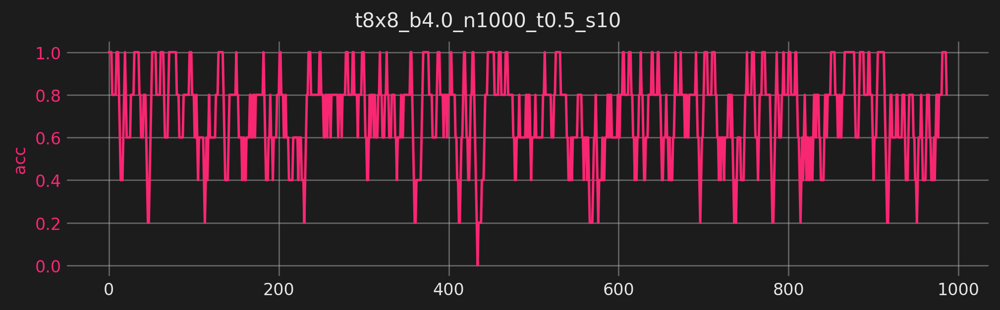

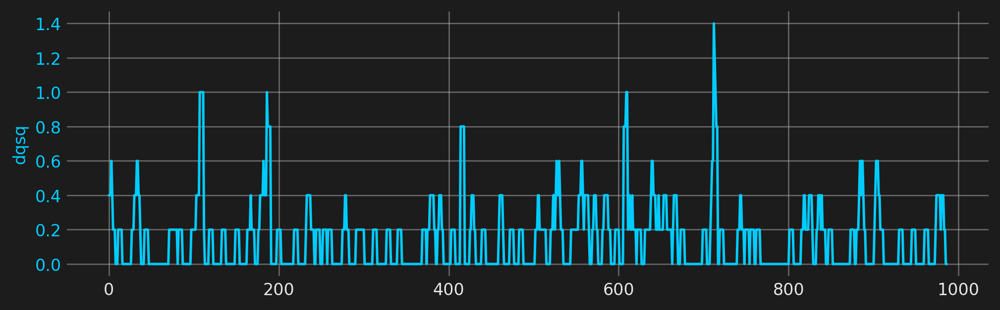

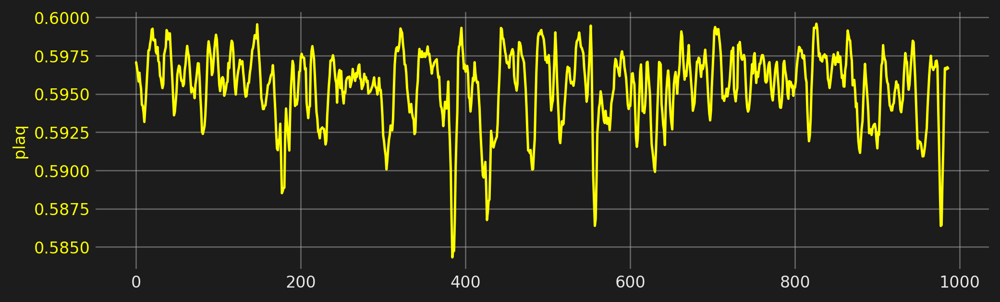

In [52]:
plt.style.use('~/.matplotlib/stylelib/molokai.mplstyle')

x = param.initializer()
x_ = x[None, :]
#x_ = torch.rand(16, 2, 8, 8)

runs_history = field_transformation.run(x=x_,  nprint=5,
                                        figsize=(8.5, 2.5),
                                        dpi=120, nplot=10)

In [46]:
%debug

> /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/fthmc/utils/logger.py(90)strformat()
     88             avgd = v.mean()
     89 
---> 90         return f'{str(k)}={avgd:<4.3f}'
     91 
     92     try:

ipdb> v.shape
(1,)
ipdb> avgd.shape
(1,)
ipdb> l
     85         #      window = min((v.shape[0], window))
     86         #      avgd = v[-window:].mean()
     87         else:
     88             avgd = v.mean()
     89 
---> 90         return f'{str(k)}={avgd:<4.3f}'
     91 
     92     try:
     93         return f'{str(k)}={v:<3g}'
     94     except ValueError:
     95         return f'{str(k)}={v:<3}'

ipdb> type(avgd)
<class 'numpy.ndarray'>
ipdb> avgd[0]
1.0
ipdb> v.shape[0]
1
ipdb> v.shape[0] < window
True
ipdb> 
True
ipdb> q


In [113]:
        
class FieldTransformation(nn.Module):
    def __init__(self, param: Param, flow: list[nn.Module], config: TrainConfig = None):
        super().__init__()
        self.param = param
        self.flow = flow
        self.config = config
        self._action_fn = lambda x: qed.BatchAction(param.beta)(x)[0]
        self._charges_fn = lambda x: qed.batch_charges(x)[0]
                
        
    def action(self, x: torch.Tensor):
        #y = x
        
        #logdet = 0.
        #for layer in self.flow: 
        #    y, logdet_ = layer(y)
        #    logdet = logdet + logdet_
        #    
        #return self._action_fn(y) - logdet
        z, logdet = self.flow_forward(x)
        
        return self._action_fn(z) - logdet
    
    def flow_forward(self, x: torch.Tensor):
        logdet = 0.
        for layer in self.flow:
            x, logdet_ = layer(x)
            logdet = logdet + logdet_
            
        return x, logdet
        
    def flow_backward(self, x: torch.Tensor):
        logdet = 0.
        for layer in reversed(self.flow):
            x, logdet_ = layer.reverse(x)
            logdet = logdet - logdet_
            
        return x, logdet
    
    def force(self, x: torch.Tensor, create_graph: bool = False):
        x.requires_grad_(True)
        s = self.action(x)
        dsdx, = torch.autograd.grad(s.sum(), x, create_graph=create_graph)
        x.requires_grad_(False)
        
        return dsdx
    
    def calc_metrics(self, x: torch.Tensor):
        logp = (-1.) * self._action_fn(x)
        plaq = logp / (self.param.beta * self.param.volume)
        q = qed.batch_charges(x)
        return q, plaq
    
    
    def leapfrog(self, x: torch.Tensor, v: torch.Tensor):
        dt = self.param.dt
        
        x = x + 0.5 * dt * v
        #force = self.force(x)
        v = v + (-dt) * self.force(x)
        
        #metrics = {'dt': [], 'acc': [], 'dqsq': [], 'plaq': []}
        #q, plaq = self.calc_metrics(x)
        
        #metrics['dt'].append(0)
        #metrics['acc'].append(1)
        #metrics['dqsq'].append(0)
        #metrics['plaq'].append(plaq)
        #metrics['q'].append(q)
        
        for _ in range(self.param.nstep - 1):
            x = x + dt * v
            #q, plaq = self.calc_metrics(x)
            v = v + (-dt) * self.force(x)
            
        x = x + 0.5 * dt * v
        return x, v
    
    @staticmethod
    def wrap(x: torch.Tensor):
        x_ = (x - PI) / TWO_PI
        
        return TWO_PI * (x_ - x_.floor() - 0.5)
    
    def build_trajectory(self, x: torch.Tensor = None):
        if x is None:
            x = self.param.initializer()
            
            
        x0 = x.clone()
        v0 = torch.randn_like(x)
        #v0_norm = (v0 * v0).sum()
        
        h0 = self.action(x) + 0.5 * (v0 * v0).sum()
        #z = self.action(x) + 0.5 * v0_norm
        
        x, v1 = self.leapfrog(x, v0)
        x1 = self.wrap(x)
        h1 = self.action(x1) + 0.5 * (v1 * v1).sum()
        #v1_norm = (v * v).sum()
        #plaq1 = self.action(xr) + 0.5 * v1_norm
        dh = h1 - h0
        exp_mdh = torch.exp(-dh)
        #prob = torch.minimum(torch.ones_like(exp_mdh), exp_mdh)
        acc = (torch.rand_like(exp_mdh) < exp_mdh).float()
        x_ = acc * x1 + (1 - acc) * x0
        
        
        #exp_mdh = torch.exp(-dh)
        #prob = torch.rand(x.shape[0])
        #acc = prob < exp_mdH
        #acc = torch.minimum(d)
        
        
        #prob = torch.rand([], dtype=torch.float64)
        #dH = plaq1 - plaq0
        #exp_mdH = torch.exp(-dH)
        #acc = prob < exp_mdH
        #x_ = xr if acc else x
        #for layer Iin self.flow:
        #    x_, logdet = layer(x_)
            
        return x_, acc, dH, exp_mdh
    
    
    def forward1(self, x: torch.Tensor):
        v0 = torch.randn_like(x)
        
        v0_norm = (v0 * v0).sum()
        logdet = 0.
        for layer in self.flow:
            x, logdet_ = layer(x)
            logdet = logdet + logdet_
            
        action = self._action_fn(x) - logdet
        
        plaq0 = self.action(x) + 0.5 * v0_norm
        
        x, v1 = self.leapfrog(x, v)
        xr = self.wrap(x)
        
        v1_norm = (v1 * v1).sum()
        plaq1 = self.action(x) + 0.5 * v1_norm
        
        prob = torch.rand(x.shape[0])
        dH = plaq1 - plaq0
        exp_mdH = torch.exp(-dH)
        acc = (prob < exp_mdH).float()
        x_ = xr if acc else x
        
        prob = torch.exp(torch.minimum(dH, torch.zeros_like(dH)))
        acc = torch.rand(prob.shape) < prob
        pass
        
        
    def run(self, x: torch.Tensor = None, nprint: int = 1, nplot: int = 1):
        if x is None:
            x = self.param.initializer()

        runs_history = {}
        fields = []
        beta = self.param.beta
        volume = self.param.volume
        
        #fig, ax = plt.subplots(constrained_layout=True)
        #fig1, ax1 = plt.subplots(constrained_layout=True)
        #fig2, ax2 = plt.subplots(constrained_layout=True)
        plots_acc = init_live_plot(figsize=(5, 1.),
                                   param=self.param,
                                   ylabel='acc',
                                   xlabel='trajectory',
                                   config=self.config)
        plots_q = init_live_plot(figsize=(5, 1.),
                                 #param=self.param,
                                 ylabel='q',
                                 xlabel='trajectory')
                                 #config=self.config)
        plots_plaq = init_live_plot(figsize=(5, 1.),
                                    ylabel='plaq',
                                    xlabel='trajectory')
                                    #param=self.param,
                                    #config=self.config)
        plots = {'plaq': plots_plaq, 'q': plots_q, 'acc': plots_acc}

        for n in range(self.param.nrun):
            t0 = time.time()
            xarr = []
            history = {}
            for i in range(param.ntraj):
                t_ = time.time()
                q0 = self._charges_fn(x)

        for n in range(self.param.nrun):
            t0 = time.time()
            xarr = []
            history = {}
            for i in range(param.ntraj):
                t_ = time.time()
                q0 = self._charges_fn(x)
                #q0 = qed.batch_charges(x[None, :])

                x, acc, dH, exp_mdH = self.build_trajectory(x)
                #x = self.
                q1 = self._charges_fn(x)
                #q1 = qed.batch_charges(x[None, :])

                dqsq = (q1 - q0) ** 2
                #logp = (-1.) * self._action_fn(x)
                logp = (-1.) * self.action(x)
                plaq = logp / (beta * volume)
                plaq_no_grad = plaq.detach()

                metrics = {
                    'traj': i,
                    'dt': time.time() - t_,
                    'acc': True if acc else False,
                    'dH': dH,
                    'exp_mdH': exp_mdH,
                    'dqsq': dqsq,
                    'q': q1,
                    'plaq': plaq_no_grad,
                }

                for key, val in metrics.items():
                    try:
                        history[key].append(val)
                    except KeyError:
                        history[key] = [val]

                if i % nplot == 0:
                    data = {
                        'q': history['q'],
                        'acc': history['acc'],
                        'plaq': history['plaq']
                    }
                    update_plots(plots, data)
                    
                            
                if i % nprint == 0:
                    logger.print_metrics(metrics, skip=['q'])#, pre=['(now)'])
                #logger.print_metrics(metrics, skip=['q'], pre=['(avg)'],
                #                     window=min(i, 20))

            runs_history[n] = history
            
        return runs_history

torch.Size([2, 4, 4])

torch.Size([1, 2, 4, 4])

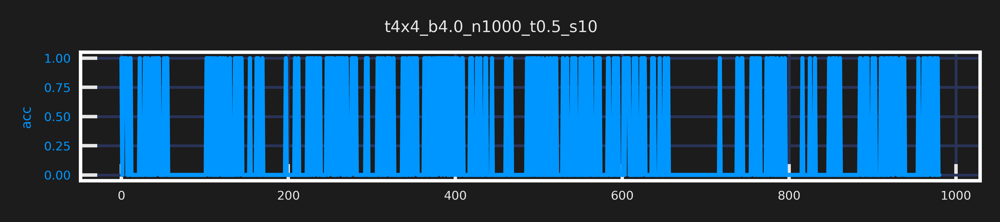

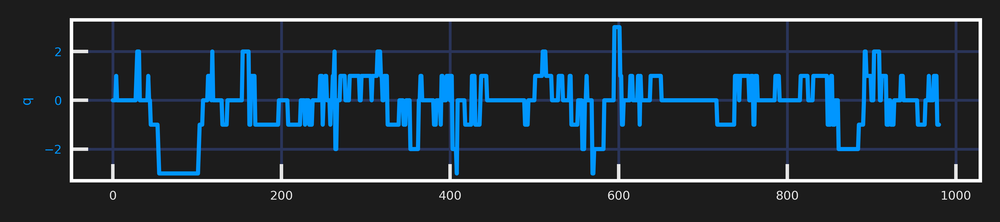

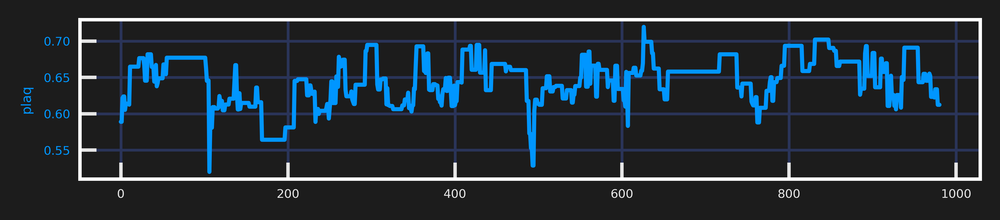

[17:41:23]  traj=0 dt=0.634 acc=1 dH=-0.058 exp_mdH=1.001 dqsq=0.000 plaq=0.589

[17:41:26]  traj=5 dt=0.659 acc=1 dH=-0.058 exp_mdH=1.000 dqsq=1.000 plaq=0.605

[17:41:30]  traj=10 dt=0.679 acc=1 dH=-0.058 exp_mdH=0.996 dqsq=0.000 plaq=0.613

[17:41:33]  traj=15 dt=0.701 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.665

[17:41:38]  traj=20 dt=0.755 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.665

[17:41:41]  traj=25 dt=0.786 acc=0 dH=-0.058 exp_mdH=0.002 dqsq=0.000 plaq=0.677

[17:41:45]  traj=30 dt=0.806 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.646

[17:41:49]  traj=35 dt=0.834 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.682

[17:41:55]  traj=40 dt=0.845 acc=1 dH=-0.058 exp_mdH=0.907 dqsq=0.000 plaq=0.644

[17:41:59]  traj=45 dt=0.864 acc=1 dH=-0.058 exp_mdH=1.022 dqsq=1.000 plaq=0.649

[17:42:04]  traj=50 dt=0.882 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.649

[17:42:08]  traj=55 dt=0.876 acc=1 dH=-0.058 exp_mdH=5.124 dqsq=1.000 plaq=0.677

[17:42:14]  traj=60 dt=0.894 acc=0 dH=-0.058 exp_mdH=0.001 dqsq=0.000 plaq=0.677

[17:42:18]  traj=65 dt=0.881 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.677

[17:42:23]  traj=70 dt=0.907 acc=0 dH=-0.058 exp_mdH=0.002 dqsq=0.000 plaq=0.677

[17:42:27]  traj=75 dt=0.934 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.677

[17:42:33]  traj=80 dt=0.903 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.677

[17:42:38]  traj=85 dt=0.954 acc=0 dH=-0.058 exp_mdH=0.078 dqsq=0.000 plaq=0.677

[17:42:43]  traj=90 dt=1.010 acc=0 dH=-0.058 exp_mdH=0.865 dqsq=0.000 plaq=0.677

[17:42:47]  traj=95 dt=0.911 acc=0 dH=-0.058 exp_mdH=0.004 dqsq=0.000 plaq=0.677

[17:42:53]  traj=100 dt=0.937 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.677

[17:42:58]  traj=105 dt=0.968 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.646

[17:43:03]  traj=110 dt=0.922 acc=1 dH=-0.058 exp_mdH=0.745 dqsq=0.000 plaq=0.609

[17:43:07]  traj=115 dt=0.933 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.607

[17:43:14]  traj=120 dt=1.041 acc=0 dH=-0.058 exp_mdH=0.015 dqsq=0.000 plaq=0.618

[17:43:20]  traj=125 dt=1.114 acc=1 dH=-0.058 exp_mdH=1.001 dqsq=0.000 plaq=0.613

[17:43:26]  traj=130 dt=1.350 acc=1 dH=-0.058 exp_mdH=1.549 dqsq=1.000 plaq=0.621

[17:43:31]  traj=135 dt=1.117 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.621

[17:43:39]  traj=140 dt=1.141 acc=1 dH=-0.058 exp_mdH=1.007 dqsq=0.000 plaq=0.606

[17:43:46]  traj=145 dt=1.343 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.615

[17:43:52]  traj=150 dt=1.324 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.615

[17:43:59]  traj=155 dt=1.489 acc=0 dH=-0.058 exp_mdH=0.234 dqsq=0.000 plaq=0.610

[17:44:08]  traj=160 dt=1.340 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.610

[17:44:16]  traj=165 dt=1.414 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.616

[17:44:24]  traj=170 dt=1.540 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.564

[17:44:32]  traj=175 dt=1.914 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.564

[17:44:43]  traj=180 dt=1.453 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.564

[17:44:52]  traj=185 dt=1.804 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.564

[17:44:59]  traj=190 dt=1.489 acc=0 dH=-0.058 exp_mdH=0.014 dqsq=0.000 plaq=0.564

[17:45:07]  traj=195 dt=1.646 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.564

[17:45:17]  traj=200 dt=1.346 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.581

[17:45:25]  traj=205 dt=1.613 acc=0 dH=-0.058 exp_mdH=0.001 dqsq=0.000 plaq=0.581

[17:45:32]  traj=210 dt=1.486 acc=0 dH=-0.058 exp_mdH=0.414 dqsq=0.000 plaq=0.645

[17:45:40]  traj=215 dt=1.401 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.648

[17:45:48]  traj=220 dt=1.280 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.648

[17:45:55]  traj=225 dt=1.225 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.625

[17:46:01]  traj=230 dt=1.297 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.627

[17:46:07]  traj=235 dt=1.145 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.607

[17:46:14]  traj=240 dt=1.120 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.604

[17:46:20]  traj=245 dt=1.337 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.604

[17:46:26]  traj=250 dt=1.171 acc=1 dH=-0.058 exp_mdH=0.999 dqsq=1.000 plaq=0.608

[17:46:31]  traj=255 dt=1.092 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.615

[17:46:38]  traj=260 dt=1.053 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.637

[17:46:43]  traj=265 dt=1.043 acc=0 dH=-0.058 exp_mdH=0.707 dqsq=0.000 plaq=0.666

[17:46:49]  traj=270 dt=1.010 acc=1 dH=-0.058 exp_mdH=3.477 dqsq=1.000 plaq=0.624

[17:46:54]  traj=275 dt=1.001 acc=0 dH=-0.058 exp_mdH=0.098 dqsq=0.000 plaq=0.624

[17:47:00]  traj=280 dt=1.053 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.613

[17:47:05]  traj=285 dt=0.997 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.640

[17:47:10]  traj=290 dt=0.986 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.640

[17:47:15]  traj=295 dt=0.971 acc=1 dH=-0.058 exp_mdH=1.050 dqsq=1.000 plaq=0.695

[17:47:21]  traj=300 dt=0.924 acc=0 dH=-0.058 exp_mdH=0.335 dqsq=0.000 plaq=0.695

[17:47:26]  traj=305 dt=0.910 acc=0 dH=-0.058 exp_mdH=0.223 dqsq=0.000 plaq=0.695

[17:47:31]  traj=310 dt=0.911 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.633

[17:47:35]  traj=315 dt=0.892 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.649

[17:47:41]  traj=320 dt=0.872 acc=1 dH=-0.058 exp_mdH=1.002 dqsq=1.000 plaq=0.612

[17:47:45]  traj=325 dt=0.873 acc=0 dH=-0.058 exp_mdH=0.230 dqsq=0.000 plaq=0.611

[17:47:49]  traj=330 dt=0.869 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.606

[17:47:54]  traj=335 dt=0.885 acc=0 dH=-0.058 exp_mdH=0.060 dqsq=0.000 plaq=0.606

[17:47:59]  traj=340 dt=0.865 acc=1 dH=-0.058 exp_mdH=3.800 dqsq=1.000 plaq=0.620

[17:48:04]  traj=345 dt=0.846 acc=1 dH=-0.058 exp_mdH=0.334 dqsq=1.000 plaq=0.608

[17:48:08]  traj=350 dt=0.841 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.612

[17:48:12]  traj=355 dt=0.848 acc=0 dH=-0.058 exp_mdH=0.411 dqsq=0.000 plaq=0.693

[17:48:18]  traj=360 dt=0.836 acc=0 dH=-0.058 exp_mdH=0.481 dqsq=0.000 plaq=0.693

[17:48:22]  traj=365 dt=0.857 acc=1 dH=-0.058 exp_mdH=1.215 dqsq=1.000 plaq=0.656

[17:48:26]  traj=370 dt=0.856 acc=1 dH=-0.058 exp_mdH=1.001 dqsq=0.000 plaq=0.633

[17:48:30]  traj=375 dt=0.833 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.641

[17:48:36]  traj=380 dt=0.841 acc=1 dH=-0.058 exp_mdH=1.485 dqsq=0.000 plaq=0.621

[17:48:40]  traj=385 dt=0.838 acc=1 dH=-0.058 exp_mdH=1.000 dqsq=0.000 plaq=0.627

[17:48:44]  traj=390 dt=0.851 acc=1 dH=-0.058 exp_mdH=0.975 dqsq=4.000 plaq=0.631

[17:48:48]  traj=395 dt=0.854 acc=1 dH=-0.058 exp_mdH=1.001 dqsq=0.000 plaq=0.633

[17:48:54]  traj=400 dt=0.918 acc=1 dH=-0.058 exp_mdH=0.210 dqsq=1.000 plaq=0.612

[17:48:59]  traj=405 dt=0.982 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.644

[17:49:03]  traj=410 dt=0.908 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.688

[17:49:08]  traj=415 dt=0.902 acc=0 dH=-0.058 exp_mdH=0.174 dqsq=0.000 plaq=0.688

[17:49:14]  traj=420 dt=0.900 acc=1 dH=-0.058 exp_mdH=0.921 dqsq=0.000 plaq=0.661

[17:49:18]  traj=425 dt=0.939 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.661

[17:49:23]  traj=430 dt=0.901 acc=1 dH=-0.058 exp_mdH=0.409 dqsq=4.000 plaq=0.657

[17:49:28]  traj=435 dt=0.956 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.657

[17:49:33]  traj=440 dt=0.876 acc=0 dH=-0.058 exp_mdH=0.001 dqsq=0.000 plaq=0.633

[17:49:38]  traj=445 dt=0.833 acc=0 dH=-0.058 exp_mdH=0.235 dqsq=0.000 plaq=0.669

[17:49:42]  traj=450 dt=0.840 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.669

[17:49:46]  traj=455 dt=0.805 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.669

[17:49:51]  traj=460 dt=0.808 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.669

[17:49:55]  traj=465 dt=0.769 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.665

[17:49:59]  traj=470 dt=0.774 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.660

[17:50:03]  traj=475 dt=0.781 acc=0 dH=-0.058 exp_mdH=0.061 dqsq=0.000 plaq=0.660

[17:50:08]  traj=480 dt=0.791 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.660

[17:50:12]  traj=485 dt=0.795 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.660

[17:50:16]  traj=490 dt=0.785 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.573

[17:50:20]  traj=495 dt=0.799 acc=1 dH=-0.058 exp_mdH=0.970 dqsq=0.000 plaq=0.604

[17:50:25]  traj=500 dt=0.776 acc=0 dH=-0.058 exp_mdH=0.024 dqsq=0.000 plaq=0.614

[17:50:29]  traj=505 dt=0.813 acc=1 dH=-0.058 exp_mdH=1.002 dqsq=0.000 plaq=0.635

[17:50:33]  traj=510 dt=0.790 acc=1 dH=-0.058 exp_mdH=0.968 dqsq=1.000 plaq=0.652

[17:50:37]  traj=515 dt=0.884 acc=0 dH=-0.058 exp_mdH=0.001 dqsq=0.000 plaq=0.631

[17:50:42]  traj=520 dt=0.837 acc=0 dH=-0.058 exp_mdH=0.010 dqsq=0.000 plaq=0.637

[17:50:47]  traj=525 dt=0.825 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.638

[17:50:51]  traj=530 dt=0.854 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.621

[17:50:55]  traj=535 dt=0.844 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.633

[17:51:01]  traj=540 dt=0.840 acc=1 dH=-0.058 exp_mdH=0.589 dqsq=0.000 plaq=0.615

[17:51:05]  traj=545 dt=0.870 acc=0 dH=-0.058 exp_mdH=0.037 dqsq=0.000 plaq=0.638

[17:51:09]  traj=550 dt=0.878 acc=1 dH=-0.058 exp_mdH=0.625 dqsq=0.000 plaq=0.650

[17:51:14]  traj=555 dt=0.877 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.681

[17:51:19]  traj=560 dt=0.906 acc=1 dH=-0.058 exp_mdH=1.111 dqsq=4.000 plaq=0.686

[17:51:24]  traj=565 dt=0.878 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.666

[17:51:28]  traj=570 dt=0.913 acc=0 dH=-0.058 exp_mdH=0.112 dqsq=0.000 plaq=0.624

[17:51:33]  traj=575 dt=0.880 acc=0 dH=-0.058 exp_mdH=0.100 dqsq=0.000 plaq=0.660

[17:51:38]  traj=580 dt=0.878 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.660

[17:51:43]  traj=585 dt=0.909 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.646

[17:51:48]  traj=590 dt=0.913 acc=1 dH=-0.058 exp_mdH=0.992 dqsq=0.000 plaq=0.618

[17:51:52]  traj=595 dt=0.962 acc=1 dH=-0.058 exp_mdH=1.447 dqsq=9.000 plaq=0.634

[17:51:59]  traj=600 dt=1.009 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.634

[17:52:04]  traj=605 dt=1.032 acc=1 dH=-0.058 exp_mdH=1.027 dqsq=0.000 plaq=0.658

[17:52:09]  traj=610 dt=1.016 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.656

[17:52:14]  traj=615 dt=1.133 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.663

[17:52:22]  traj=620 dt=1.184 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.653

[17:52:28]  traj=625 dt=1.156 acc=1 dH=-0.058 exp_mdH=0.814 dqsq=4.000 plaq=0.670

[17:52:34]  traj=630 dt=1.161 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.699

[17:52:40]  traj=635 dt=1.209 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.699

[17:52:48]  traj=640 dt=1.264 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.662

[17:52:54]  traj=645 dt=1.207 acc=1 dH=-0.058 exp_mdH=1.424 dqsq=0.000 plaq=0.634

[17:53:00]  traj=650 dt=1.204 acc=0 dH=-0.058 exp_mdH=0.001 dqsq=0.000 plaq=0.634

[17:53:06]  traj=655 dt=1.140 acc=1 dH=-0.058 exp_mdH=5.674 dqsq=0.000 plaq=0.658

[17:53:14]  traj=660 dt=1.125 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.658

[17:53:20]  traj=665 dt=1.108 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.658

[17:53:25]  traj=670 dt=1.182 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.658

[17:53:31]  traj=675 dt=1.096 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.658

[17:53:39]  traj=680 dt=1.120 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.658

[17:53:44]  traj=685 dt=1.141 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.658

[17:53:50]  traj=690 dt=1.204 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.658

[17:53:56]  traj=695 dt=1.223 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.658

[17:54:04]  traj=700 dt=1.157 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.658

[17:54:10]  traj=705 dt=1.269 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.658

[17:54:16]  traj=710 dt=1.183 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.658

[17:54:23]  traj=715 dt=1.395 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.658

[17:54:31]  traj=720 dt=1.170 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.682

[17:54:37]  traj=725 dt=1.226 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.682

[17:54:43]  traj=730 dt=1.285 acc=0 dH=-0.058 exp_mdH=0.202 dqsq=0.000 plaq=0.682

[17:54:50]  traj=735 dt=1.247 acc=0 dH=-0.058 exp_mdH=0.474 dqsq=0.000 plaq=0.682

[17:54:58]  traj=740 dt=1.227 acc=0 dH=-0.058 exp_mdH=0.047 dqsq=0.000 plaq=0.636

[17:55:05]  traj=745 dt=1.383 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.642

[17:55:11]  traj=750 dt=1.222 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.642

[17:55:17]  traj=755 dt=1.259 acc=1 dH=-0.058 exp_mdH=0.990 dqsq=1.000 plaq=0.617

[17:55:26]  traj=760 dt=1.273 acc=1 dH=-0.058 exp_mdH=0.993 dqsq=4.000 plaq=0.623

[17:55:32]  traj=765 dt=1.354 acc=1 dH=-0.058 exp_mdH=2.550 dqsq=1.000 plaq=0.608

[17:55:39]  traj=770 dt=1.218 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.608

[17:55:45]  traj=775 dt=1.213 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.632

[17:55:53]  traj=780 dt=1.326 acc=1 dH=-0.058 exp_mdH=1.032 dqsq=0.000 plaq=0.618

[17:55:59]  traj=785 dt=1.153 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.644

[17:56:05]  traj=790 dt=1.270 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.649

[17:56:12]  traj=795 dt=1.241 acc=1 dH=-0.058 exp_mdH=56.472 dqsq=0.000 plaq=0.694

[17:56:20]  traj=800 dt=1.238 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.694

[17:56:26]  traj=805 dt=1.287 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.694

[17:56:33]  traj=810 dt=1.277 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.694

[17:56:39]  traj=815 dt=1.318 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.694

[17:56:47]  traj=820 dt=1.240 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.659

[17:56:54]  traj=825 dt=1.225 acc=1 dH=-0.058 exp_mdH=0.464 dqsq=1.000 plaq=0.669

[17:57:00]  traj=830 dt=1.501 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.669

[17:57:07]  traj=835 dt=1.230 acc=0 dH=-0.058 exp_mdH=0.001 dqsq=0.000 plaq=0.702

[17:57:16]  traj=840 dt=1.239 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.702

[17:57:23]  traj=845 dt=1.312 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.702

[17:57:31]  traj=850 dt=1.566 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.691

[17:57:37]  traj=855 dt=1.300 acc=0 dH=-0.058 exp_mdH=0.003 dqsq=0.000 plaq=0.687

[17:57:46]  traj=860 dt=1.294 acc=0 dH=-0.058 exp_mdH=0.008 dqsq=0.000 plaq=0.666

[17:57:52]  traj=865 dt=1.289 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.672

[17:57:58]  traj=870 dt=1.182 acc=0 dH=-0.058 exp_mdH=0.001 dqsq=0.000 plaq=0.672

[17:58:04]  traj=875 dt=1.211 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.672

[17:58:12]  traj=880 dt=1.272 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.672

[17:58:18]  traj=885 dt=1.099 acc=1 dH=-0.058 exp_mdH=0.032 dqsq=1.000 plaq=0.626

[17:58:23]  traj=890 dt=1.066 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.635

[17:58:29]  traj=895 dt=1.059 acc=0 dH=-0.058 exp_mdH=0.017 dqsq=0.000 plaq=0.652

[17:58:35]  traj=900 dt=1.011 acc=1 dH=-0.058 exp_mdH=0.026 dqsq=1.000 plaq=0.684

[17:58:40]  traj=905 dt=0.984 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.637

[17:58:45]  traj=910 dt=0.908 acc=1 dH=-0.058 exp_mdH=1.085 dqsq=4.000 plaq=0.676

[17:58:49]  traj=915 dt=0.867 acc=0 dH=-0.058 exp_mdH=0.012 dqsq=0.000 plaq=0.658

[17:58:55]  traj=920 dt=0.832 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.611

[17:58:59]  traj=925 dt=0.798 acc=0 dH=-0.058 exp_mdH=0.001 dqsq=0.000 plaq=0.626

[17:59:03]  traj=930 dt=0.775 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.626

[17:59:06]  traj=935 dt=0.769 acc=1 dH=-0.058 exp_mdH=0.777 dqsq=1.000 plaq=0.651

[17:59:11]  traj=940 dt=0.767 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.691

[17:59:15]  traj=945 dt=0.748 acc=0 dH=-0.058 exp_mdH=0.028 dqsq=0.000 plaq=0.691

[17:59:19]  traj=950 dt=0.754 acc=0 dH=-0.058 exp_mdH=0.447 dqsq=0.000 plaq=0.691

[17:59:23]  traj=955 dt=0.758 acc=1 dH=-0.058 exp_mdH=1.947 dqsq=1.000 plaq=0.643

[17:59:28]  traj=960 dt=0.742 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.643

[17:59:31]  traj=965 dt=0.753 acc=0 dH=-0.058 exp_mdH=0.005 dqsq=0.000 plaq=0.645

[17:59:35]  traj=970 dt=0.761 acc=1 dH=-0.058 exp_mdH=0.999 dqsq=0.000 plaq=0.623

[17:59:39]  traj=975 dt=0.751 acc=1 dH=-0.058 exp_mdH=0.515 dqsq=0.000 plaq=0.634

[17:59:44]  traj=980 dt=0.770 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.612

[17:59:48]  traj=985 dt=0.758 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.615

[17:59:52]  traj=990 dt=0.795 acc=1 dH=-0.058 exp_mdH=0.904 dqsq=1.000 plaq=0.656

[17:59:56]  traj=995 dt=0.835 acc=0 dH=-0.058 exp_mdH=0.000 dqsq=0.000 plaq=0.656

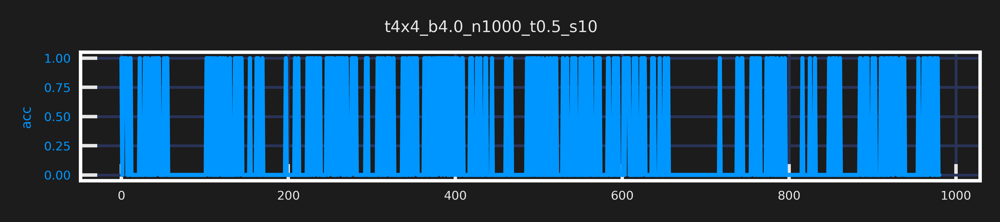

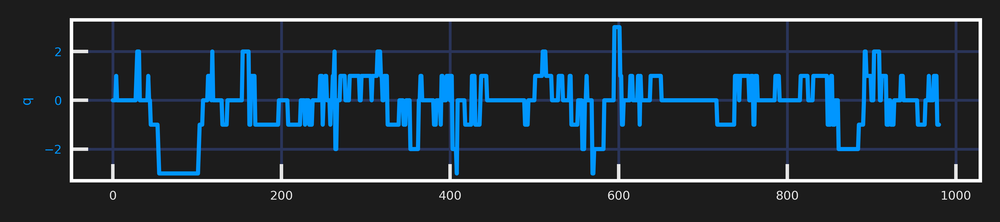

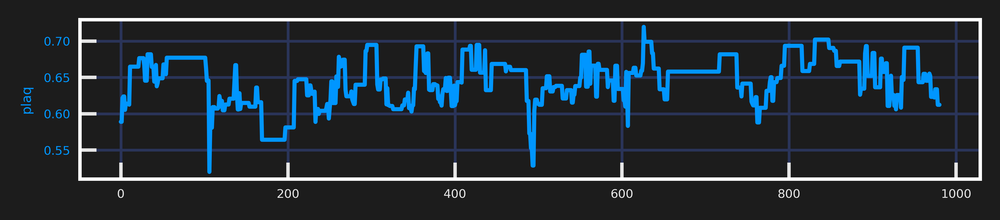

In [114]:
sns.set_context('notebook', font_scale=0.4)

flow = train_outputs['model'].layers
#flow = flow.eval()

field_transformation = FieldTransformation(param, flow)

x = param.initializer()
x.shape

x_ = x[None, :]
x_.shape


runs_history = field_transformation.run(x=x_, nprint=5, nplot=20)

In [28]:
x_ = x[None, :]
x_.shape


torch.Size([1, 2, 4, 4])

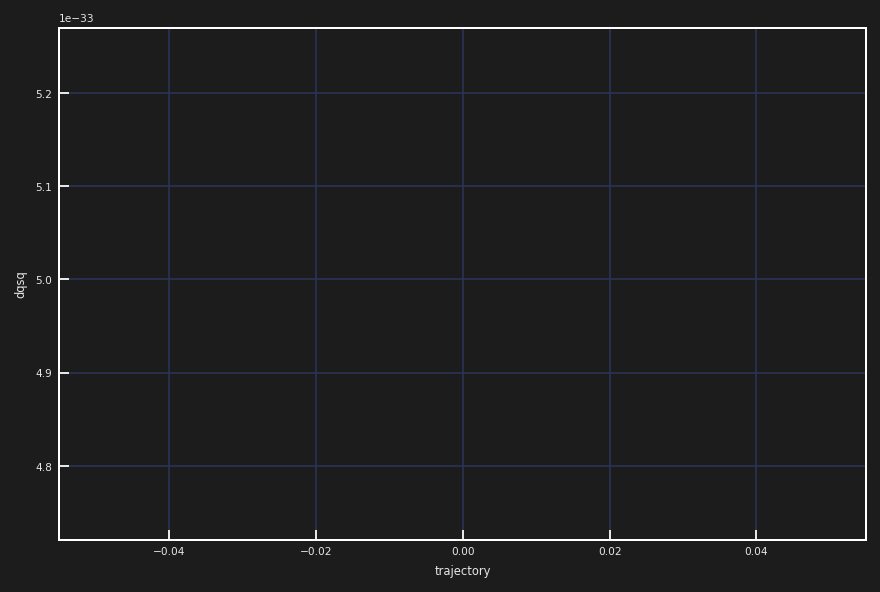

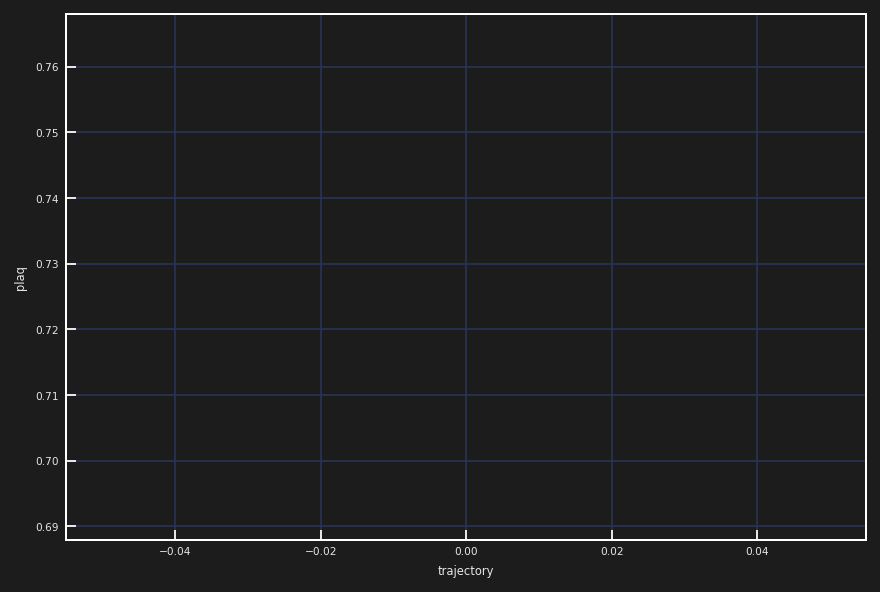

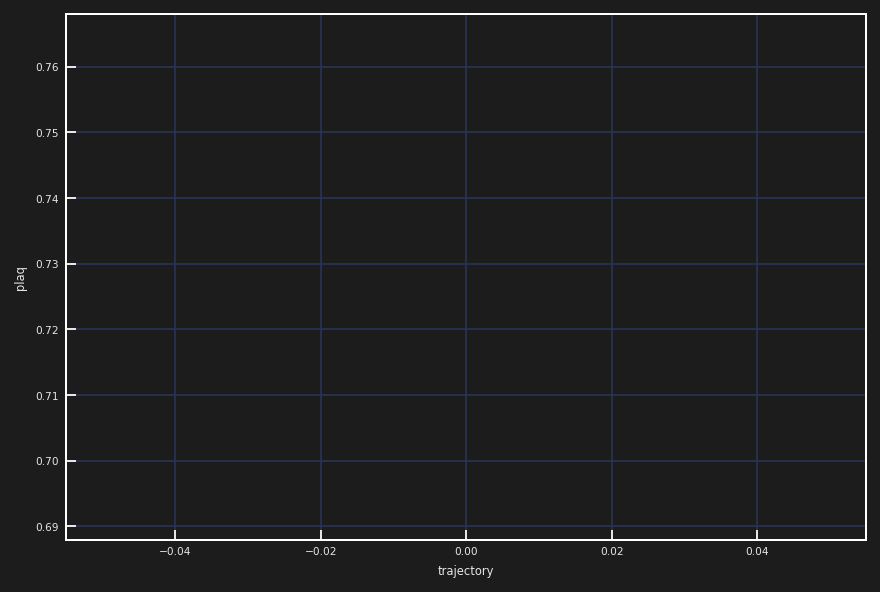

[14:20:06]  (now) traj=0 dt=0.790 acc=1 dH=-0.002 exp_mdH=1.002 dqsq=0.000 plaq=0.728

            (avg) traj=0 dt=0.790 acc=1 dH=-0.002 exp_mdH=1.002 dqsq=0.000 plaq=0.728

[14:20:07]  (now) traj=1 dt=0.798 acc=1 dH=-0.008 exp_mdH=1.008 dqsq=0.000 plaq=0.319

            (avg) traj=1 dt=0.798 acc=1 dH=-0.008 exp_mdH=1.008 dqsq=0.000 plaq=0.319

[14:20:08]  (now) traj=2 dt=0.798 acc=1 dH=-0.007 exp_mdH=1.007 dqsq=0.000 plaq=0.178

            (avg) traj=2 dt=0.798 acc=1 dH=-0.007 exp_mdH=1.007 dqsq=0.000 plaq=0.178

[14:20:09]  (now) traj=3 dt=0.804 acc=1 dH=-0.096 exp_mdH=1.101 dqsq=0.000 plaq=-0.036

            (avg) traj=3 dt=0.804 acc=1 dH=-0.096 exp_mdH=1.101 dqsq=0.000 plaq=-0.036

[14:20:10]  (now) traj=4 dt=0.797 acc=0 dH=7.447 exp_mdH=0.001 dqsq=0.000 plaq=-0.083

            (avg) traj=4 dt=0.797 acc=0 dH=7.447 exp_mdH=0.001 dqsq=0.000 plaq=-0.083

[14:20:11]  (now) traj=5 dt=0.788 acc=0 dH=21.826 exp_mdH=0.000 dqsq=1.000 plaq=-0.019

            (avg) traj=5 dt=0.788 acc=0 dH=21.826 exp_mdH=0.000 dqsq=1.000 plaq=-0.019

[14:20:12]  (now) traj=6 dt=0.776 acc=1 dH=-0.074 exp_mdH=1.077 dqsq=0.000 plaq=0.148

            (avg) traj=6 dt=0.776 acc=1 dH=-0.074 exp_mdH=1.077 dqsq=0.000 plaq=0.148

[14:20:13]  (now) traj=7 dt=0.782 acc=0 dH=3.859 exp_mdH=0.021 dqsq=4.000 plaq=-0.095

            (avg) traj=7 dt=0.782 acc=0 dH=3.859 exp_mdH=0.021 dqsq=4.000 plaq=-0.095

[14:20:14]  (now) traj=8 dt=0.810 acc=1 dH=-2.148 exp_mdH=8.567 dqsq=4.000 plaq=-0.086

            (avg) traj=8 dt=0.810 acc=1 dH=-2.148 exp_mdH=8.567 dqsq=4.000 plaq=-0.086

            (now) traj=9 dt=0.831 acc=0 dH=13.145 exp_mdH=0.000 dqsq=1.000 plaq=0.197

            (avg) traj=9 dt=0.831 acc=0 dH=13.145 exp_mdH=0.000 dqsq=1.000 plaq=0.197

[14:20:15]  (now) traj=10 dt=0.816 acc=1 dH=-0.007 exp_mdH=1.007 dqsq=1.000 plaq=0.180

            (avg) traj=10 dt=0.816 acc=1 dH=-0.007 exp_mdH=1.007 dqsq=1.000 plaq=0.180

[14:20:16]  (now) traj=11 dt=0.800 acc=0 dH=38.175 exp_mdH=0.000 dqsq=1.000 plaq=0.345

            (avg) traj=11 dt=0.800 acc=0 dH=38.175 exp_mdH=0.000 dqsq=1.000 plaq=0.345

[14:20:17]  (now) traj=12 dt=0.826 acc=1 dH=-0.001 exp_mdH=1.001 dqsq=0.000 plaq=0.451

            (avg) traj=12 dt=0.826 acc=1 dH=-0.001 exp_mdH=1.001 dqsq=0.000 plaq=0.451

[14:20:18]  (now) traj=13 dt=0.858 acc=0 dH=16.457 exp_mdH=0.000 dqsq=4.000 plaq=0.236

            (avg) traj=13 dt=0.858 acc=0 dH=16.457 exp_mdH=0.000 dqsq=4.000 plaq=0.236

[14:20:19]  (now) traj=14 dt=0.875 acc=1 dH=-0.001 exp_mdH=1.001 dqsq=1.000 plaq=0.349

            (avg) traj=14 dt=0.875 acc=1 dH=-0.001 exp_mdH=1.001 dqsq=1.000 plaq=0.349

[14:20:20]  (now) traj=15 dt=0.848 acc=0 dH=2.428 exp_mdH=0.088 dqsq=0.000 plaq=0.272

            (avg) traj=15 dt=0.848 acc=0 dH=2.428 exp_mdH=0.088 dqsq=0.000 plaq=0.272

[14:20:21]  (now) traj=16 dt=0.857 acc=0 dH=59.953 exp_mdH=0.000 dqsq=0.000 plaq=0.007

            (avg) traj=16 dt=0.857 acc=0 dH=59.953 exp_mdH=0.000 dqsq=0.000 plaq=0.007

[14:20:22]  (now) traj=17 dt=0.843 acc=1 dH=0.171 exp_mdH=0.843 dqsq=1.000 plaq=0.389

            (avg) traj=17 dt=0.843 acc=1 dH=0.171 exp_mdH=0.843 dqsq=1.000 plaq=0.389

[14:20:23]  (now) traj=18 dt=0.844 acc=0 dH=2.650 exp_mdH=0.071 dqsq=0.000 plaq=0.204

            (avg) traj=18 dt=0.844 acc=0 dH=2.650 exp_mdH=0.071 dqsq=0.000 plaq=0.204

[14:20:24]  (now) traj=19 dt=0.879 acc=0 dH=41.434 exp_mdH=0.000 dqsq=0.000 plaq=-0.014

            (avg) traj=19 dt=0.879 acc=0 dH=41.434 exp_mdH=0.000 dqsq=0.000 plaq=-0.014

[14:20:25]  (now) traj=20 dt=0.885 acc=1 dH=-0.032 exp_mdH=1.033 dqsq=1.000 plaq=0.215

            (avg) traj=20 dt=0.885 acc=1 dH=-0.032 exp_mdH=1.033 dqsq=1.000 plaq=0.215

[14:20:26]  (now) traj=21 dt=0.860 acc=0 dH=0.103 exp_mdH=0.903 dqsq=4.000 plaq=0.005

            (avg) traj=21 dt=0.860 acc=0 dH=0.103 exp_mdH=0.903 dqsq=4.000 plaq=0.005

[14:20:27]  (now) traj=22 dt=0.907 acc=1 dH=-0.138 exp_mdH=1.148 dqsq=1.000 plaq=-0.140

            (avg) traj=22 dt=0.907 acc=1 dH=-0.138 exp_mdH=1.148 dqsq=1.000 plaq=-0.140

KeyboardInterrupt: 

In [29]:
runs_history = field_transformation.run(x=x_)

In [7]:
%debug

> /Users/saforem2/nftqcd/fthmc/fthmc/utils/qed_helpers.py(79)compute_u1_plaq()
     77     return (links[mu, :]
     78             - links[nu, :]
---> 79             - torch.roll(links[mu, :], -1, nu + 1)
     80             + torch.roll(links[nu, :], -1, mu + 1))
     81 

ipdb> up
> /Users/saforem2/nftqcd/fthmc/fthmc/utils/layers.py(152)forward()
    150 
    151     def forward(self, x):
--> 152         plaq = compute_u1_plaq(x, mu=0, nu=1)
    153         new_plaq, logJ = self.plaq_coupling(plaq)
    154         delta_plaq = new_plaq - plaq

ipdb> x.shape
torch.Size([2, 4, 4])
ipdb> up
> /Users/saforem2/opt/anaconda3/envs/tf2.5-torch1.8.1-hvd0.22/lib/python3.9/site-packages/torch/nn/modules/module.py(889)_call_impl()
    887             result = self._slow_forward(*input, **kwargs)
    888         else:
--> 889             result = self.forward(*input, **kwargs)
    890         for hook in itertools.chain(
    891                 _global_forward_hooks.values(),

ipdb> up
> <ipytho

# Compare with training run above

# New heading

In [ ]:
from fthmc.train import train
from fthmc.hmc import run_hmc
param = {
    'L': 8,
    'tau': 0.5,
    'nrun': 1,
    'beta': np.float32(4.),
    'nstep': 20,
    'ntraj': 1000,
    'nprint': 100,
    'seed': 1331,
}

train_config = TrainConfig(**{
    'n_era': 50,
    'n_epoch': 500,
    'n_layers': 24,
    'n_s_nets': 2,
    'hidden_sizes': [8, 8],
    'kernel_size': 5,
    'batch_size': 64,
    'print_freq': 100,
    'plot_freq': 100,
})


param = Param(**param)
logger.log(repr(train_config))

# ------------------------------
# Run HMC using `param` above
# ------------------------------

hmc_fields, hmc_history = run_hmc(param)


# ---------------------------------------
# Train model using `train_config` above
# ---------------------------------------

%matplotlib inline
plt.style.use('/lus/grand/projects/DLHMC/molokai.mplstyle')
sns.set_context('paper', font_scale=0.6)

train_outputs = train(param,
                      train_config,
                      model=None,
                      pre_model=None,
                      figsize=(5, 2))

pre_flow_plots = train_outputs['plots']
pre_flow_history = train_outputs['history']
flow_act = train_outputs['action']
pre_flow_model = train_outputs['model']
pre_flow_optimizer = train_outputs['optimizer']


# -----------------------------------------------------------
# Run inference on trained model and evaluate / plot metrics
# -----------------------------------------------------------
import fthmc.utils.qed_helpers as qed
from fthmc.utils.plot_helpers import plot_history
from fthmc.utils.samplers import make_mcmc_ensemble

action_fn = qed.BatchAction(param.beta)
dirs = train_outputs['dirs']
logdir = dirs['logdir']

inf_dir = os.path.join(logdir, 'inference')
inf_pdir = os.path.join(inf_dir, 'plots')
history = make_mcmc_ensemble(model=train_outputs['model'], action_fn=action_fn,
                             batch_size=train_config.batch_size, num_samples=1000)
plot_history(history=history,
             param=param, config=train_config, skip=['epoch', 'x'],
             num_chains=4, therm_frac=0.0, xlabel='MC Step', outdir=inf_pdir)

# Transfer to larger lattice

In [21]:
from dataclasses import asdict
from fthmc.train import train, transfer_to_new_lattice
%matplotlib inline

from torch import nn 

plt.style.use('default')
plt.style.use('/lus/grand/projects/DLHMC/molokai.mplstyle')
sns.set_context('paper', font_scale=0.6)


def transfer(
        L: int,
        param_init: Param,
        config_init: TrainConfig,
        layers_init: nn.ModuleList,
        new_lr: float = None,
        run_hmc: bool = True
):
    xfr = transfer_to_new_lattice(L=L,
                                  layers=layers,
                                  param_init=param_init)
    param_new = xfr['param']
    model_new = xfr['model']
    # ----------------------------------------------
    # Run HMC using new (transferred) `param` above
    # ----------------------------------------------
    if run_hmc:
        from fthmc.hmc import run_hmc
        hmc_fields, hmc_history = run_hmc(param_new)


    if new_lr is not None:
        cfg_dict = asdict(config_init)
        cfg_dict['base_lr'] = new_lr
        config_new = TrainConfig(**cfg_dict)
    else:
        config_new = config_init

    train_outputs = train(param_new,
                          config_new,
                          model=model_new,
                          pre_model=None,
                          figsize=(5, 2))
    return {
        'param': param_new,
        'config': config_new,
        'model': model_new,
        'outputs': train_outputs
    }

ModuleList(
  (0): GaugeEquivCouplingLayer(
    (plaq_coupling): NCPPlaqCouplingLayer(
      (net): Sequential(
        (0): Conv2d(2, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (1): SiLU()
        (2): Conv2d(8, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (3): SiLU()
        (4): Conv2d(8, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
      )
    )
  )
  (1): GaugeEquivCouplingLayer(
    (plaq_coupling): NCPPlaqCouplingLayer(
      (net): Sequential(
        (0): Conv2d(2, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (1): SiLU()
        (2): Conv2d(8, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (3): SiLU()
        (4): Conv2d(8, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
      )
    )
  )
  (2): GaugeEquivCouplingLayer(
    (plaq_coupling): NCPPlaqCouplingLaye

[22:18:46]  Creating directory: ../../logs/hmc/t8x8_b5.0_n1000_t0.5_s10/2021-06-21-221846

[22:18:46]  Creating directory:                                                              
            ../../logs/hmc/t8x8_b5.0_n1000_t0.5_s10/2021-06-21-221846/plots

[22:18:46]  Param:                                                                           
            ----------------                                                                 
            beta=5.0                                                                         
            L=8                                                                              
            tau=0.5                                                                          
            nstep=10                                                                         
            ntraj=1000                                                                       
            nrun=1                                                                           
            nprint=100                                                                       
            seed=1331                                                                        
            randinit=False                                                                   
            nth_interop=2                                                                    
            nth=2                                                                            
            lat=[8, 8]                                                                       
            nd=2                                                                             
            shape=[2, 8, 8]                                                                  
            volume=64                                                                        
            dt=0.05

──────────────────────────────── RUN: 0, last took: 0 m 0 s ─────────────────────────────────

            plaq=1.000 q=0.000

            traj=2 dt=0.006 acc=1.000 dH=-0.062 q=0 dqsq=0 plaq=0.919

[22:18:47]  traj=102 dt=0.006 acc=1.000 dH=0.029 q=0 dqsq=0 plaq=0.901

[22:18:48]  traj=202 dt=0.006 acc=1.000 dH=0.027 q=0 dqsq=0 plaq=0.919

            traj=302 dt=0.006 acc=1.000 dH=0.089 q=0 dqsq=0 plaq=0.888

[22:18:49]  traj=402 dt=0.006 acc=1.000 dH=0.038 q=0 dqsq=0 plaq=0.872

            traj=502 dt=0.006 acc=1.000 dH=-0.076 q=0 dqsq=0 plaq=0.905

[22:18:50]  traj=602 dt=0.006 acc=1.000 dH=-0.123 q=0 dqsq=0 plaq=0.887

            traj=702 dt=0.006 acc=1.000 dH=0.024 q=0 dqsq=0 plaq=0.894

[22:18:51]  traj=802 dt=0.006 acc=1.000 dH=0.034 q=0 dqsq=0 plaq=0.907

[22:18:52]  traj=902 dt=0.006 acc=1.000 dH=-0.047 q=0 dqsq=0 plaq=0.911

[22:18:52]  Creating directory:                                                              
            ../../logs/hmc/t8x8_b5.0_n1000_t0.5_s10/2021-06-21-221846/plots/run0

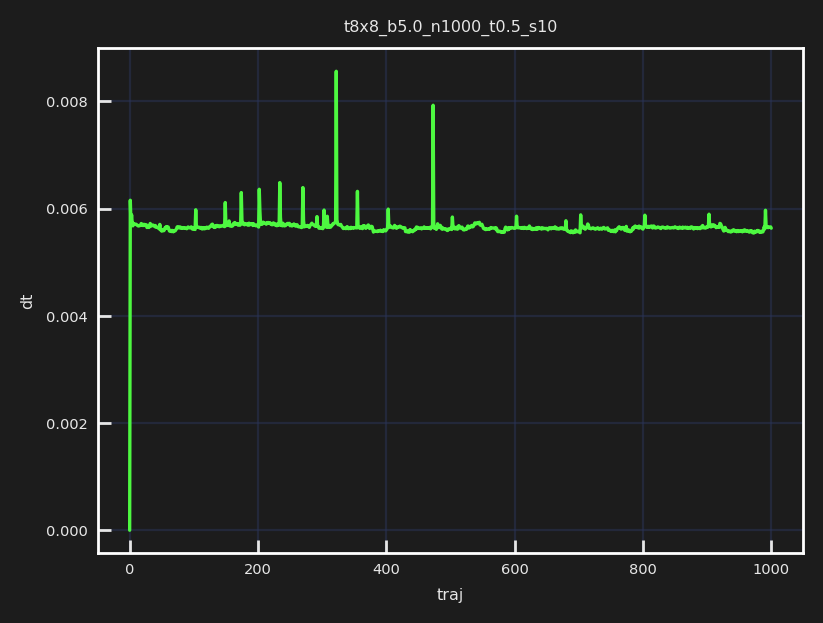

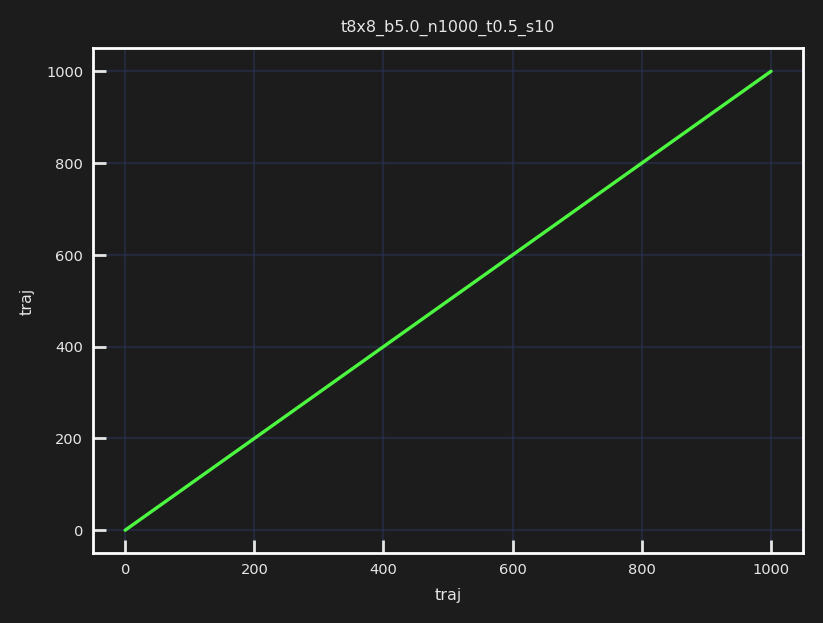

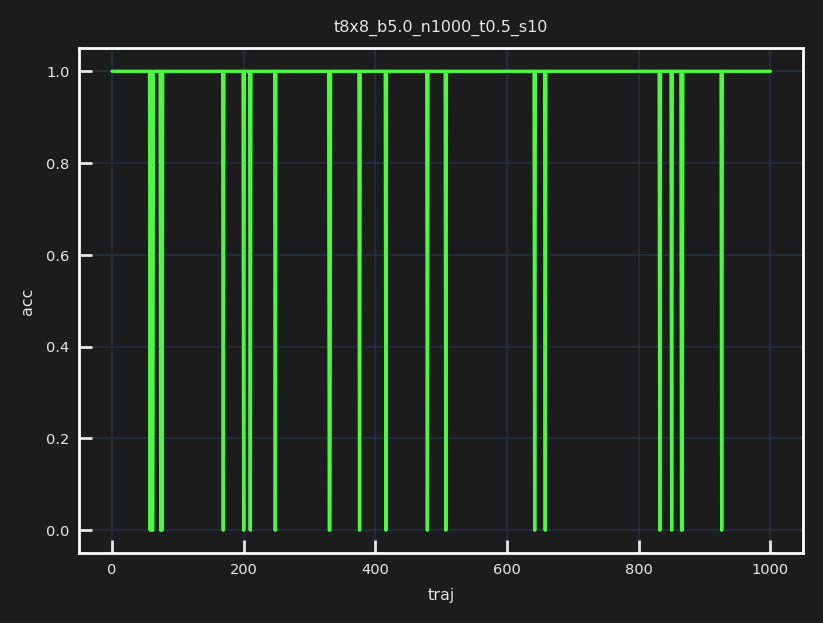

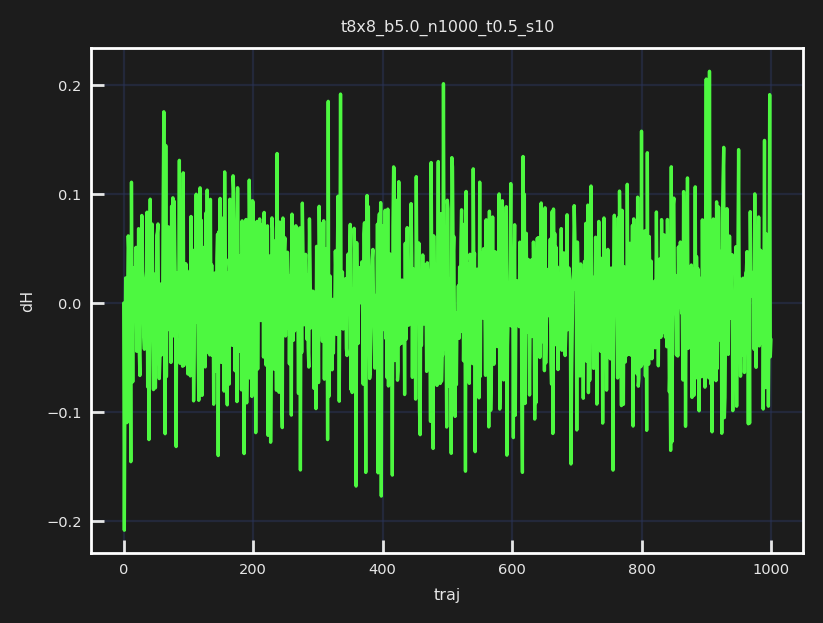

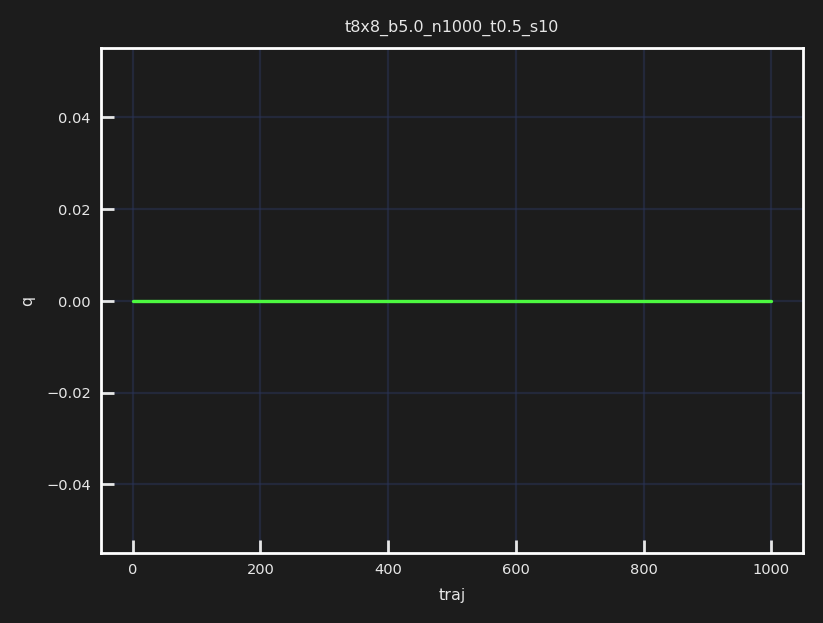

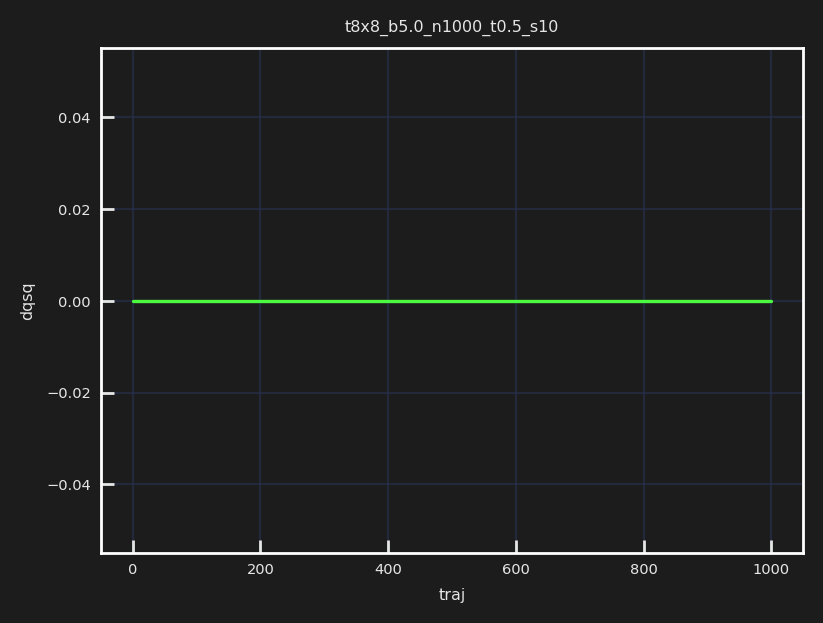

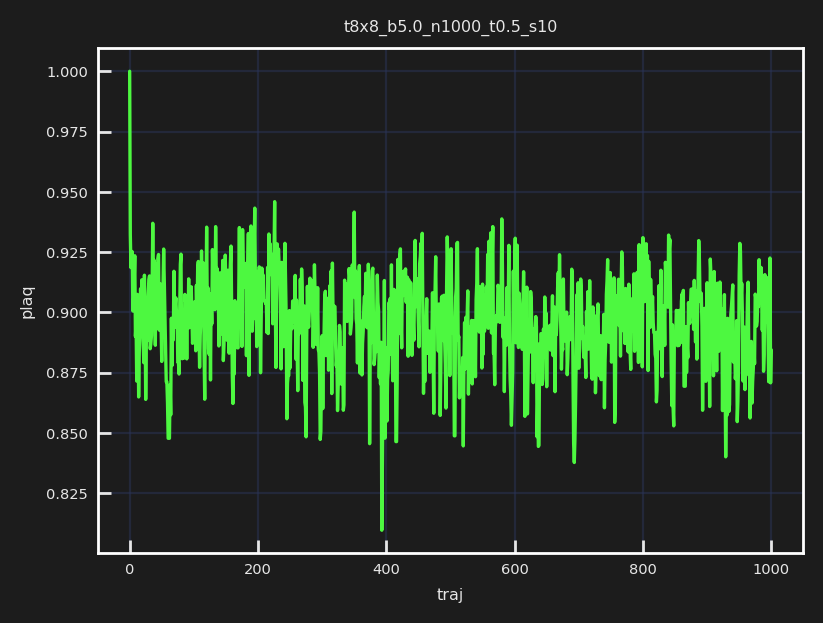

[22:18:54]  Run times: ['5.7975']

            Per trajectory: ['0.0058']

[22:18:54]  Saving hmc_histories to                                                          
            ../../logs/hmc/t8x8_b5.0_n1000_t0.5_s10/2021-06-21-221846/hmc_histories.z.

[22:18:54]  Saving hmc_fields_arr to                                                         
            ../../logs/hmc/t8x8_b5.0_n1000_t0.5_s10/2021-06-21-221846/hmc_fields_arr.z.

[22:18:54]  Creating directory: ../../logs/t8x8_b5.0_n1000_t0.5_s10/nb128_nh24_ns2_ks3_hl88_l
            r0.0001_era10_epoch1000/training/2021-06-21-221854

[22:18:54]  Creating directory: ../../logs/t8x8_b5.0_n1000_t0.5_s10/nb128_nh24_ns2_ks3_hl88_l
            r0.0001_era10_epoch1000/training/2021-06-21-221854/plots

[22:18:54]  Creating directory: ../../logs/t8x8_b5.0_n1000_t0.5_s10/nb128_nh24_ns2_ks3_hl88_l
            r0.0001_era10_epoch1000/training/2021-06-21-221854/checkpoints

[22:18:54]  Scheduler created!

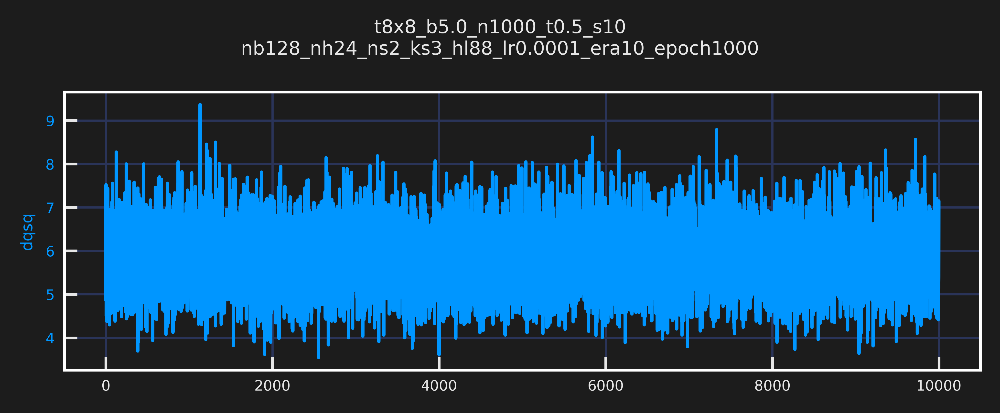

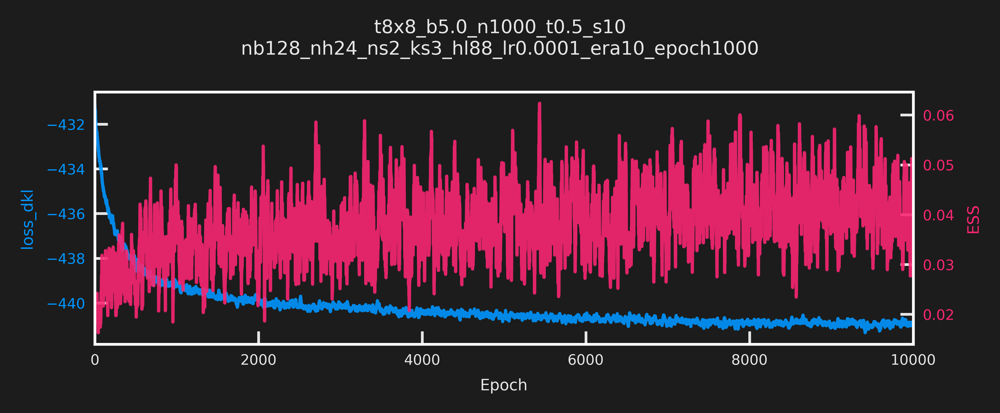

─────────────────────────────── ERA=0, last took: 0 min 0 sec ───────────────────────────────

[22:20:01]  (now) epoch: 499 dt=0.127 ess=0.022 loss_dkl=-437.964 logp=276.086 logq=-161.878 
            dqsq=6.625 plaq=0.863

            (avg) epoch: 499 dt=0.127 ess=0.029 loss_dkl=-437.980 logp=276.742 logq=-161.238 
            dqsq=5.769 plaq=0.865

[22:21:07]  (now) epoch: 999 dt=0.127 ess=0.070 loss_dkl=-438.883 logp=276.161 logq=-162.721 
            dqsq=5.391 plaq=0.863

            (avg) epoch: 999 dt=0.127 ess=0.045 loss_dkl=-439.076 logp=277.758 logq=-161.318 
            dqsq=5.776 plaq=0.868

[22:21:08]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t8x8_b5.0_n1000
            _t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-22
            1854/checkpoints/ckpt-era0-epoch999.tar

───────────────────────────── ERA=1, last took: 2 min 12.89 sec ─────────────────────────────

[22:22:14]  (now) epoch: 499 dt=0.128 ess=0.025 loss_dkl=-439.497 logp=278.935 logq=-160.563 
            dqsq=4.875 plaq=0.872

            (avg) epoch: 499 dt=0.128 ess=0.042 loss_dkl=-439.759 logp=278.446 logq=-161.313 
            dqsq=5.979 plaq=0.870

[22:23:20]  (now) epoch: 999 dt=0.128 ess=0.033 loss_dkl=-440.089 logp=279.348 logq=-160.741 
            dqsq=5.766 plaq=0.873

            (avg) epoch: 999 dt=0.128 ess=0.027 loss_dkl=-439.818 logp=278.799 logq=-161.019 
            dqsq=5.585 plaq=0.871

[22:23:21]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t8x8_b5.0_n1000
            _t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-22
            1854/checkpoints/ckpt-era1-epoch999.tar

───────────────────────────── ERA=2, last took: 2 min 12.69 sec ─────────────────────────────

[22:24:26]  (now) epoch: 499 dt=0.132 ess=0.017 loss_dkl=-440.023 logp=279.319 logq=-160.703 
            dqsq=5.805 plaq=0.873

            (avg) epoch: 499 dt=0.134 ess=0.038 loss_dkl=-440.171 logp=278.949 logq=-161.221 
            dqsq=5.797 plaq=0.872

[22:25:33]  (now) epoch: 999 dt=0.128 ess=0.021 loss_dkl=-440.620 logp=278.257 logq=-162.362 
            dqsq=6.461 plaq=0.870

[22:25:34]  (avg) epoch: 999 dt=0.128 ess=0.031 loss_dkl=-440.093 logp=278.867 logq=-161.226 
            dqsq=5.965 plaq=0.871

[22:25:35]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t8x8_b5.0_n1000
            _t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-22
            1854/checkpoints/ckpt-era2-epoch999.tar

───────────────────────────── ERA=3, last took: 2 min 13.33 sec ─────────────────────────────

[22:26:44]  (now) epoch: 499 dt=0.137 ess=0.025 loss_dkl=-440.242 logp=279.472 logq=-160.770 
            dqsq=6.383 plaq=0.873

            (avg) epoch: 499 dt=0.137 ess=0.044 loss_dkl=-440.252 logp=279.208 logq=-161.043 
            dqsq=5.793 plaq=0.873

[22:27:53]  (now) epoch: 999 dt=0.132 ess=0.039 loss_dkl=-440.816 logp=280.050 logq=-160.766 
            dqsq=6.094 plaq=0.875

            (avg) epoch: 999 dt=0.132 ess=0.043 loss_dkl=-440.367 logp=278.846 logq=-161.522 
            dqsq=5.736 plaq=0.871

[22:27:54]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t8x8_b5.0_n1000
            _t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-22
            1854/checkpoints/ckpt-era3-epoch999.tar

───────────────────────────── ERA=4, last took: 2 min 19.15 sec ─────────────────────────────

[22:29:00]  (now) epoch: 499 dt=0.138 ess=0.036 loss_dkl=-440.592 logp=279.237 logq=-161.355 
            dqsq=6.625 plaq=0.873

            (avg) epoch: 499 dt=0.130 ess=0.027 loss_dkl=-440.363 logp=278.981 logq=-161.382 
            dqsq=5.815 plaq=0.872

[22:30:08]  (now) epoch: 999 dt=0.130 ess=0.062 loss_dkl=-440.433 logp=278.883 logq=-161.550 
            dqsq=5.398 plaq=0.872

            (avg) epoch: 999 dt=0.130 ess=0.049 loss_dkl=-440.750 logp=279.451 logq=-161.299 
            dqsq=5.712 plaq=0.873

[22:30:09]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t8x8_b5.0_n1000
            _t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-22
            1854/checkpoints/ckpt-era4-epoch999.tar

───────────────────────────── ERA=5, last took: 2 min 14.4 sec ──────────────────────────────

[22:31:16]  (now) epoch: 499 dt=0.133 ess=0.009 loss_dkl=-440.502 logp=280.040 logq=-160.463 
            dqsq=4.852 plaq=0.875

            (avg) epoch: 499 dt=0.133 ess=0.034 loss_dkl=-440.601 logp=279.254 logq=-161.347 
            dqsq=6.062 plaq=0.873

[22:32:26]  (now) epoch: 999 dt=0.138 ess=0.022 loss_dkl=-440.376 logp=278.650 logq=-161.725 
            dqsq=6.031 plaq=0.871

            (avg) epoch: 999 dt=0.134 ess=0.032 loss_dkl=-440.539 logp=279.023 logq=-161.517 
            dqsq=5.909 plaq=0.872

[22:32:27]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t8x8_b5.0_n1000
            _t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-22
            1854/checkpoints/ckpt-era5-epoch999.tar

───────────────────────────── ERA=6, last took: 2 min 17.75 sec ─────────────────────────────

[22:33:34]  (now) epoch: 499 dt=0.131 ess=0.030 loss_dkl=-440.530 logp=278.719 logq=-161.812 
            dqsq=6.984 plaq=0.871

            (avg) epoch: 499 dt=0.131 ess=0.049 loss_dkl=-440.669 logp=279.318 logq=-161.351 
            dqsq=5.979 plaq=0.873

[22:34:41]  (now) epoch: 999 dt=0.131 ess=0.080 loss_dkl=-441.407 logp=280.187 logq=-161.220 
            dqsq=5.305 plaq=0.876

            (avg) epoch: 999 dt=0.130 ess=0.034 loss_dkl=-440.909 logp=279.460 logq=-161.449 
            dqsq=5.650 plaq=0.873

[22:34:43]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t8x8_b5.0_n1000
            _t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-22
            1854/checkpoints/ckpt-era6-epoch999.tar

───────────────────────────── ERA=7, last took: 2 min 15.4 sec ──────────────────────────────

[22:35:50]  (now) epoch: 499 dt=0.130 ess=0.062 loss_dkl=-441.468 logp=280.428 logq=-161.040 
            dqsq=5.984 plaq=0.876

            (avg) epoch: 499 dt=0.130 ess=0.044 loss_dkl=-440.928 logp=279.252 logq=-161.676 
            dqsq=5.779 plaq=0.873

[22:36:59]  (now) epoch: 999 dt=0.134 ess=0.033 loss_dkl=-440.369 logp=277.852 logq=-162.517 
            dqsq=5.609 plaq=0.868

            (avg) epoch: 999 dt=0.135 ess=0.037 loss_dkl=-440.848 logp=279.428 logq=-161.420 
            dqsq=5.629 plaq=0.873

[22:37:00]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t8x8_b5.0_n1000
            _t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-22
            1854/checkpoints/ckpt-era7-epoch999.tar

───────────────────────────── ERA=8, last took: 2 min 17.15 sec ─────────────────────────────

[22:38:07]  (now) epoch: 499 dt=0.130 ess=0.031 loss_dkl=-440.727 logp=278.715 logq=-162.012 
            dqsq=4.687 plaq=0.871

            (avg) epoch: 499 dt=0.130 ess=0.041 loss_dkl=-441.042 logp=279.973 logq=-161.070 
            dqsq=5.609 plaq=0.875

[22:39:15]  (now) epoch: 999 dt=0.133 ess=0.024 loss_dkl=-441.354 logp=280.587 logq=-160.768 
            dqsq=5.711 plaq=0.877

            (avg) epoch: 999 dt=0.134 ess=0.039 loss_dkl=-441.018 logp=279.975 logq=-161.042 
            dqsq=5.667 plaq=0.875

[22:39:17]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t8x8_b5.0_n1000
            _t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-22
            1854/checkpoints/ckpt-era8-epoch999.tar

───────────────────────────── ERA=9, last took: 2 min 15.61 sec ─────────────────────────────

[22:40:25]  (now) epoch: 499 dt=0.130 ess=0.051 loss_dkl=-441.454 logp=280.475 logq=-160.978 
            dqsq=6.891 plaq=0.876

            (avg) epoch: 499 dt=0.130 ess=0.040 loss_dkl=-441.078 logp=280.039 logq=-161.040 
            dqsq=5.793 plaq=0.875

[22:41:33]  (now) epoch: 999 dt=0.130 ess=0.031 loss_dkl=-440.961 logp=279.972 logq=-160.989 
            dqsq=7.148 plaq=0.875

            (avg) epoch: 999 dt=0.130 ess=0.045 loss_dkl=-440.967 logp=280.087 logq=-160.880 
            dqsq=5.933 plaq=0.875

[22:41:34]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t8x8_b5.0_n1000
            _t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-22
            1854/checkpoints/ckpt-era9-epoch999.tar

[22:41:35]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t8x8_b5.0_n1000
            _t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-22
            1854/checkpoints/ckpt-era10-epoch1001.tar

[22:41:36]  Saving live plots to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t8x8_b5.0_n1000
            _t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-22
            1854/plots

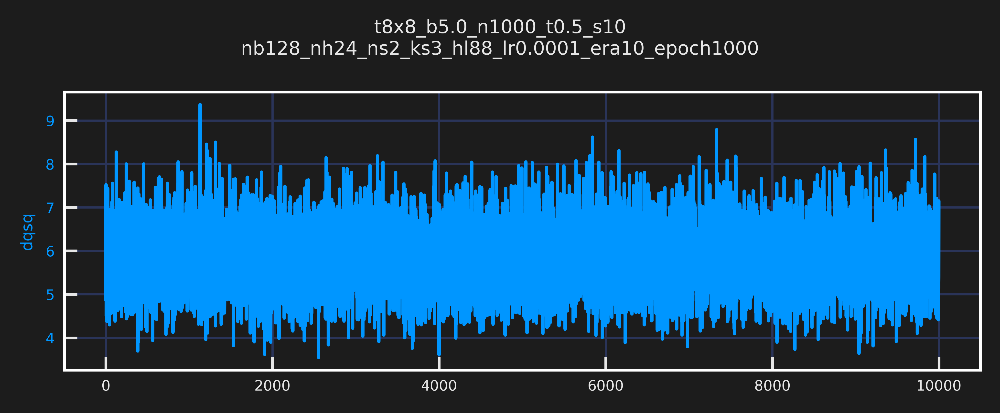

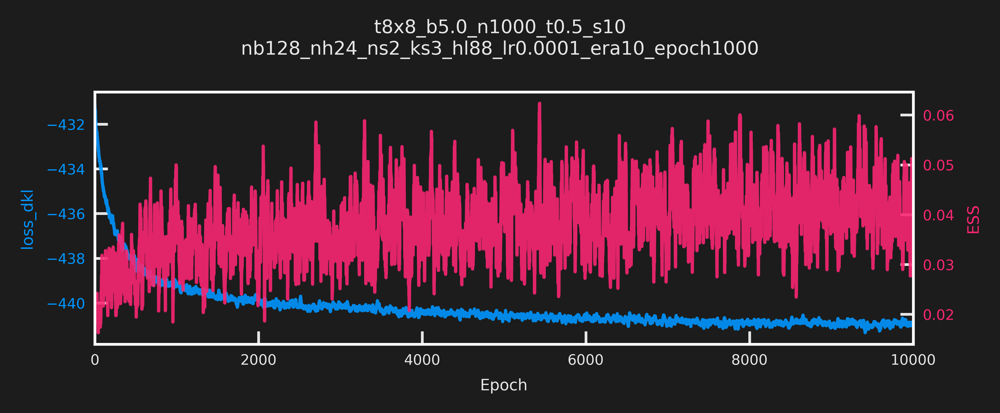

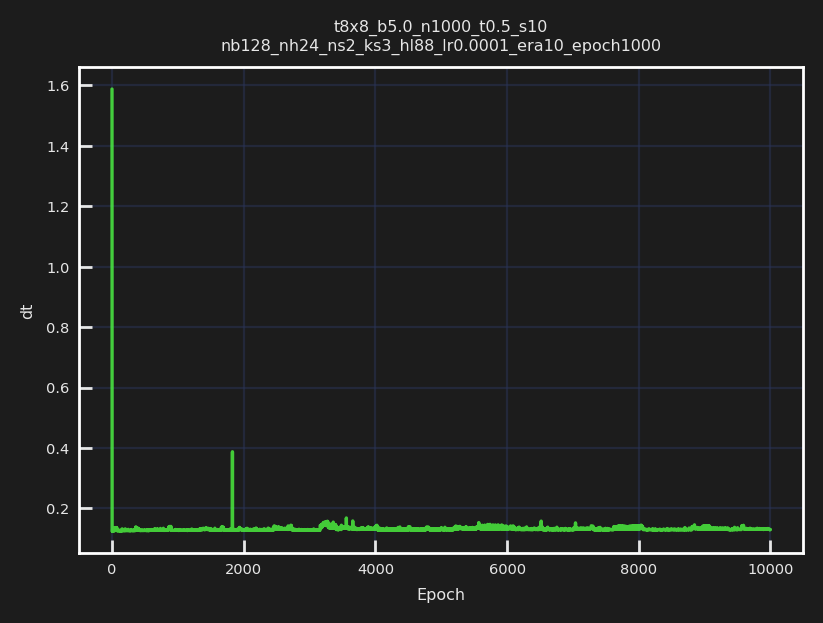

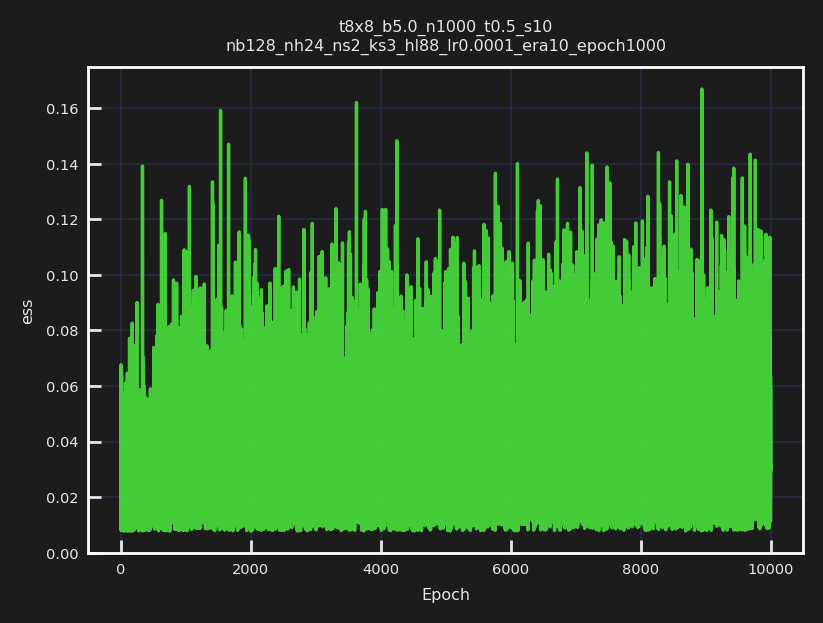

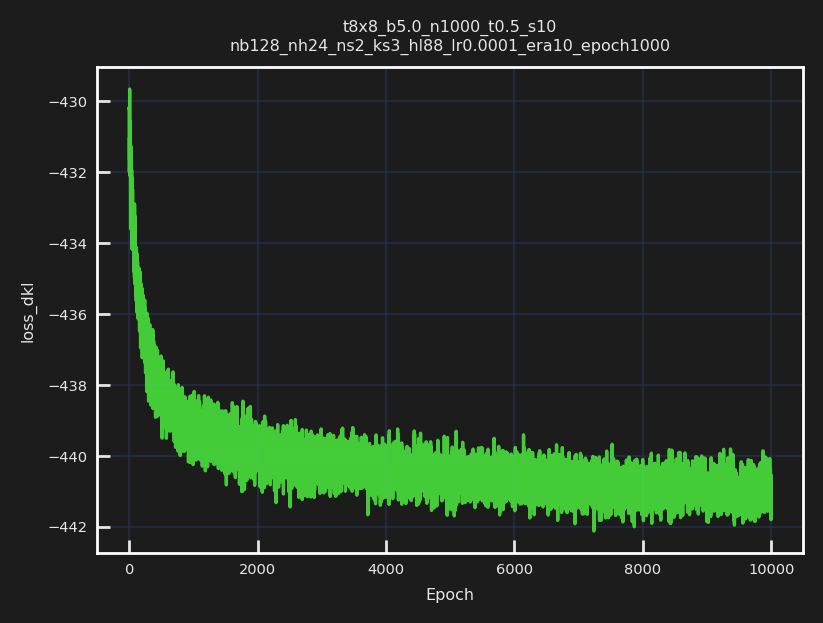

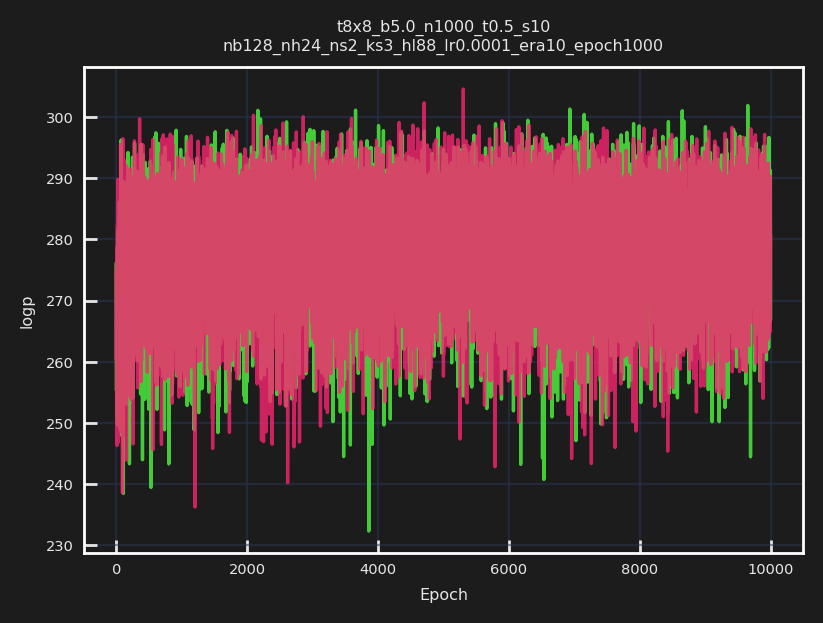

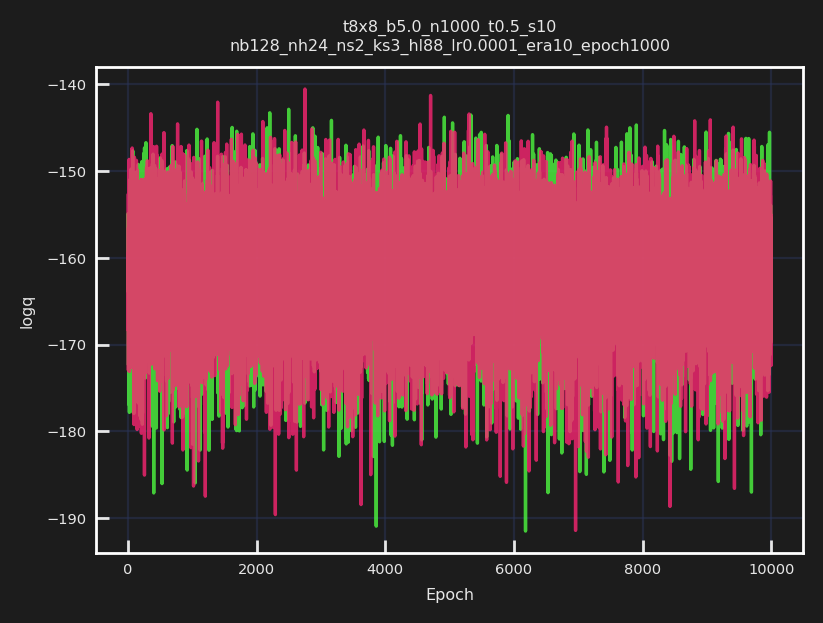

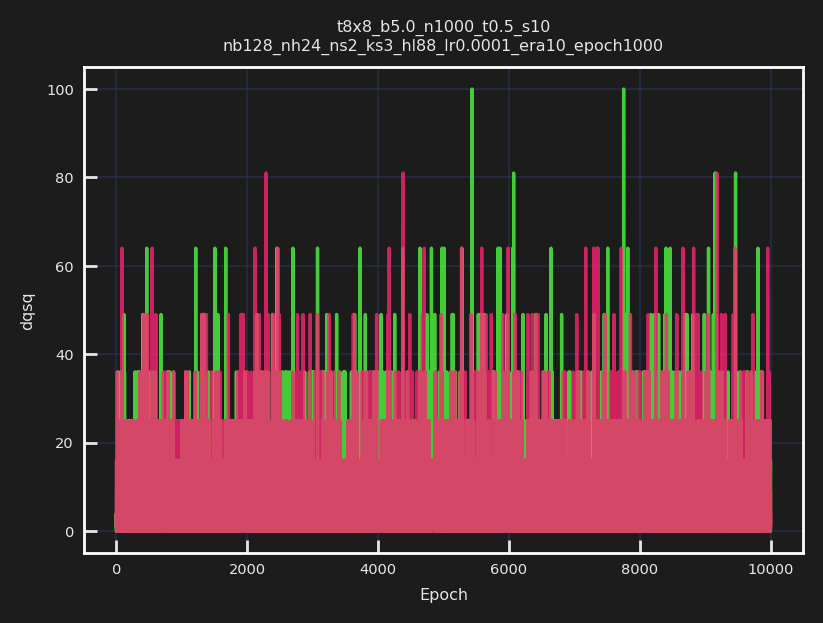

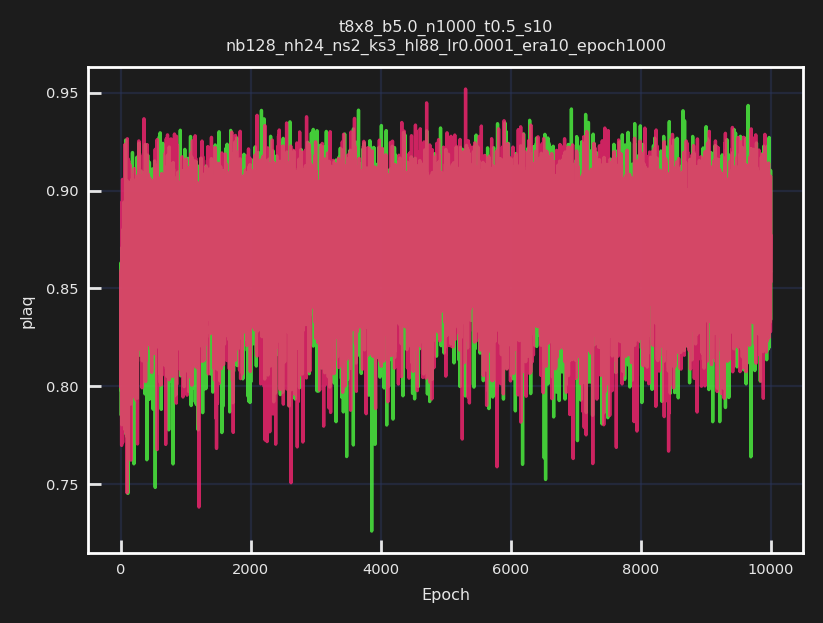

[22:41:40]  Saving train_history to ../../logs/t8x8_b5.0_n1000_t0.5_s10/nb128_nh24_ns2_ks3_hl
            88_lr0.0001_era10_epoch1000/training/2021-06-21-221854/train_history.z.

In [13]:
layers = train_outputs['model'].layers #['layers']
layers.train()
train_outputs8 = transfer(L=8, param_init=param,
                          config_init=train_config,
                          layers_init=layers, 
                          new_lr=0.0001, run_hmc=True)

In [16]:
from dataclasses import asdict

param8 = Param(**asdict(param))
logger.log(param8)

train_config8 = TrainConfig(**asdict(train_config))
train_config8.base_lr = 0.0001

[23:06:12]  Param:                                                                           
            ----------------                                                                 
            beta=5.0                                                                         
            L=4                                                                              
            tau=0.5                                                                          
            nstep=10                                                                         
            ntraj=1000                                                                       
            nrun=1                                                                           
            nprint=100                                                                       
            seed=1331                                                                        
            randinit=False                                                                   
            nth_interop=2                                                                    
            nth=2                                                                            
            lat=[4, 4]                                                                       
            nd=2                                                                             
            shape=[2, 4, 4]                                                                  
            volume=16                                                                        
            dt=0.05

[23:08:30]  Existing file found!                                                             
            Renaming outfile to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t8x8_b5.0_n1000_
            t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/inference/plots/ess_230
            830.pdf

[23:08:31]  Existing file found!                                                             
            Renaming outfile to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t8x8_b5.0_n1000_
            t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/inference/plots/q_23083
            1.pdf

            Existing file found!                                                             
            Renaming outfile to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t8x8_b5.0_n1000_
            t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/inference/plots/dqsq_23
            0831.pdf

            Existing file found!                                                             
            Renaming outfile to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t8x8_b5.0_n1000_
            t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/inference/plots/dkl_230
            831.pdf

            Existing file found!                                                             
            Renaming outfile to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t8x8_b5.0_n1000_
            t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/inference/plots/logq_23
            0831.pdf

            Existing file found!                                                             
            Renaming outfile to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t8x8_b5.0_n1000_
            t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/inference/plots/logp_23
            0831.pdf

            Existing file found!                                                             
            Renaming outfile to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t8x8_b5.0_n1000_
            t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/inference/plots/accepte
            d_230831.pdf

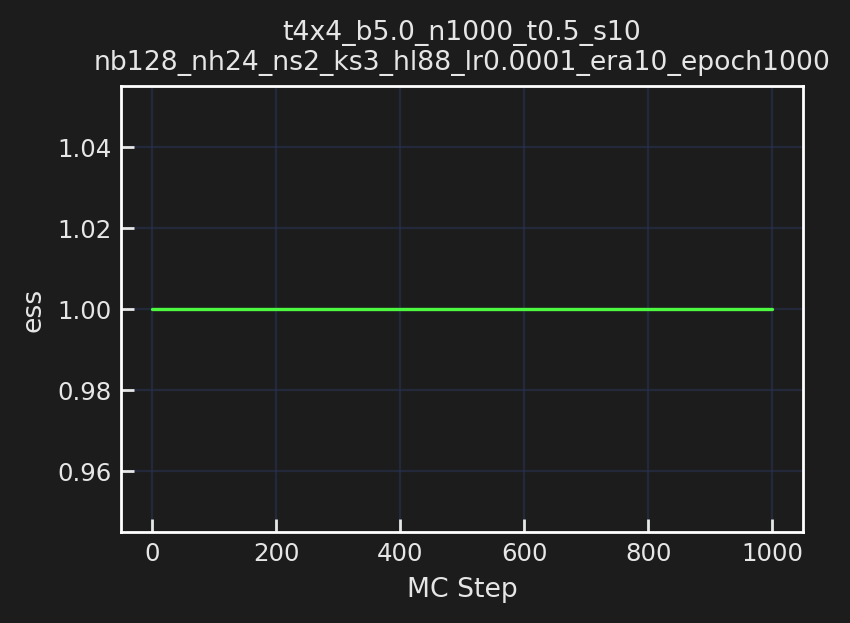

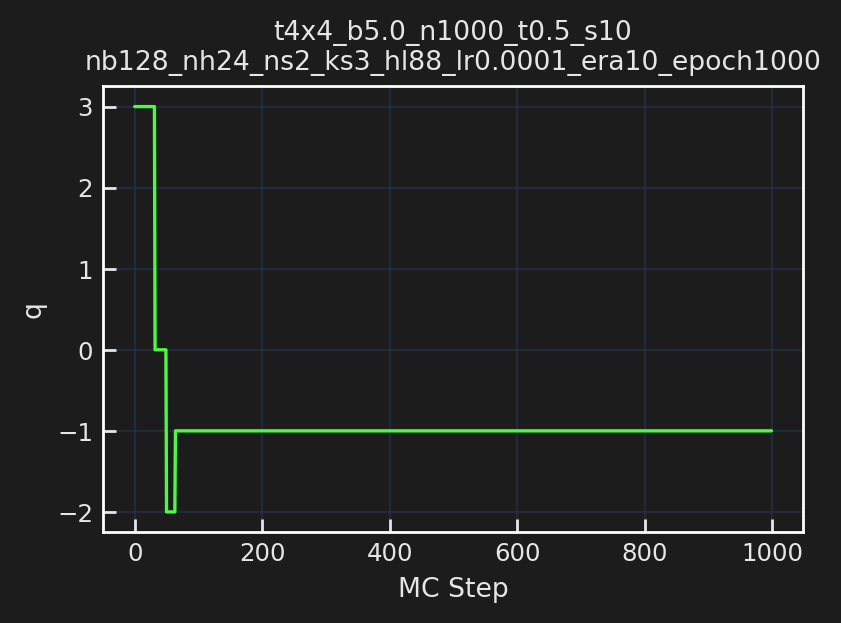

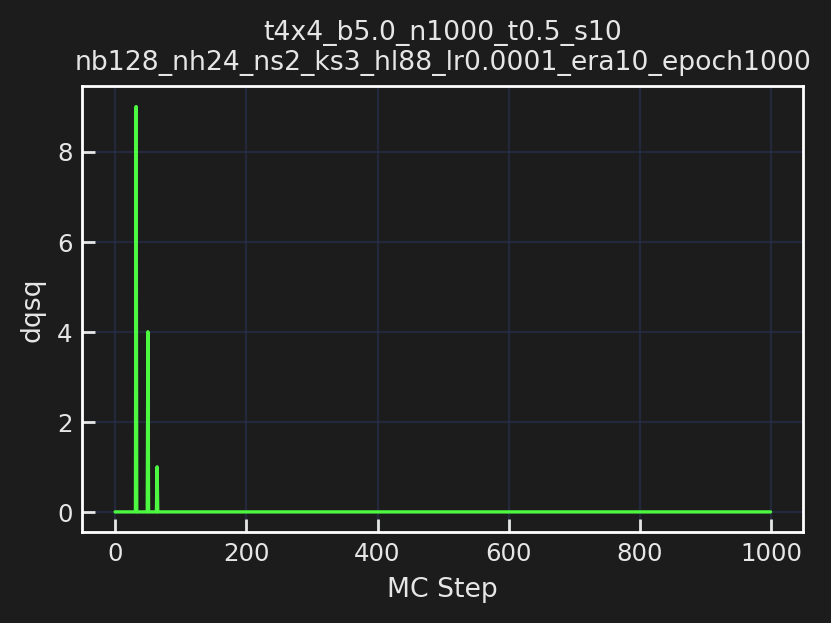

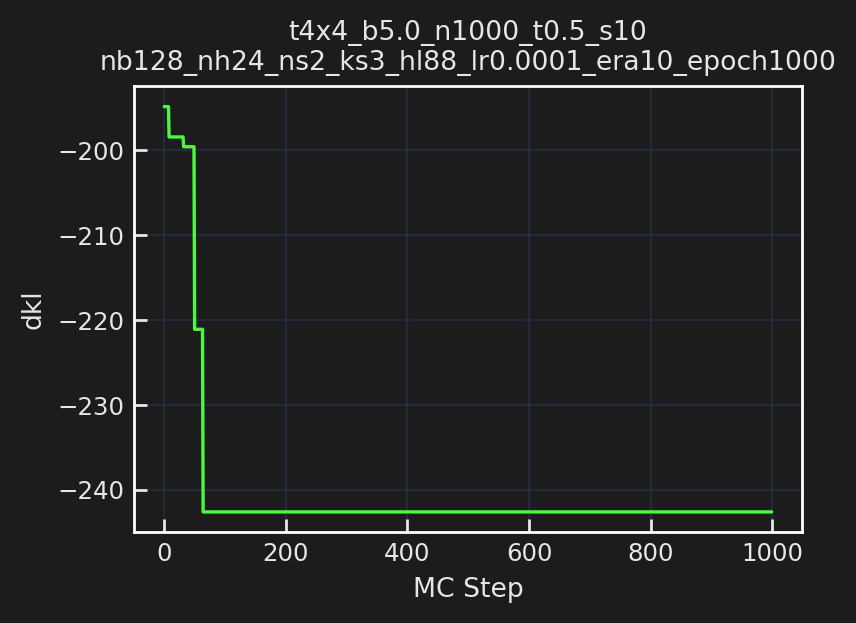

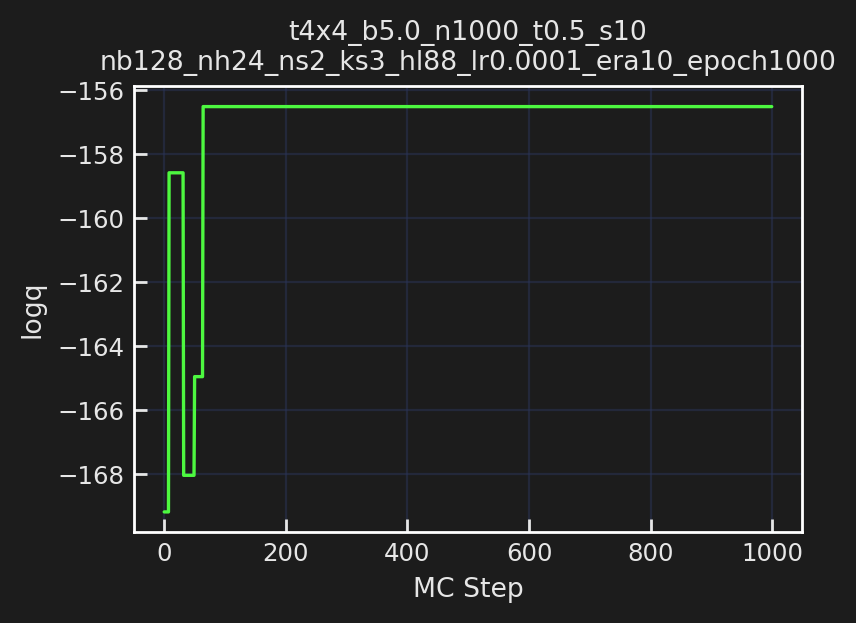

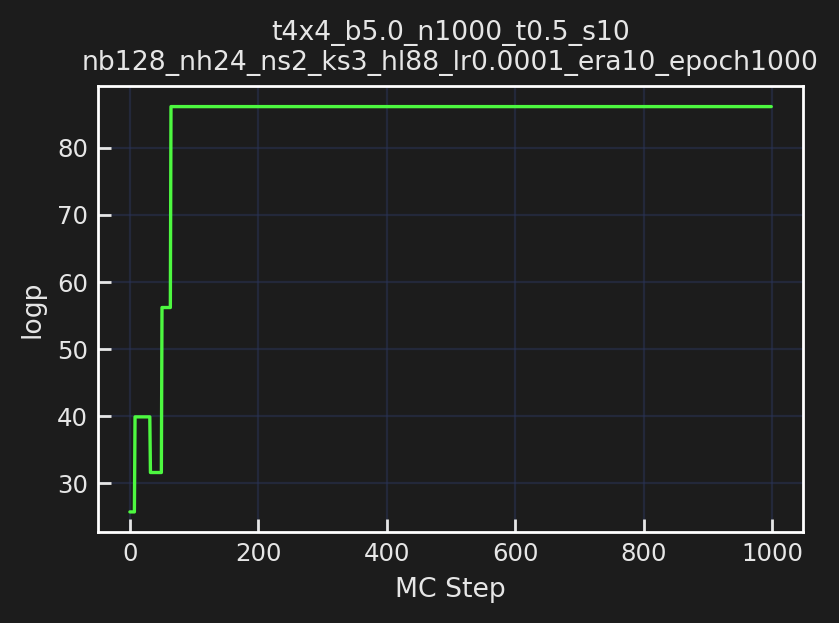

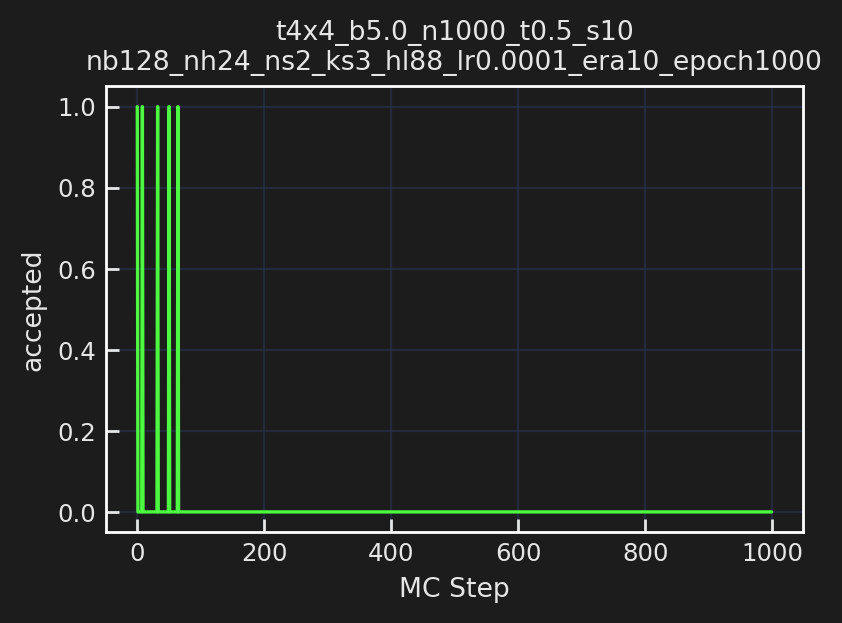

In [20]:
# ----------------------------------------------------------------
# Run inference on transferred model and evaluate / plot metrics
# ----------------------------------------------------------------
import fthmc.utils.qed_helpers as qed
from fthmc.utils.plot_helpers import plot_history
from fthmc.utils.samplers import make_mcmc_ensemble

sns.set_context('paper')
action_fn8 = qed.BatchAction(param8.beta)
dirs8 = train_outputs8['dirs']
logdir8 = dirs8['logdir']

inf_dir8 = os.path.join(logdir8, 'inference')
inf_pdir8 = os.path.join(inf_dir8, 'plots')
history8 = make_mcmc_ensemble(model=train_outputs8['model'],
                               action_fn=action_fn8,
                               batch_size=train_config8.batch_size,
                               num_samples=1000)
plot_history(history=history8,
             param=param8, config=train_config8, skip=['epoch', 'x'],
             num_chains=4, therm_frac=0.0, xlabel='MC Step', outdir=inf_pdir8)

ModuleList(
  (0): GaugeEquivCouplingLayer(
    (plaq_coupling): NCPPlaqCouplingLayer(
      (net): Sequential(
        (0): Conv2d(2, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (1): SiLU()
        (2): Conv2d(8, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (3): SiLU()
        (4): Conv2d(8, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
      )
    )
  )
  (1): GaugeEquivCouplingLayer(
    (plaq_coupling): NCPPlaqCouplingLayer(
      (net): Sequential(
        (0): Conv2d(2, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (1): SiLU()
        (2): Conv2d(8, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (3): SiLU()
        (4): Conv2d(8, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
      )
    )
  )
  (2): GaugeEquivCouplingLayer(
    (plaq_coupling): NCPPlaqCouplingLaye

[23:11:36]  Creating directory: ../../logs/hmc/t16x16_b5.0_n1000_t0.5_s10/plots

[23:11:36]  Param:                                                                           
            ----------------                                                                 
            beta=5.0                                                                         
            L=16                                                                             
            tau=0.5                                                                          
            nstep=10                                                                         
            ntraj=1000                                                                       
            nrun=1                                                                           
            nprint=100                                                                       
            seed=1331                                                                        
            randinit=False                                                                   
            nth_interop=2                                                                    
            nth=2                                                                            
            lat=[16, 16]                                                                     
            nd=2                                                                             
            shape=[2, 16, 16]                                                                
            volume=256                                                                       
            dt=0.05

──────────────────────────────── RUN: 0, last took: 0 m 0 s ─────────────────────────────────

            plaq=1.000 q=0.000

            traj=2 dt=0.007 acc=1.000 dH=-0.064 q=0 dqsq=0 plaq=0.937

[23:11:37]  traj=102 dt=0.006 acc=1.000 dH=0.001 q=0 dqsq=0 plaq=0.903

            traj=202 dt=0.007 acc=1.000 dH=0.010 q=0 dqsq=0 plaq=0.906

[23:11:38]  traj=302 dt=0.006 acc=1.000 dH=-0.053 q=0 dqsq=0 plaq=0.895

[23:11:39]  traj=402 dt=0.006 acc=1.000 dH=0.071 q=0 dqsq=0 plaq=0.906

            traj=502 dt=0.006 acc=1.000 dH=-0.300 q=-1 dqsq=0 plaq=0.878

[23:11:40]  traj=602 dt=0.006 acc=1.000 dH=-0.128 q=-1 dqsq=1 plaq=0.897

            traj=702 dt=0.006 acc=1.000 dH=0.001 q=-1 dqsq=0 plaq=0.890

[23:11:41]  traj=802 dt=0.006 acc=1.000 dH=-0.092 q=-1 dqsq=0 plaq=0.870

[23:11:42]  traj=902 dt=0.006 acc=1.000 dH=-0.013 q=0 dqsq=0 plaq=0.894

[23:11:42]  Creating directory: ../../logs/hmc/t16x16_b5.0_n1000_t0.5_s10/plots/run0

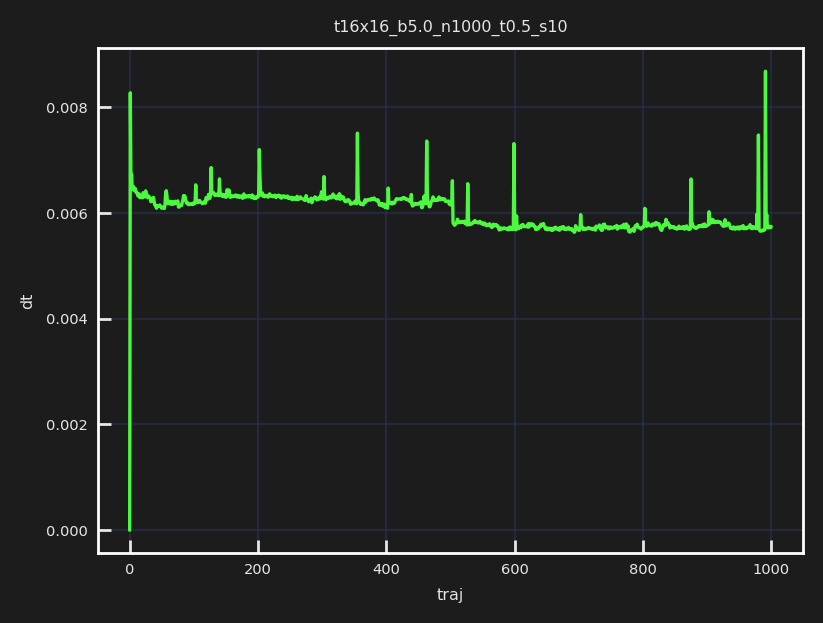

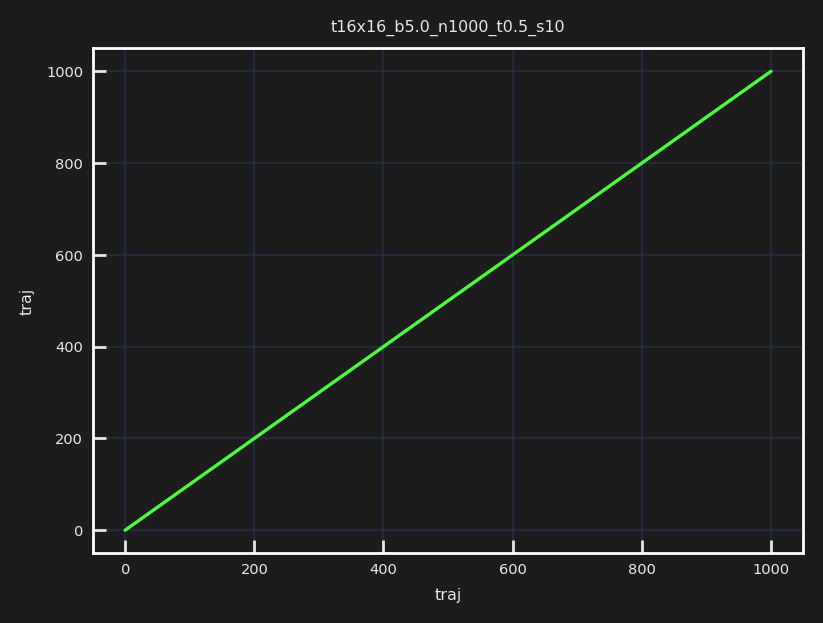

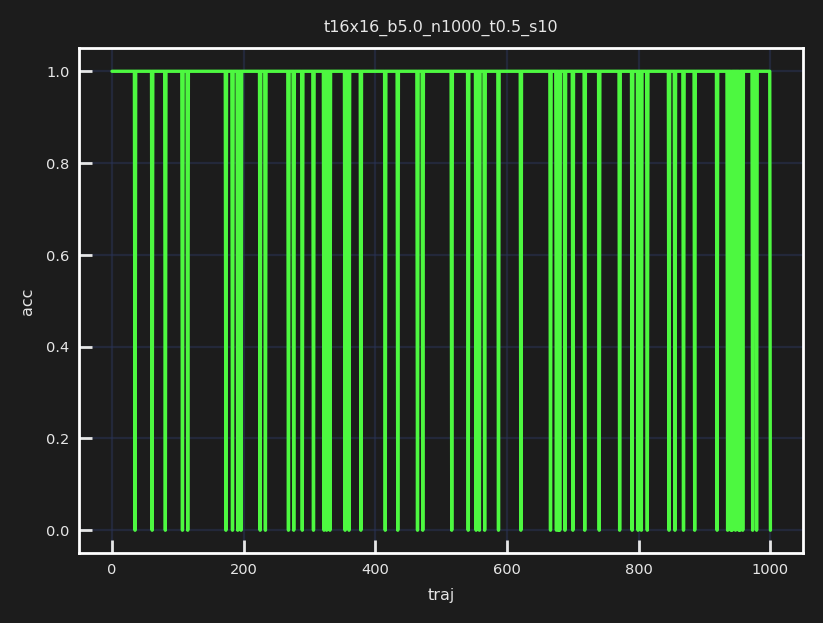

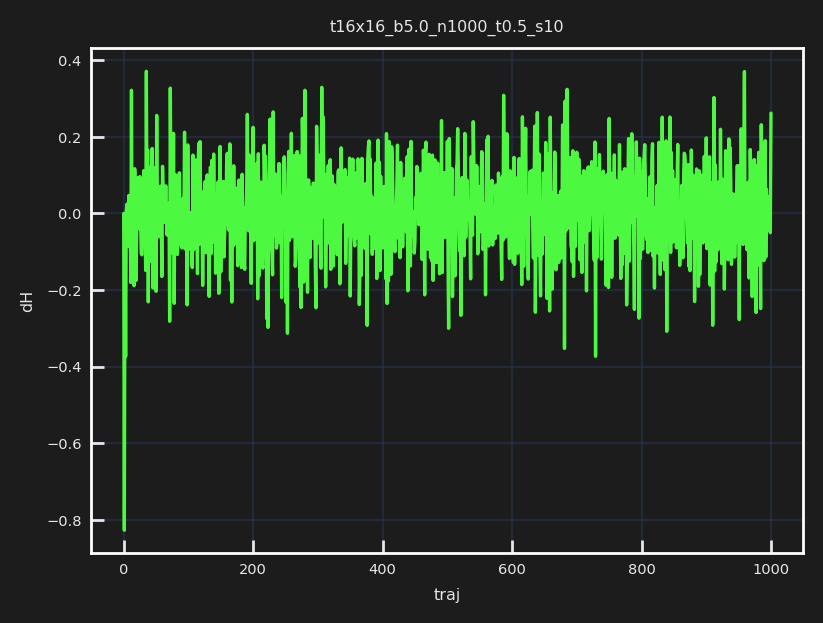

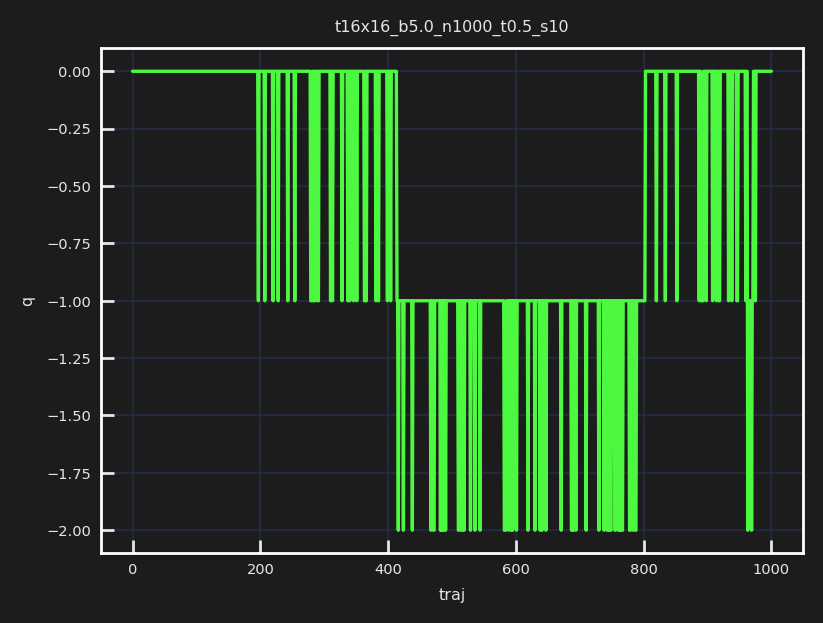

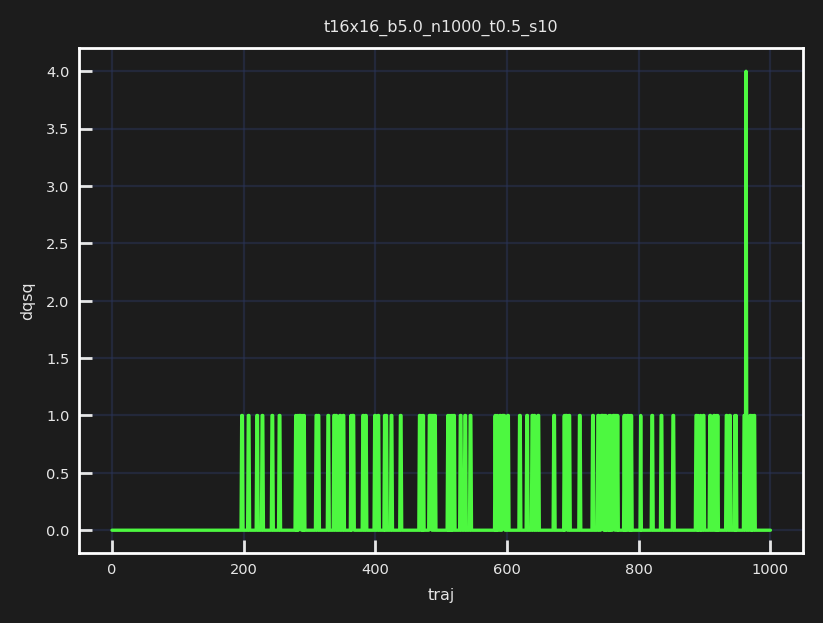

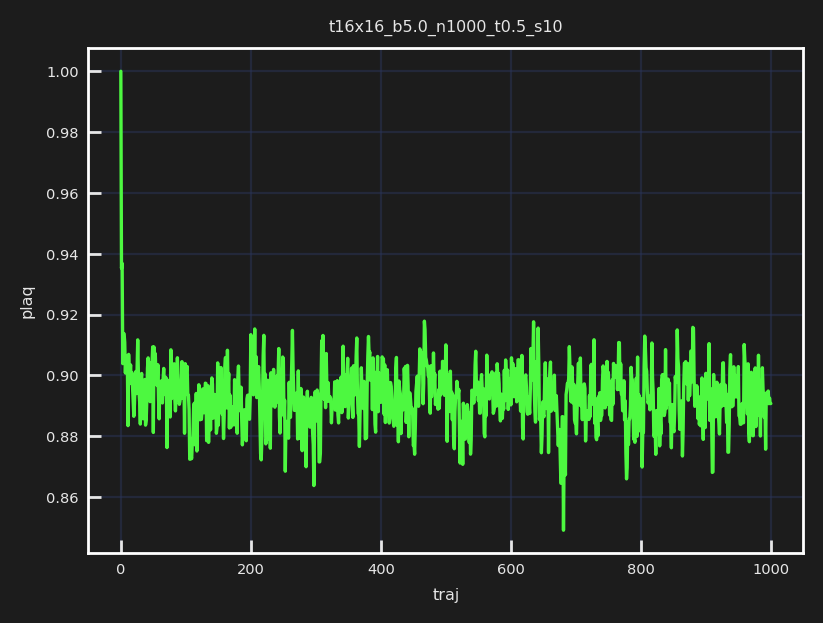

[23:11:44]  Run times: ['6.1637']

            Per trajectory: ['0.0062']

[23:11:44]  Saving hmc_histories to                                                          
            ../../logs/hmc/t16x16_b5.0_n1000_t0.5_s10/hmc_histories.z.

[23:11:45]  Saving hmc_fields_arr to                                                         
            ../../logs/hmc/t16x16_b5.0_n1000_t0.5_s10/hmc_fields_arr.z.

[23:11:45]  Creating directory: ../../logs/t16x16_b5.0_n1000_t0.5_s10/nb128_nh24_ns2_ks3_hl88
            _lr0.0001_era10_epoch1000

[23:11:45]  Creating directory: ../../logs/t16x16_b5.0_n1000_t0.5_s10/nb128_nh24_ns2_ks3_hl88
            _lr0.0001_era10_epoch1000/training

[23:11:45]  Creating directory: ../../logs/t16x16_b5.0_n1000_t0.5_s10/nb128_nh24_ns2_ks3_hl88
            _lr0.0001_era10_epoch1000/training/plots

[23:11:45]  Creating directory: ../../logs/t16x16_b5.0_n1000_t0.5_s10/nb128_nh24_ns2_ks3_hl88
            _lr0.0001_era10_epoch1000/training/checkpoints

[23:11:45]  Scheduler created!

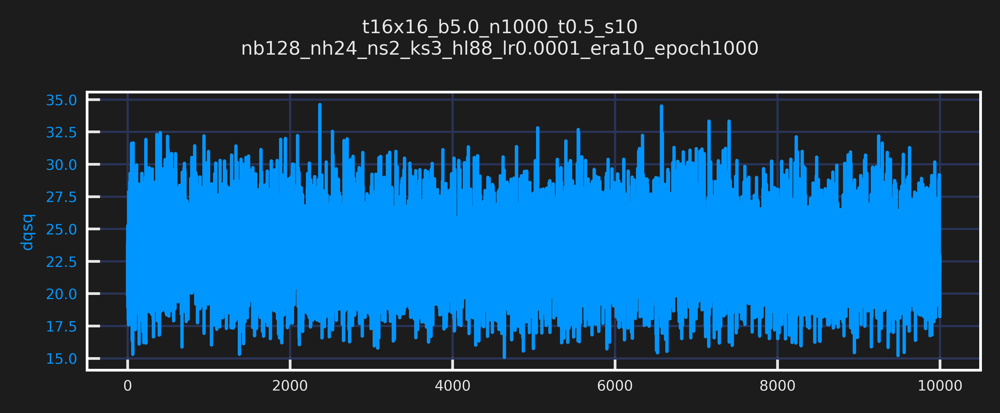

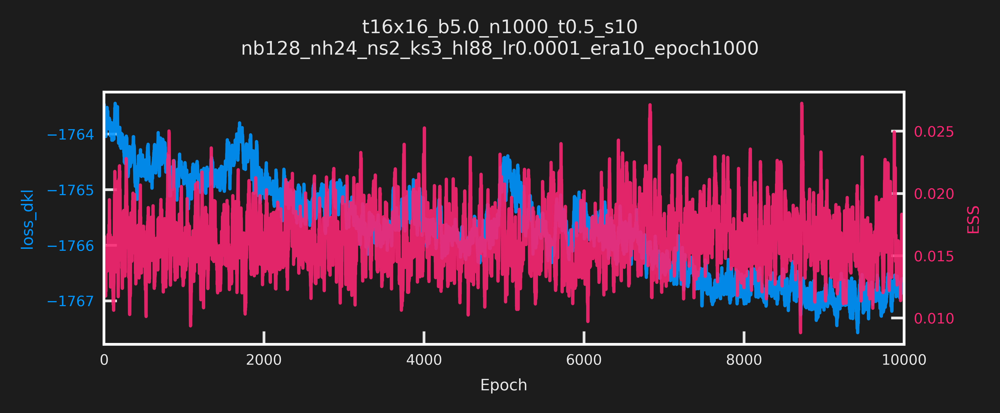

─────────────────────────────── ERA=0, last took: 0 min 0 sec ───────────────────────────────

[23:12:53]  (now) epoch: 499 dt=0.132 ess=0.021 loss_dkl=-1764.314 logp=1119.397             
            logq=-644.917 dqsq=31.117 plaq=0.875

            (avg) epoch: 499 dt=0.133 ess=0.016 loss_dkl=-1764.553 logp=1119.239             
            logq=-645.314 dqsq=23.265 plaq=0.874

[23:14:02]  (now) epoch: 999 dt=0.132 ess=0.010 loss_dkl=-1764.322 logp=1116.355             
            logq=-647.967 dqsq=23.477 plaq=0.872

            (avg) epoch: 999 dt=0.133 ess=0.014 loss_dkl=-1764.716 logp=1119.744             
            logq=-644.972 dqsq=23.305 plaq=0.875

[23:14:03]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/checkpoints
            /ckpt-era0-epoch999.tar

───────────────────────────── ERA=1, last took: 2 min 17.06 sec ─────────────────────────────

[23:15:12]  (now) epoch: 499 dt=0.132 ess=0.019 loss_dkl=-1765.069 logp=1121.492             
            logq=-643.577 dqsq=28.250 plaq=0.876

            (avg) epoch: 499 dt=0.208 ess=0.017 loss_dkl=-1764.751 logp=1121.069             
            logq=-643.683 dqsq=24.691 plaq=0.876

[23:16:22]  (now) epoch: 999 dt=0.132 ess=0.008 loss_dkl=-1764.598 logp=1119.830             
            logq=-644.768 dqsq=21.445 plaq=0.875

            (avg) epoch: 999 dt=0.132 ess=0.014 loss_dkl=-1764.980 logp=1120.551             
            logq=-644.429 dqsq=23.460 plaq=0.875

[23:16:23]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/checkpoints
            /ckpt-era1-epoch999.tar

───────────────────────────── ERA=2, last took: 2 min 20.18 sec ─────────────────────────────

[23:17:31]  (now) epoch: 499 dt=0.133 ess=0.013 loss_dkl=-1765.598 logp=1122.684             
            logq=-642.914 dqsq=25.242 plaq=0.877

            (avg) epoch: 499 dt=0.132 ess=0.014 loss_dkl=-1765.442 logp=1120.870             
            logq=-644.571 dqsq=22.111 plaq=0.876

[23:18:40]  (now) epoch: 999 dt=0.132 ess=0.010 loss_dkl=-1765.166 logp=1120.650             
            logq=-644.515 dqsq=25.883 plaq=0.876

            (avg) epoch: 999 dt=0.132 ess=0.018 loss_dkl=-1765.177 logp=1121.645             
            logq=-643.532 dqsq=22.620 plaq=0.876

[23:18:41]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/checkpoints
            /ckpt-era2-epoch999.tar

───────────────────────────── ERA=3, last took: 2 min 18.14 sec ─────────────────────────────

[23:19:49]  (now) epoch: 499 dt=0.136 ess=0.012 loss_dkl=-1766.067 logp=1123.451             
            logq=-642.616 dqsq=24.641 plaq=0.878

            (avg) epoch: 499 dt=0.137 ess=0.015 loss_dkl=-1765.878 logp=1121.890             
            logq=-643.987 dqsq=22.670 plaq=0.876

[23:20:57]  (now) epoch: 999 dt=0.130 ess=0.012 loss_dkl=-1765.979 logp=1123.582             
            logq=-642.397 dqsq=22.773 plaq=0.878

            (avg) epoch: 999 dt=0.130 ess=0.014 loss_dkl=-1765.342 logp=1121.148             
            logq=-644.194 dqsq=23.109 plaq=0.876

[23:20:58]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/checkpoints
            /ckpt-era3-epoch999.tar

───────────────────────────── ERA=4, last took: 2 min 16.62 sec ─────────────────────────────

[23:22:05]  (now) epoch: 499 dt=0.130 ess=0.016 loss_dkl=-1766.780 logp=1122.915             
            logq=-643.864 dqsq=25.227 plaq=0.877

            (avg) epoch: 499 dt=0.130 ess=0.017 loss_dkl=-1765.879 logp=1121.731             
            logq=-644.148 dqsq=22.668 plaq=0.876

[23:23:12]  (now) epoch: 999 dt=0.130 ess=0.012 loss_dkl=-1765.233 logp=1119.584             
            logq=-645.649 dqsq=27.766 plaq=0.875

            (avg) epoch: 999 dt=0.132 ess=0.015 loss_dkl=-1764.727 logp=1121.034             
            logq=-643.693 dqsq=22.817 plaq=0.876

[23:23:13]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/checkpoints
            /ckpt-era4-epoch999.tar

───────────────────────────── ERA=5, last took: 2 min 14.57 sec ─────────────────────────────

[23:24:21]  (now) epoch: 499 dt=0.130 ess=0.008 loss_dkl=-1764.584 logp=1120.484             
            logq=-644.101 dqsq=21.047 plaq=0.875

            (avg) epoch: 499 dt=0.130 ess=0.018 loss_dkl=-1765.494 logp=1121.311             
            logq=-644.183 dqsq=22.661 plaq=0.876

[23:25:29]  (now) epoch: 999 dt=0.130 ess=0.015 loss_dkl=-1766.219 logp=1122.588             
            logq=-643.631 dqsq=24.172 plaq=0.877

            (avg) epoch: 999 dt=0.131 ess=0.015 loss_dkl=-1765.311 logp=1122.228             
            logq=-643.083 dqsq=22.669 plaq=0.877

[23:25:30]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/checkpoints
            /ckpt-era5-epoch999.tar

───────────────────────────── ERA=6, last took: 2 min 15.58 sec ─────────────────────────────

[23:26:37]  (now) epoch: 499 dt=0.133 ess=0.012 loss_dkl=-1765.696 logp=1122.211             
            logq=-643.485 dqsq=28.680 plaq=0.877

[23:26:38]  (avg) epoch: 499 dt=0.133 ess=0.021 loss_dkl=-1765.912 logp=1122.850             
            logq=-643.062 dqsq=23.462 plaq=0.877

[23:27:47]  (now) epoch: 999 dt=0.133 ess=0.010 loss_dkl=-1765.623 logp=1121.539             
            logq=-644.083 dqsq=21.391 plaq=0.876

            (avg) epoch: 999 dt=0.133 ess=0.015 loss_dkl=-1766.240 logp=1121.629             
            logq=-644.611 dqsq=23.400 plaq=0.876

[23:27:48]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/checkpoints
            /ckpt-era6-epoch999.tar

───────────────────────────── ERA=7, last took: 2 min 17.51 sec ─────────────────────────────

[23:28:56]  (now) epoch: 499 dt=0.133 ess=0.014 loss_dkl=-1766.757 logp=1125.348             
            logq=-641.409 dqsq=26.438 plaq=0.879

            (avg) epoch: 499 dt=0.133 ess=0.018 loss_dkl=-1766.759 logp=1123.146             
            logq=-643.613 dqsq=23.568 plaq=0.877

[23:30:06]  (now) epoch: 999 dt=0.138 ess=0.010 loss_dkl=-1766.950 logp=1125.261             
            logq=-641.688 dqsq=19.266 plaq=0.879

            (avg) epoch: 999 dt=0.138 ess=0.016 loss_dkl=-1766.761 logp=1122.689             
            logq=-644.072 dqsq=22.066 plaq=0.877

[23:30:07]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/checkpoints
            /ckpt-era7-epoch999.tar

───────────────────────────── ERA=8, last took: 2 min 18.82 sec ─────────────────────────────

[23:31:15]  (now) epoch: 499 dt=0.130 ess=0.008 loss_dkl=-1765.982 logp=1121.958             
            logq=-644.024 dqsq=19.391 plaq=0.877

            (avg) epoch: 499 dt=0.130 ess=0.015 loss_dkl=-1766.561 logp=1122.850             
            logq=-643.711 dqsq=23.596 plaq=0.877

[23:32:23]  (now) epoch: 999 dt=0.130 ess=0.028 loss_dkl=-1767.569 logp=1125.249             
            logq=-642.320 dqsq=22.195 plaq=0.879

            (avg) epoch: 999 dt=0.130 ess=0.016 loss_dkl=-1766.933 logp=1123.240             
            logq=-643.694 dqsq=23.466 plaq=0.878

[23:32:24]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/checkpoints
            /ckpt-era8-epoch999.tar

───────────────────────────── ERA=9, last took: 2 min 16.3 sec ──────────────────────────────

[23:33:31]  (now) epoch: 499 dt=0.130 ess=0.008 loss_dkl=-1766.168 logp=1120.319             
            logq=-645.850 dqsq=24.961 plaq=0.875

            (avg) epoch: 499 dt=0.130 ess=0.018 loss_dkl=-1766.947 logp=1123.608             
            logq=-643.340 dqsq=21.726 plaq=0.878

[23:34:39]  (now) epoch: 999 dt=0.134 ess=0.008 loss_dkl=-1767.219 logp=1122.893             
            logq=-644.327 dqsq=21.609 plaq=0.877

[23:34:40]  (avg) epoch: 999 dt=0.133 ess=0.015 loss_dkl=-1766.733 logp=1123.514             
            logq=-643.219 dqsq=23.026 plaq=0.878

[23:34:41]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/checkpoints
            /ckpt-era9-epoch999.tar

[23:34:42]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/checkpoints
            /ckpt-era10-epoch1001.tar

[23:34:43]  Saving live plots to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/plots

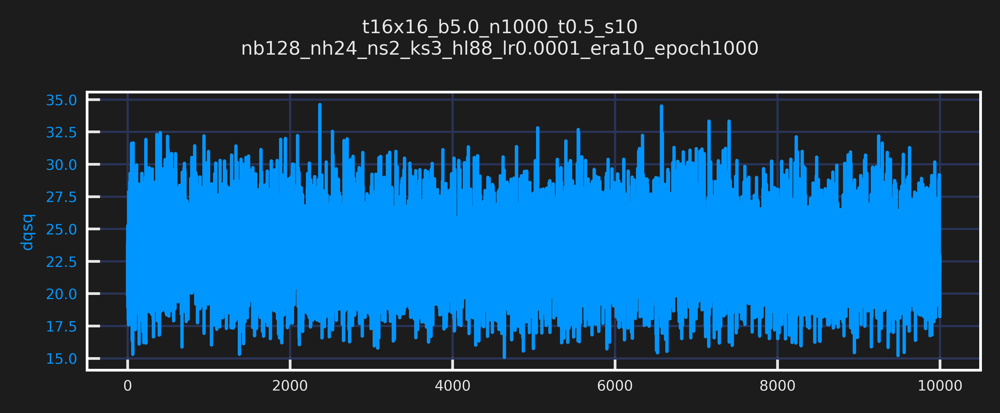

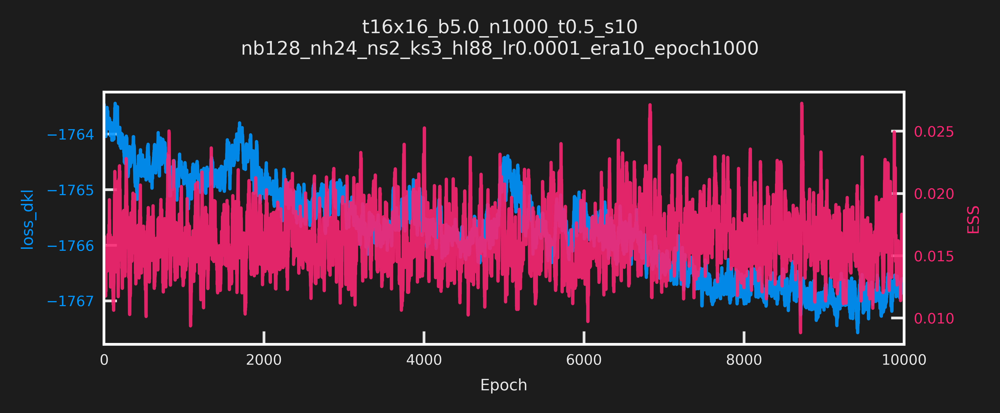

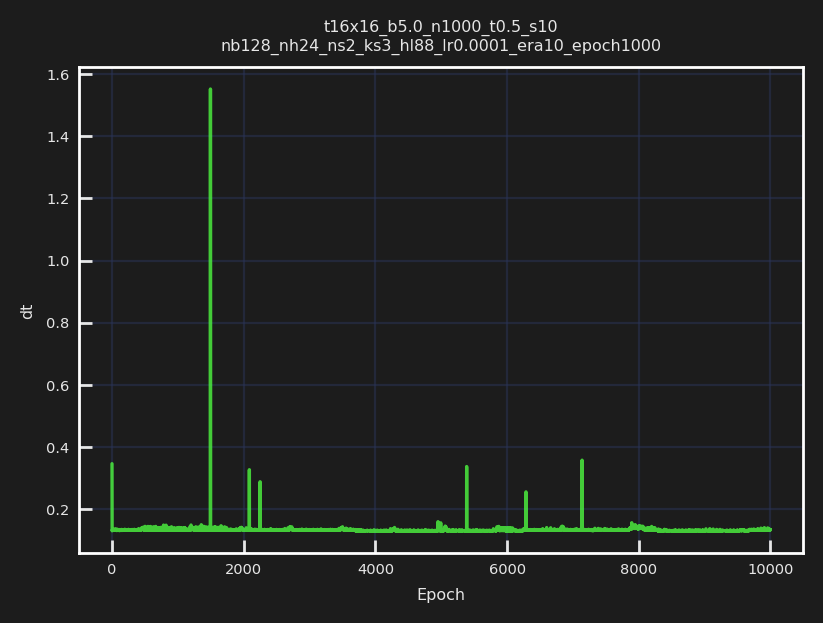

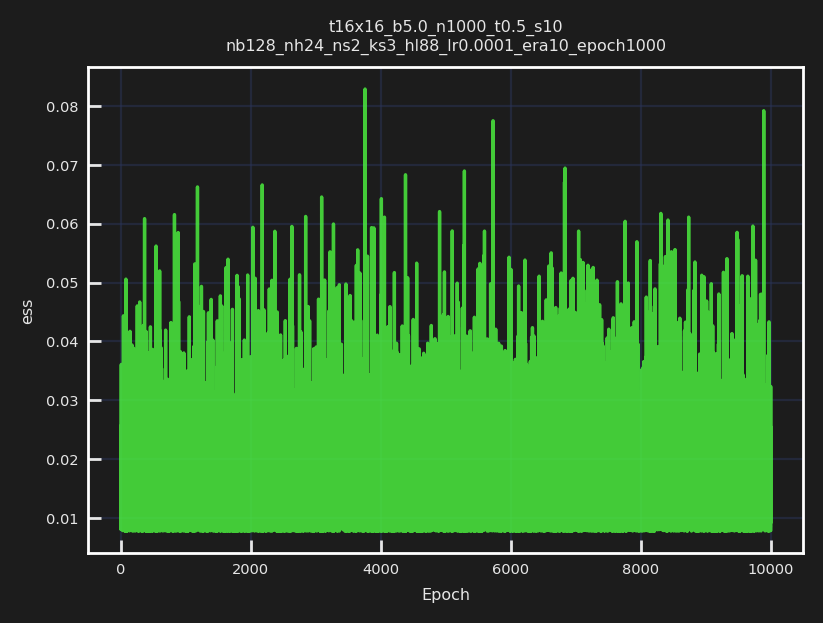

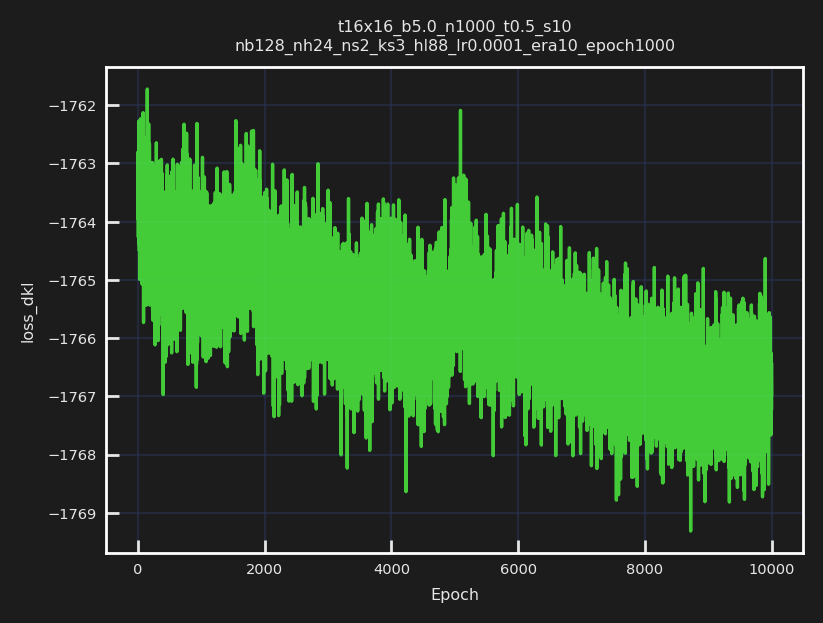

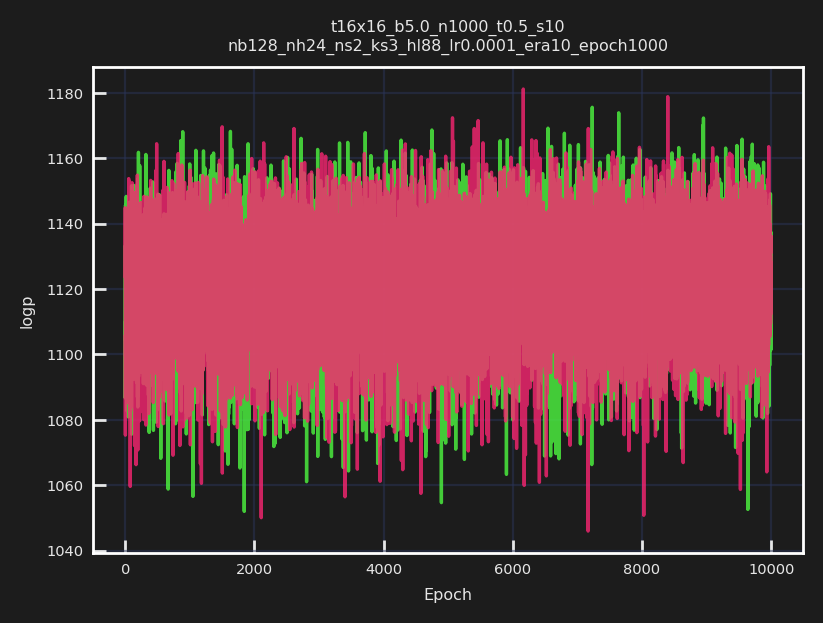

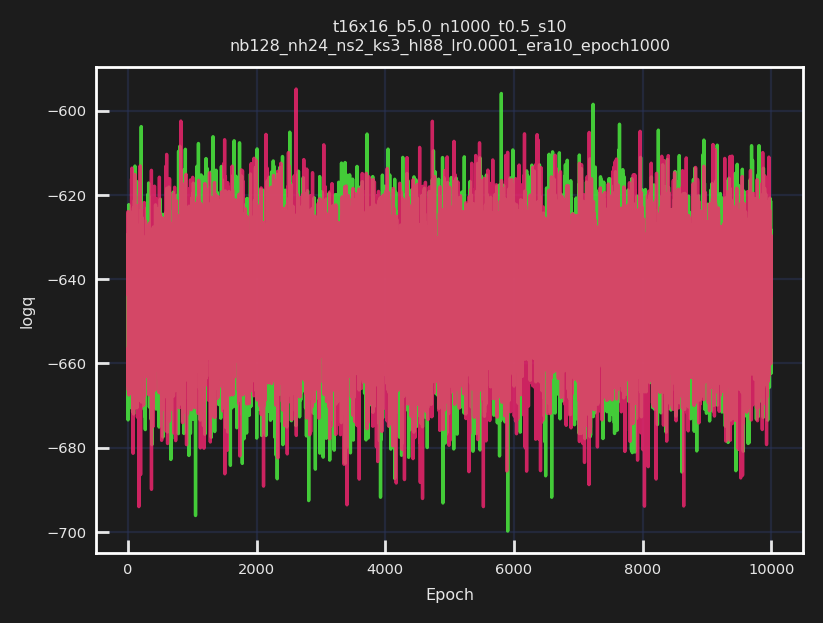

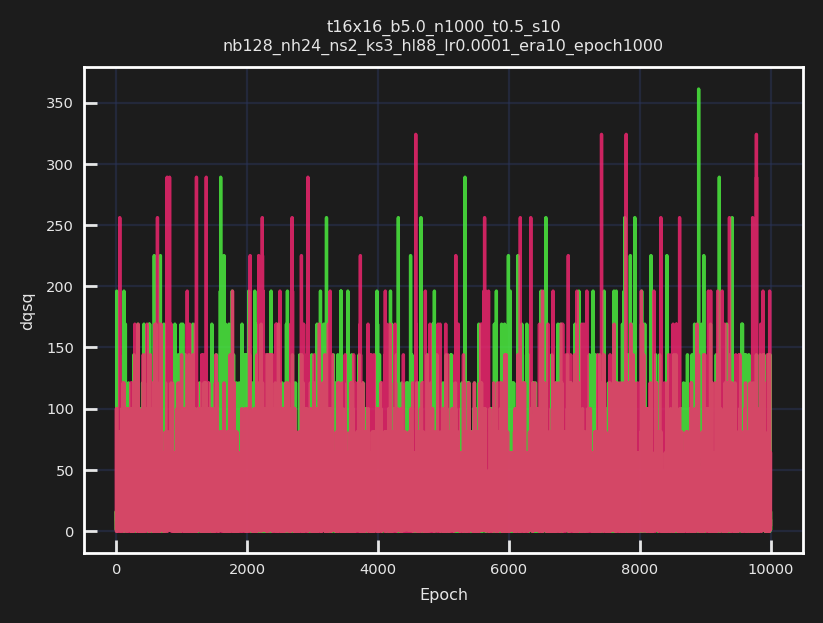

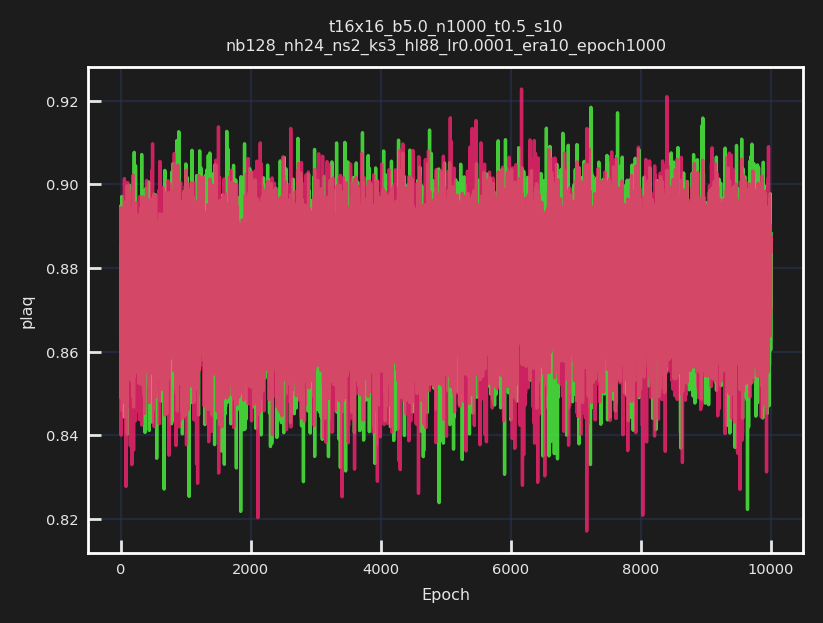

[23:34:47]  Saving train_history to ../../logs/t16x16_b5.0_n1000_t0.5_s10/nb128_nh24_ns2_ks3_
            hl88_lr0.0001_era10_epoch1000/training/train_history.z.

NameError: name 'param16' is not defined

In [22]:
layers = train_outputs['model'].layers #['layers']
layers.train()
train_outputs16 = transfer(L=16, param_init=param,
                          config_init=train_config,
                          layers_init=layers, 
                          new_lr=0.0001, run_hmc=True)

# ----------------------------------------------------------------
# Run inference on transferred model and evaluate / plot metrics
# ----------------------------------------------------------------
import fthmc.utils.qed_helpers as qed
from fthmc.utils.plot_helpers import plot_history
from fthmc.utils.samplers import make_mcmc_ensemble

sns.set_context('paper')
action_fn16 = qed.BatchAction(param16.beta)
dirs16 = train_outputs16['dirs']
logdir16 = dirs16['logdir']

inf_dir16 = os.path.join(logdir16, 'inference')
inf_pdir16 = os.path.join(inf_dir16, 'plots')
history16 = make_mcmc_ensemble(model=train_outputs16['model'],
                               action_fn=action_fn16,
                               batch_size=train_config16.batch_size,
                               num_samples=1000)
plot_history(history=history16,
             param=param16, config=train_config16, skip=['epoch', 'x'],
             num_chains=4, therm_frac=0.0, xlabel='MC Step', outdir=inf_pdir16)

In [23]:
train_outputs16.keys()

dict_keys(['param', 'config', 'model', 'outputs'])

[23:46:18]  Creating directory: ../../logs/t16x16_b5.0_n1000_t0.5_s10/nb128_nh24_ns2_ks3_hl88
            _lr0.0001_era10_epoch1000/inference/plots

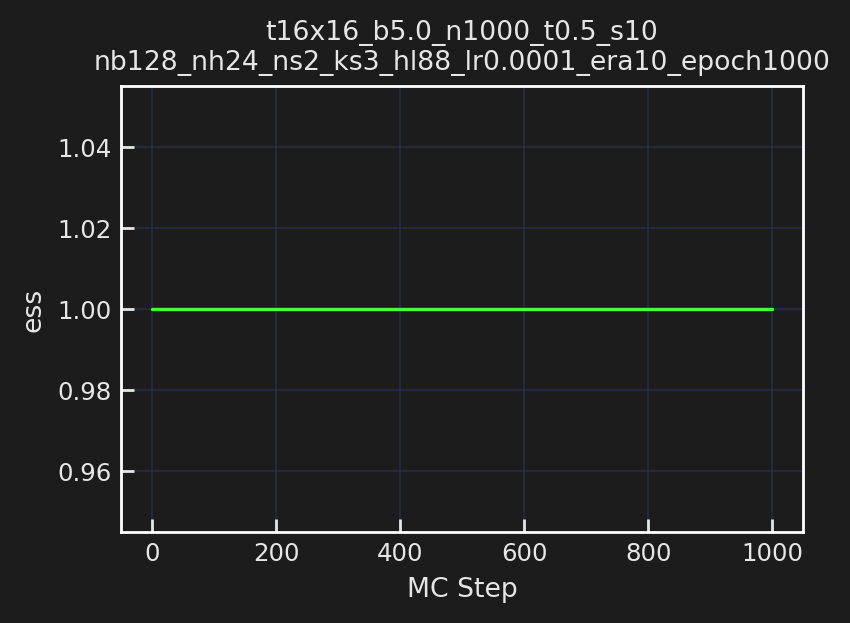

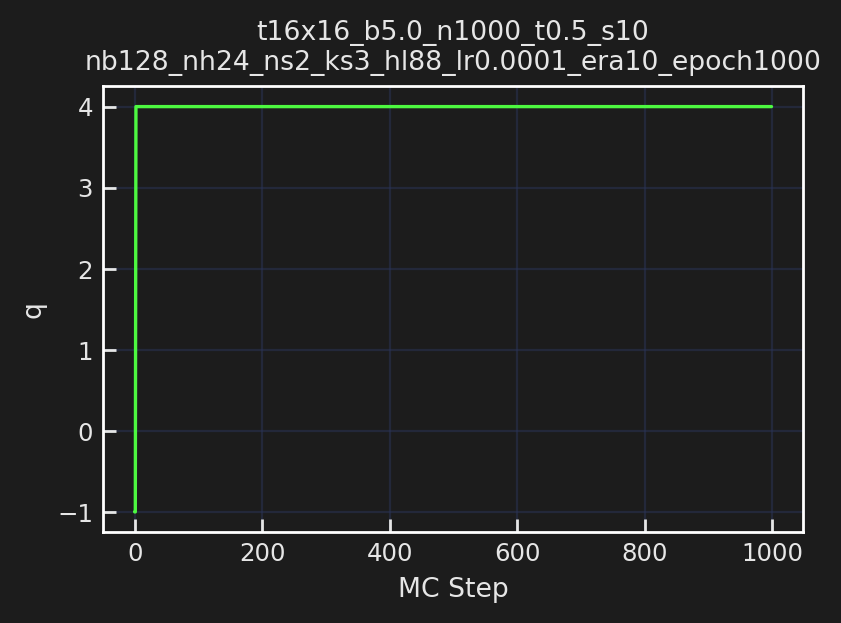

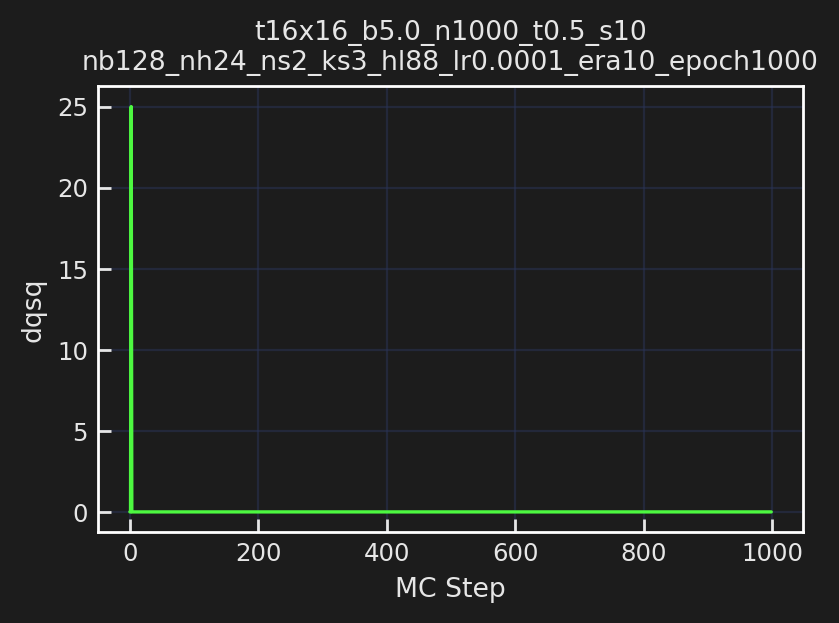

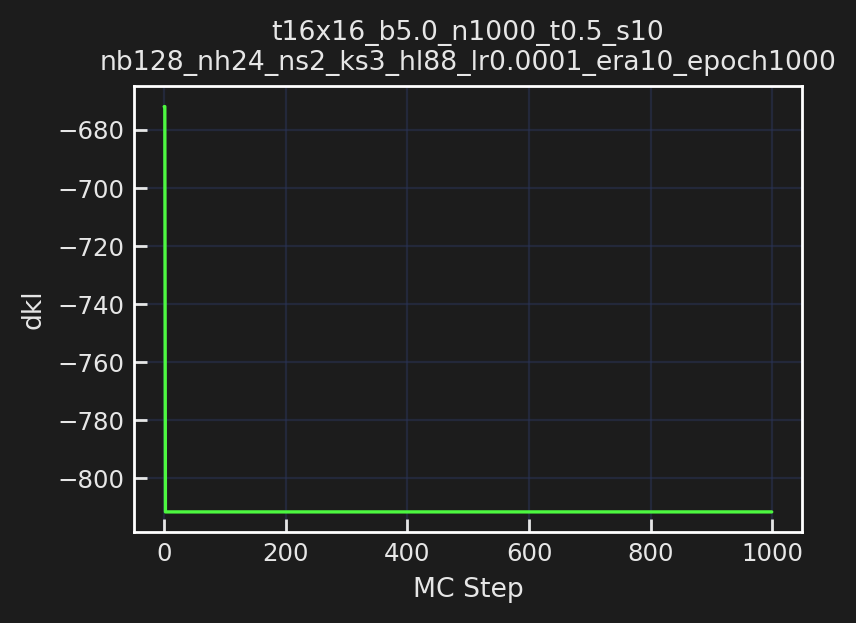

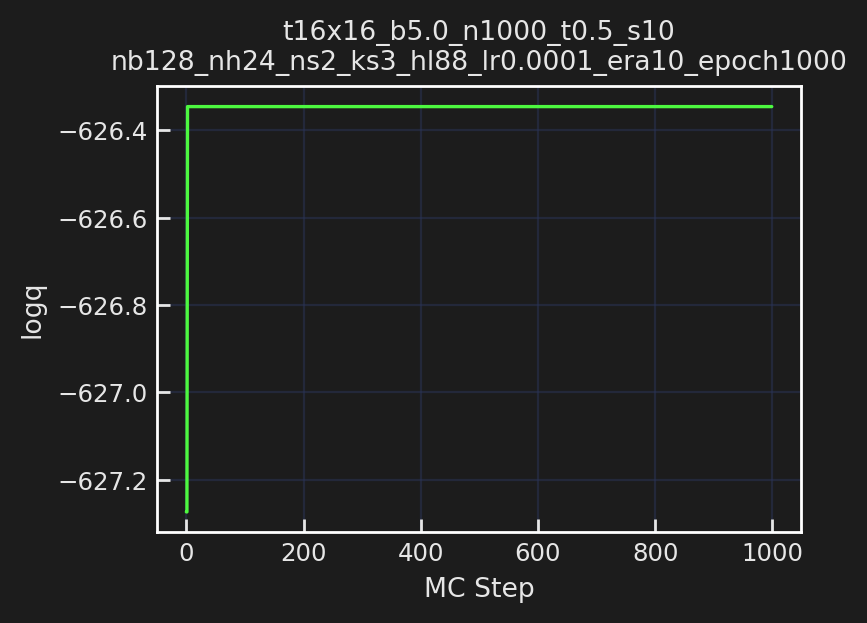

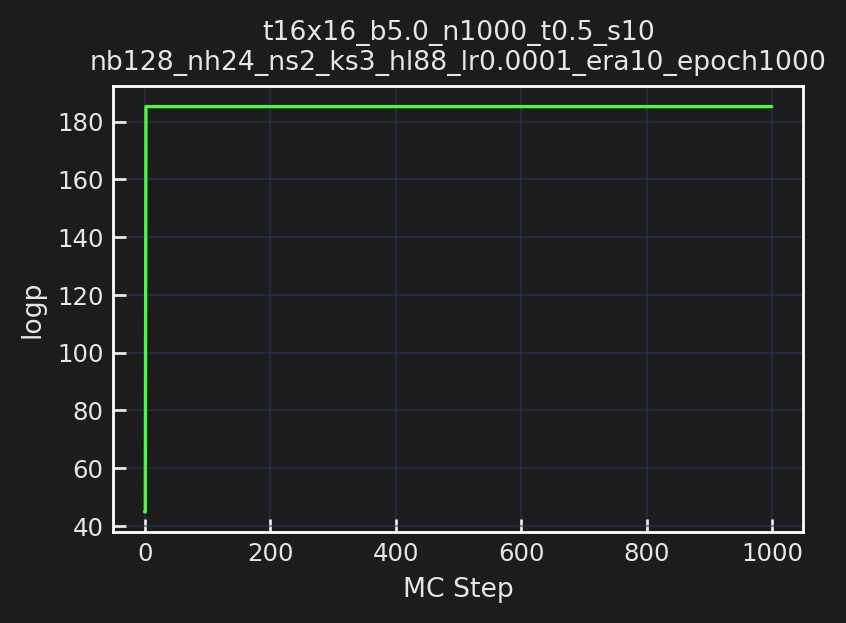

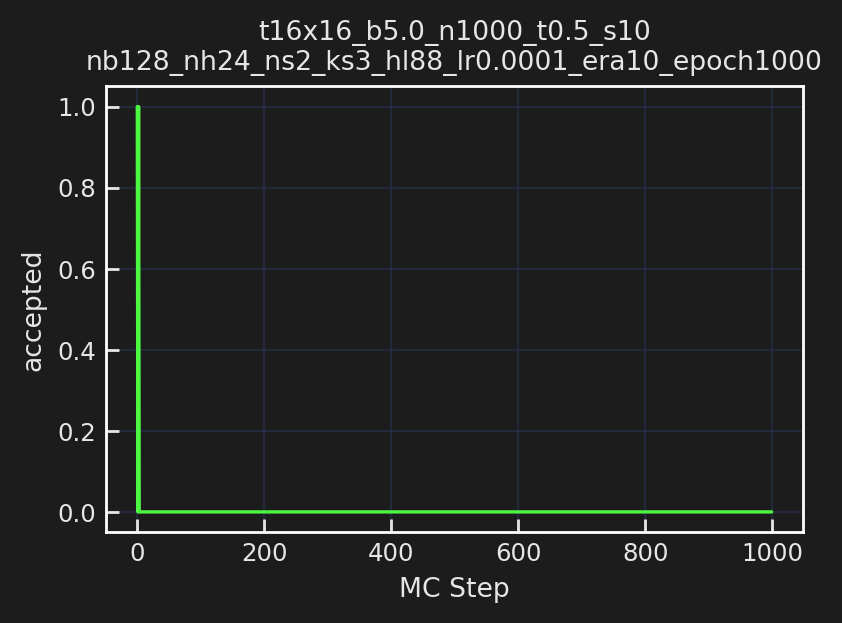

In [24]:
# ----------------------------------------------------------------
# Run inference on transferred model and evaluate / plot metrics
# ----------------------------------------------------------------
import fthmc.utils.qed_helpers as qed
from fthmc.utils.plot_helpers import plot_history
from fthmc.utils.samplers import make_mcmc_ensemble

sns.set_context('paper')

param16 = train_outputs16['param']
train_config16 = train_outputs16['config']
model16 = train_outputs16['model']
outputs16 = train_outputs16['outputs']

action_fn16 = qed.BatchAction(param16.beta)
dirs16 = outputs16['dirs']
logdir16 = dirs16['logdir']

inf_dir16 = os.path.join(logdir16, 'inference')
inf_pdir16 = os.path.join(inf_dir16, 'plots')
history16 = make_mcmc_ensemble(model=model16,
                               action_fn=action_fn16,
                               batch_size=train_config16.batch_size,
                               num_samples=1000)
plot_history(history=history16,
             param=param16, config=train_config16, skip=['epoch', 'x'],
             num_chains=4, therm_frac=0.0, xlabel='MC Step', outdir=inf_pdir16)

ModuleList(
  (0): GaugeEquivCouplingLayer(
    (plaq_coupling): NCPPlaqCouplingLayer(
      (net): Sequential(
        (0): Conv2d(2, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (1): SiLU()
        (2): Conv2d(8, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (3): SiLU()
        (4): Conv2d(8, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
      )
    )
  )
  (1): GaugeEquivCouplingLayer(
    (plaq_coupling): NCPPlaqCouplingLayer(
      (net): Sequential(
        (0): Conv2d(2, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (1): SiLU()
        (2): Conv2d(8, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (3): SiLU()
        (4): Conv2d(8, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
      )
    )
  )
  (2): GaugeEquivCouplingLayer(
    (plaq_coupling): NCPPlaqCouplingLaye

[23:48:15]  Creating directory: ../../logs/hmc/t16x16_b5.0_n1000_t0.5_s10/2021-06-21-234815

[23:48:15]  Creating directory:                                                              
            ../../logs/hmc/t16x16_b5.0_n1000_t0.5_s10/2021-06-21-234815/plots

[23:48:15]  Param:                                                                           
            ----------------                                                                 
            beta=5.0                                                                         
            L=16                                                                             
            tau=0.5                                                                          
            nstep=10                                                                         
            ntraj=1000                                                                       
            nrun=1                                                                           
            nprint=100                                                                       
            seed=1331                                                                        
            randinit=False                                                                   
            nth_interop=2                                                                    
            nth=2                                                                            
            lat=[16, 16]                                                                     
            nd=2                                                                             
            shape=[2, 16, 16]                                                                
            volume=256                                                                       
            dt=0.05

──────────────────────────────── RUN: 0, last took: 0 m 0 s ─────────────────────────────────

            plaq=1.000 q=0.000

            traj=2 dt=0.007 acc=1.000 dH=-0.393 q=0 dqsq=0 plaq=0.925

[23:48:16]  traj=102 dt=0.006 acc=1.000 dH=-0.040 q=0 dqsq=0 plaq=0.886

            traj=202 dt=0.007 acc=1.000 dH=-0.041 q=0 dqsq=0 plaq=0.892

[23:48:17]  traj=302 dt=0.006 acc=1.000 dH=0.108 q=0 dqsq=0 plaq=0.902

[23:48:18]  traj=402 dt=0.006 acc=1.000 dH=0.171 q=0 dqsq=0 plaq=0.896

            traj=502 dt=0.006 acc=1.000 dH=-0.104 q=0 dqsq=0 plaq=0.895

[23:48:19]  traj=602 dt=0.006 acc=1.000 dH=0.057 q=0 dqsq=0 plaq=0.901

            traj=702 dt=0.006 acc=1.000 dH=-0.132 q=0 dqsq=0 plaq=0.897

[23:48:20]  traj=802 dt=0.006 acc=1.000 dH=-0.024 q=0 dqsq=0 plaq=0.896

[23:48:21]  traj=902 dt=0.006 acc=1.000 dH=-0.134 q=0 dqsq=0 plaq=0.892

[23:48:21]  Creating directory:                                                              
            ../../logs/hmc/t16x16_b5.0_n1000_t0.5_s10/2021-06-21-234815/plots/run0

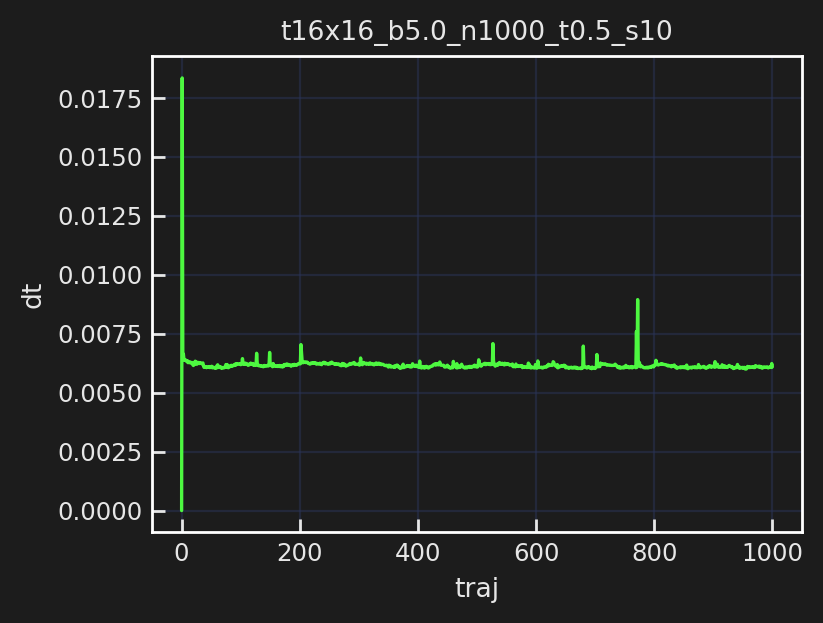

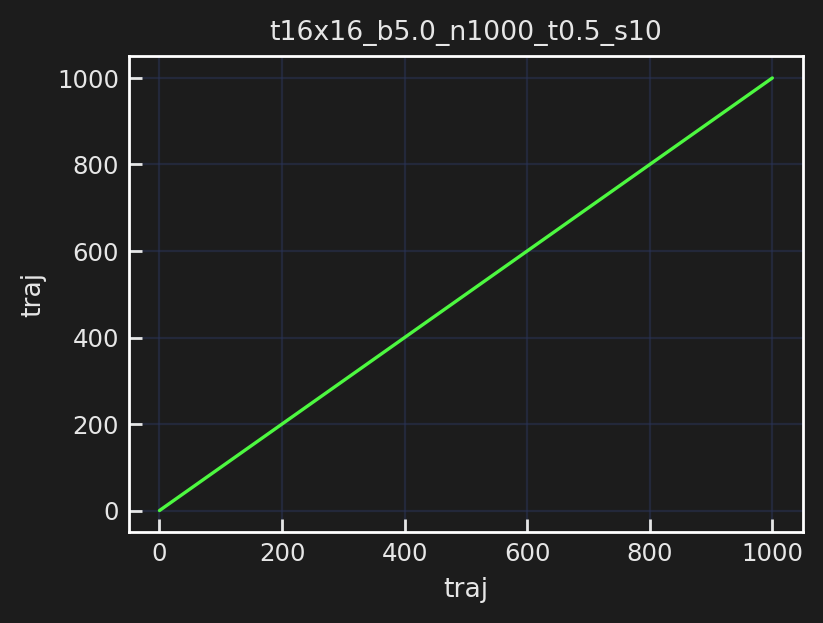

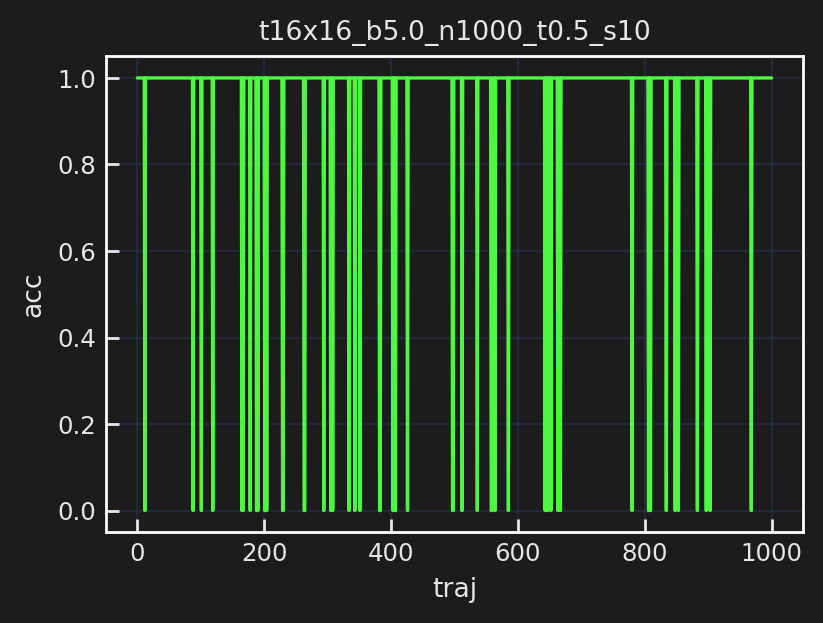

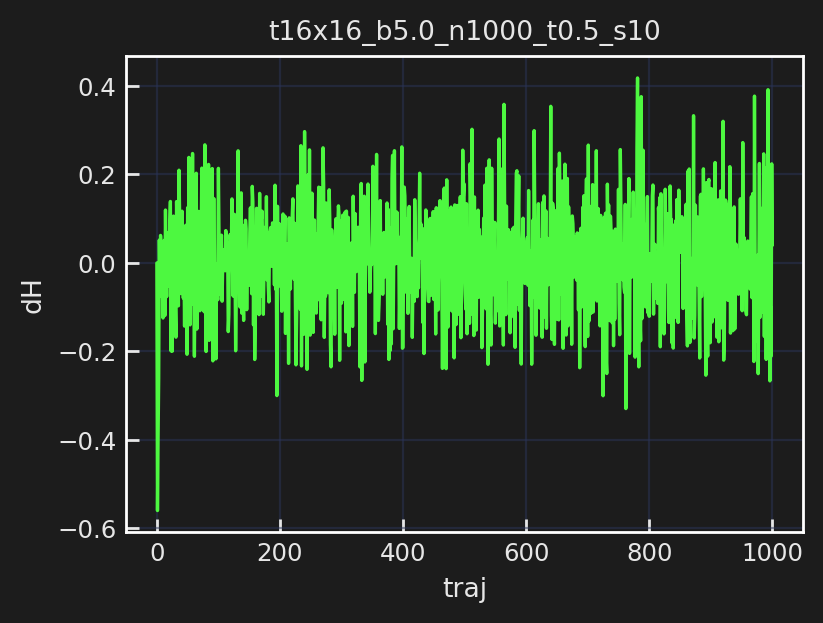

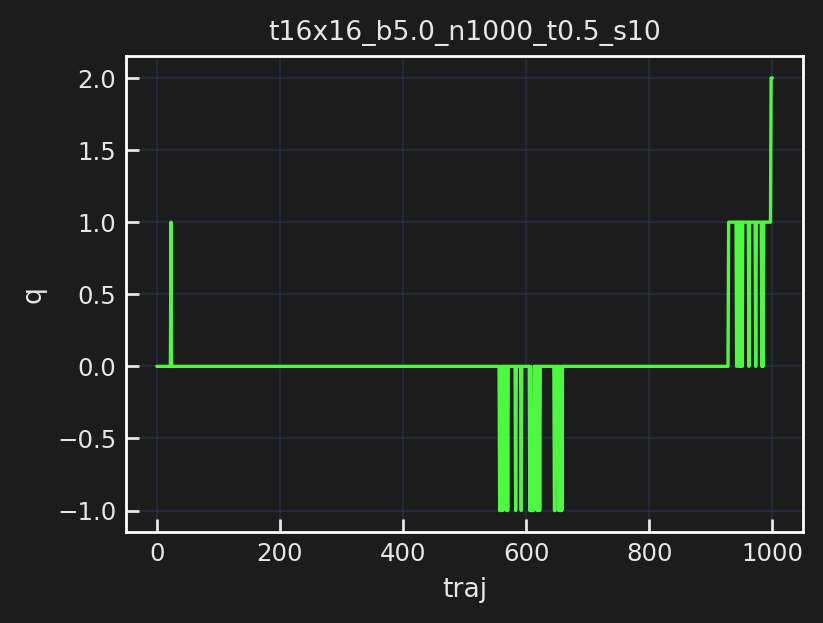

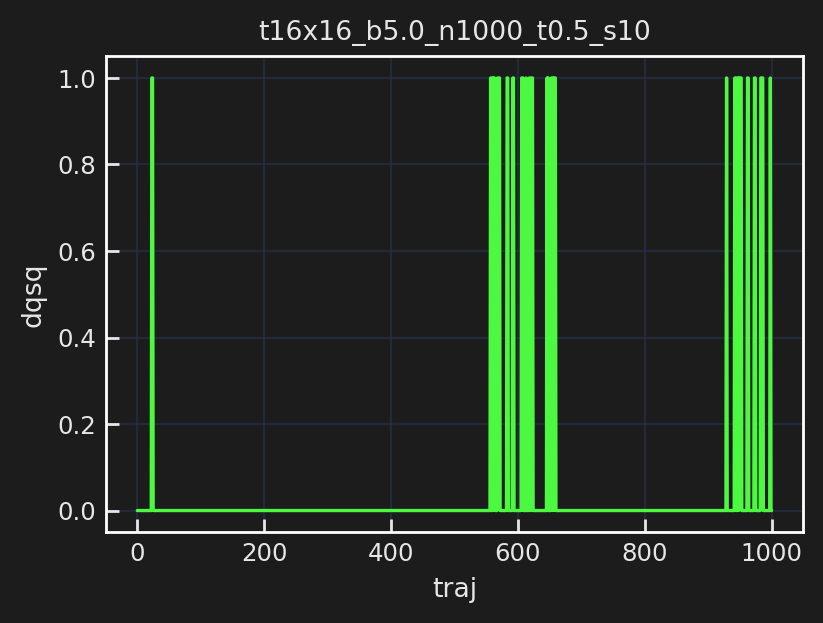

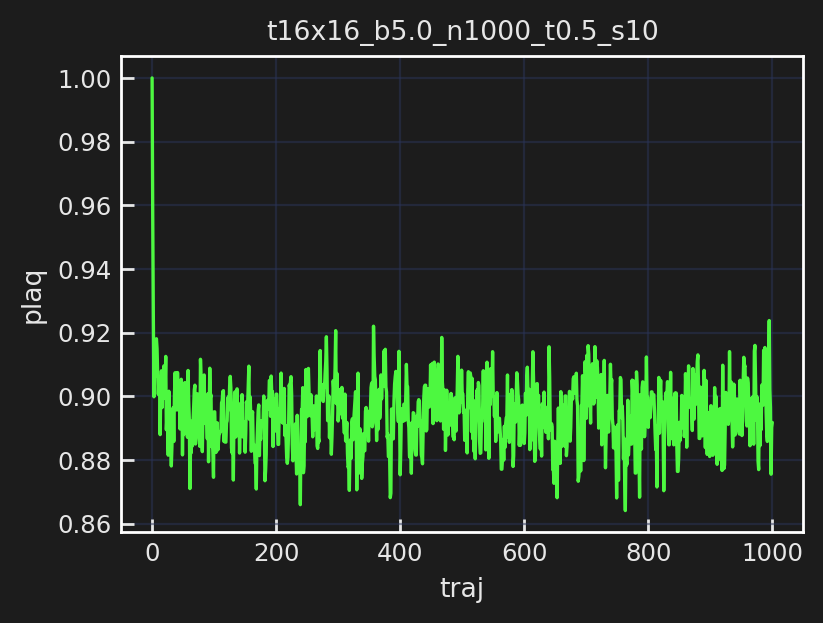

[23:48:23]  Run times: ['6.3122']

            Per trajectory: ['0.0063']

[23:48:23]  Saving hmc_histories to                                                          
            ../../logs/hmc/t16x16_b5.0_n1000_t0.5_s10/2021-06-21-234815/hmc_histories.z.

[23:48:23]  Saving hmc_fields_arr to                                                         
            ../../logs/hmc/t16x16_b5.0_n1000_t0.5_s10/2021-06-21-234815/hmc_fields_arr.z.

[23:48:24]  Creating directory: ../../logs/t16x16_b5.0_n1000_t0.5_s10/nb128_nh24_ns2_ks3_hl88
            _lr0.0001_era10_epoch1000/training/2021-06-21-234824

[23:48:24]  Creating directory: ../../logs/t16x16_b5.0_n1000_t0.5_s10/nb128_nh24_ns2_ks3_hl88
            _lr0.0001_era10_epoch1000/training/2021-06-21-234824/plots

[23:48:24]  Creating directory: ../../logs/t16x16_b5.0_n1000_t0.5_s10/nb128_nh24_ns2_ks3_hl88
            _lr0.0001_era10_epoch1000/training/2021-06-21-234824/checkpoints

[23:48:24]  Scheduler created!

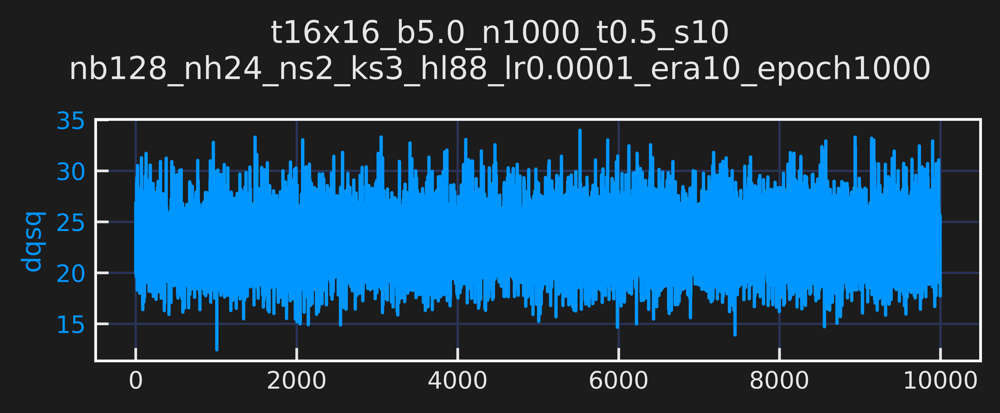

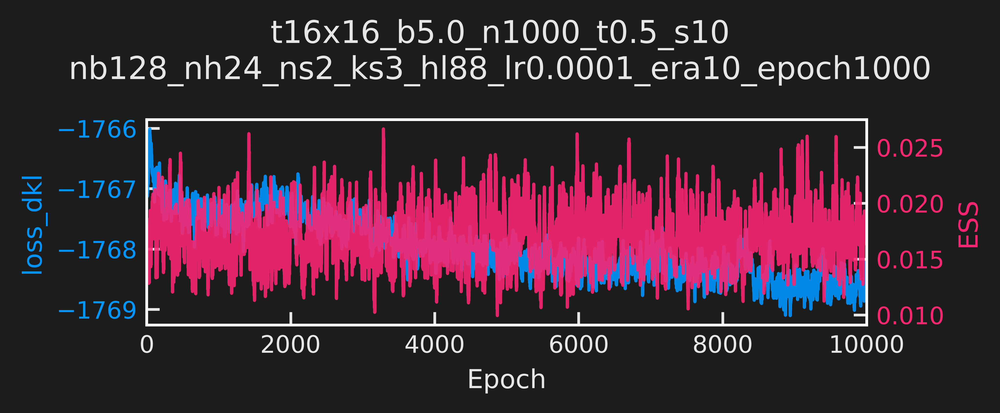

─────────────────────────────── ERA=0, last took: 0 min 0 sec ───────────────────────────────

[23:49:32]  (now) epoch: 499 dt=0.133 ess=0.017 loss_dkl=-1767.209 logp=1122.356             
            logq=-644.852 dqsq=23.922 plaq=0.877

            (avg) epoch: 499 dt=0.133 ess=0.019 loss_dkl=-1767.272 logp=1123.081             
            logq=-644.191 dqsq=23.243 plaq=0.877

[23:50:40]  (now) epoch: 999 dt=0.131 ess=0.018 loss_dkl=-1766.513 logp=1122.524             
            logq=-643.989 dqsq=24.875 plaq=0.877

            (avg) epoch: 999 dt=0.132 ess=0.017 loss_dkl=-1767.516 logp=1122.299             
            logq=-645.216 dqsq=23.631 plaq=0.877

[23:50:41]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-
            234824/checkpoints/ckpt-era0-epoch999.tar

───────────────────────────── ERA=1, last took: 2 min 16.43 sec ─────────────────────────────

[23:51:47]  (now) epoch: 499 dt=0.130 ess=0.008 loss_dkl=-1767.491 logp=1123.376             
            logq=-644.115 dqsq=25.977 plaq=0.878

            (avg) epoch: 499 dt=0.131 ess=0.014 loss_dkl=-1767.404 logp=1122.756             
            logq=-644.648 dqsq=23.712 plaq=0.877

[23:52:54]  (now) epoch: 999 dt=0.130 ess=0.033 loss_dkl=-1767.119 logp=1121.102             
            logq=-646.016 dqsq=20.094 plaq=0.876

            (avg) epoch: 999 dt=0.131 ess=0.015 loss_dkl=-1767.406 logp=1122.641             
            logq=-644.765 dqsq=23.627 plaq=0.877

[23:52:55]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-
            234824/checkpoints/ckpt-era1-epoch999.tar

───────────────────────────── ERA=2, last took: 2 min 14.36 sec ─────────────────────────────

[23:54:02]  (now) epoch: 499 dt=0.131 ess=0.009 loss_dkl=-1767.834 logp=1124.880             
            logq=-642.954 dqsq=19.688 plaq=0.879

            (avg) epoch: 499 dt=0.131 ess=0.018 loss_dkl=-1767.506 logp=1123.178             
            logq=-644.328 dqsq=22.711 plaq=0.877

[23:55:09]  (now) epoch: 999 dt=0.131 ess=0.016 loss_dkl=-1766.806 logp=1123.037             
            logq=-643.769 dqsq=18.906 plaq=0.877

            (avg) epoch: 999 dt=0.131 ess=0.015 loss_dkl=-1767.727 logp=1123.623             
            logq=-644.103 dqsq=23.349 plaq=0.878

[23:55:10]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-
            234824/checkpoints/ckpt-era2-epoch999.tar

───────────────────────────── ERA=3, last took: 2 min 14.76 sec ─────────────────────────────

[23:56:17]  (now) epoch: 499 dt=0.131 ess=0.020 loss_dkl=-1767.955 logp=1123.672             
            logq=-644.283 dqsq=20.500 plaq=0.878

            (avg) epoch: 499 dt=0.131 ess=0.017 loss_dkl=-1767.907 logp=1122.984             
            logq=-644.923 dqsq=24.584 plaq=0.877

[23:57:24]  (now) epoch: 999 dt=0.132 ess=0.025 loss_dkl=-1767.633 logp=1122.848             
            logq=-644.785 dqsq=23.562 plaq=0.877

            (avg) epoch: 999 dt=0.131 ess=0.017 loss_dkl=-1768.048 logp=1123.563             
            logq=-644.485 dqsq=21.777 plaq=0.878

[23:57:26]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-
            234824/checkpoints/ckpt-era3-epoch999.tar

───────────────────────────── ERA=4, last took: 2 min 14.94 sec ─────────────────────────────

[23:58:32]  (now) epoch: 499 dt=0.131 ess=0.018 loss_dkl=-1767.897 logp=1123.093             
            logq=-644.804 dqsq=26.875 plaq=0.877

            (avg) epoch: 499 dt=0.131 ess=0.015 loss_dkl=-1768.028 logp=1123.742             
            logq=-644.285 dqsq=23.866 plaq=0.878

[23:59:40]  (now) epoch: 999 dt=0.131 ess=0.009 loss_dkl=-1767.350 logp=1123.038             
            logq=-644.312 dqsq=24.172 plaq=0.877

            (avg) epoch: 999 dt=0.131 ess=0.017 loss_dkl=-1768.161 logp=1123.720             
            logq=-644.441 dqsq=22.163 plaq=0.878

[23:59:41]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-
            234824/checkpoints/ckpt-era4-epoch999.tar

───────────────────────────── ERA=5, last took: 2 min 15.03 sec ─────────────────────────────

[00:00:48]  (now) epoch: 499 dt=0.131 ess=0.009 loss_dkl=-1767.268 logp=1119.863             
            logq=-647.405 dqsq=18.844 plaq=0.875

            (avg) epoch: 499 dt=0.131 ess=0.013 loss_dkl=-1768.218 logp=1122.711             
            logq=-645.507 dqsq=21.999 plaq=0.877

[00:01:55]  (now) epoch: 999 dt=0.131 ess=0.008 loss_dkl=-1767.557 logp=1122.580             
            logq=-644.977 dqsq=25.758 plaq=0.877

            (avg) epoch: 999 dt=0.131 ess=0.021 loss_dkl=-1768.501 logp=1123.103             
            logq=-645.397 dqsq=23.209 plaq=0.877

[00:01:56]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-
            234824/checkpoints/ckpt-era5-epoch999.tar

───────────────────────────── ERA=6, last took: 2 min 15.14 sec ─────────────────────────────

[00:03:03]  (now) epoch: 499 dt=0.131 ess=0.012 loss_dkl=-1768.795 logp=1123.969             
            logq=-644.827 dqsq=21.352 plaq=0.878

            (avg) epoch: 499 dt=0.131 ess=0.019 loss_dkl=-1768.379 logp=1123.575             
            logq=-644.804 dqsq=22.425 plaq=0.878

[00:04:11]  (now) epoch: 999 dt=0.131 ess=0.014 loss_dkl=-1767.238 logp=1122.798             
            logq=-644.440 dqsq=22.219 plaq=0.877

            (avg) epoch: 999 dt=0.131 ess=0.021 loss_dkl=-1768.124 logp=1123.878             
            logq=-644.246 dqsq=22.852 plaq=0.878

[00:04:12]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-
            234824/checkpoints/ckpt-era6-epoch999.tar

───────────────────────────── ERA=7, last took: 2 min 15.33 sec ─────────────────────────────

[00:05:19]  (now) epoch: 499 dt=0.131 ess=0.009 loss_dkl=-1768.557 logp=1124.226             
            logq=-644.331 dqsq=24.734 plaq=0.878

            (avg) epoch: 499 dt=0.131 ess=0.016 loss_dkl=-1768.353 logp=1124.027             
            logq=-644.326 dqsq=23.347 plaq=0.878

[00:06:27]  (now) epoch: 999 dt=0.132 ess=0.025 loss_dkl=-1768.178 logp=1122.737             
            logq=-645.442 dqsq=25.766 plaq=0.877

            (avg) epoch: 999 dt=0.131 ess=0.017 loss_dkl=-1768.525 logp=1123.751             
            logq=-644.773 dqsq=22.706 plaq=0.878

[00:06:28]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-
            234824/checkpoints/ckpt-era7-epoch999.tar

───────────────────────────── ERA=8, last took: 2 min 15.47 sec ─────────────────────────────

[00:07:35]  (now) epoch: 499 dt=0.131 ess=0.008 loss_dkl=-1768.420 logp=1123.670             
            logq=-644.750 dqsq=28.922 plaq=0.878

            (avg) epoch: 499 dt=0.131 ess=0.018 loss_dkl=-1768.604 logp=1123.784             
            logq=-644.820 dqsq=23.292 plaq=0.878

[00:08:44]  (now) epoch: 999 dt=0.134 ess=0.009 loss_dkl=-1768.372 logp=1123.214             
            logq=-645.158 dqsq=24.648 plaq=0.878

            (avg) epoch: 999 dt=0.134 ess=0.015 loss_dkl=-1768.479 logp=1124.342             
            logq=-644.137 dqsq=23.829 plaq=0.878

[00:08:45]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-
            234824/checkpoints/ckpt-era8-epoch999.tar

───────────────────────────── ERA=9, last took: 2 min 16.35 sec ─────────────────────────────

[00:09:54]  (now) epoch: 499 dt=0.134 ess=0.011 loss_dkl=-1769.213 logp=1125.611             
            logq=-643.602 dqsq=19.359 plaq=0.879

            (avg) epoch: 499 dt=0.134 ess=0.017 loss_dkl=-1768.620 logp=1124.093             
            logq=-644.527 dqsq=22.130 plaq=0.878

[00:11:04]  (now) epoch: 999 dt=0.134 ess=0.025 loss_dkl=-1769.145 logp=1125.661             
            logq=-643.484 dqsq=18.383 plaq=0.879

            (avg) epoch: 999 dt=0.134 ess=0.019 loss_dkl=-1768.421 logp=1123.502             
            logq=-644.919 dqsq=22.542 plaq=0.878

[00:11:05]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-
            234824/checkpoints/ckpt-era9-epoch999.tar

[00:11:06]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-
            234824/checkpoints/ckpt-era10-epoch1001.tar

[00:11:07]  Saving live plots to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-
            234824/plots

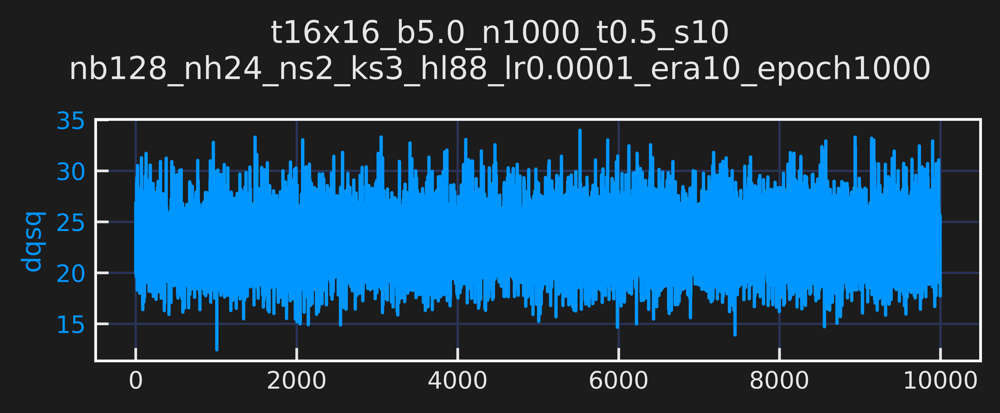

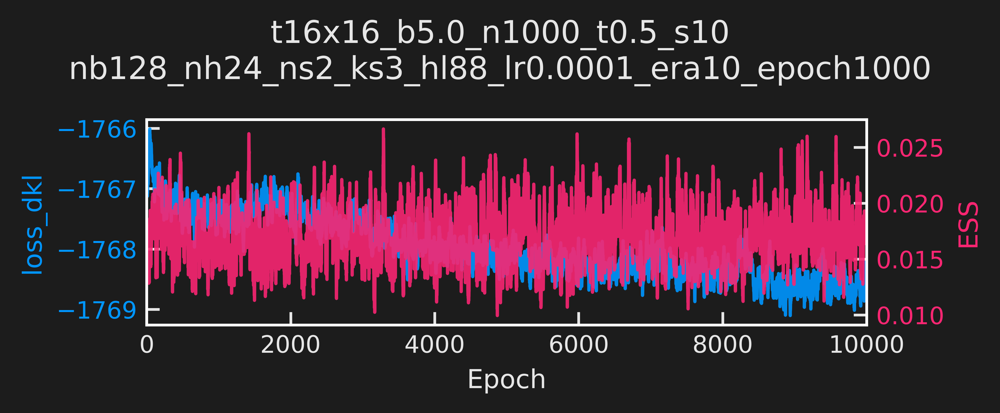

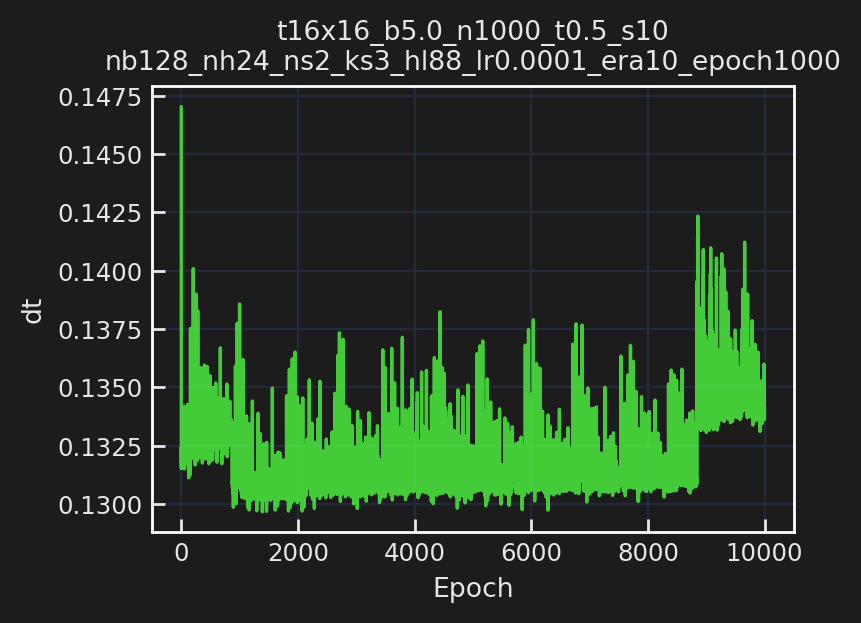

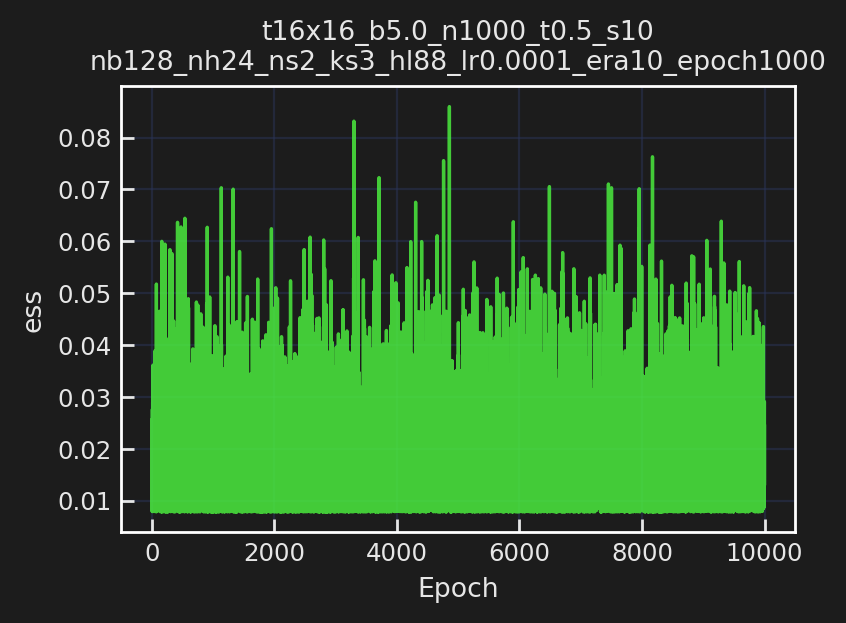

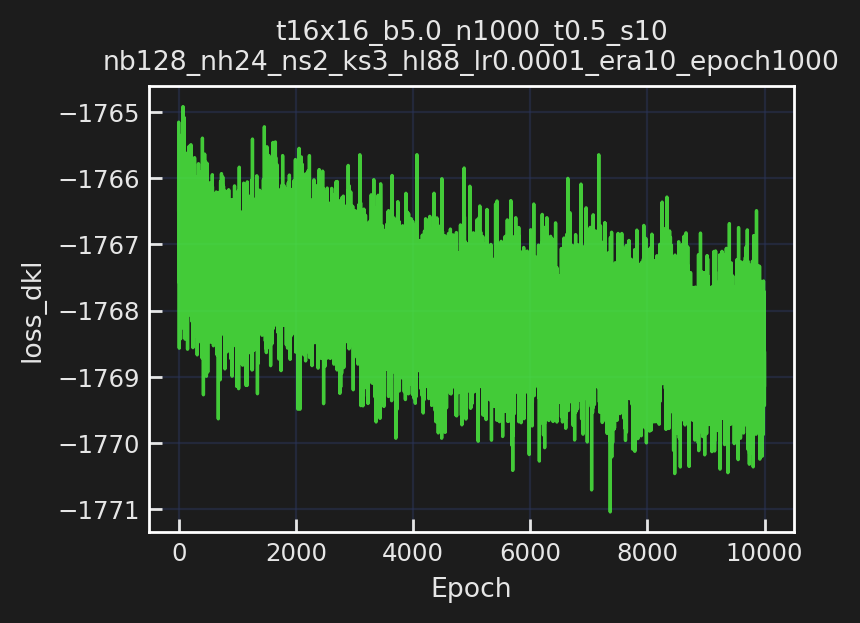

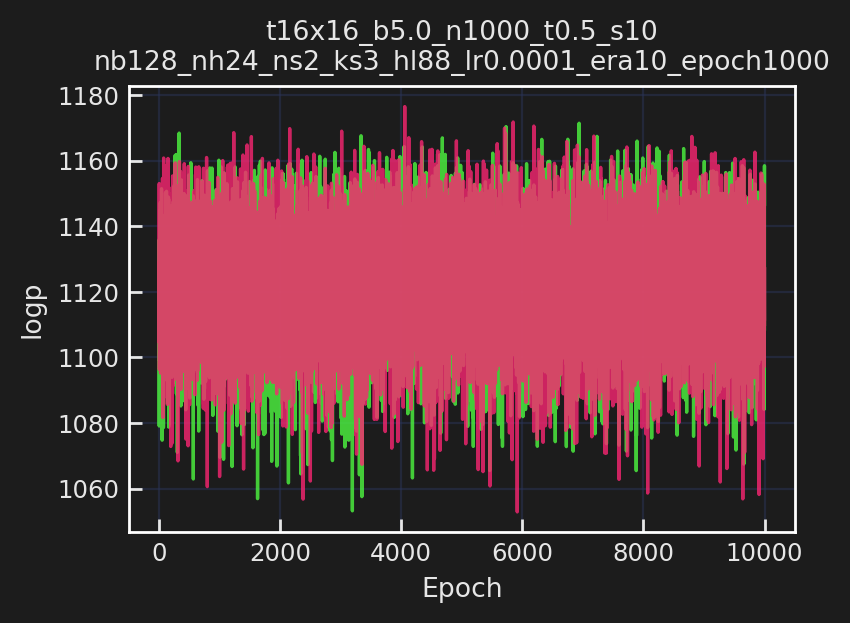

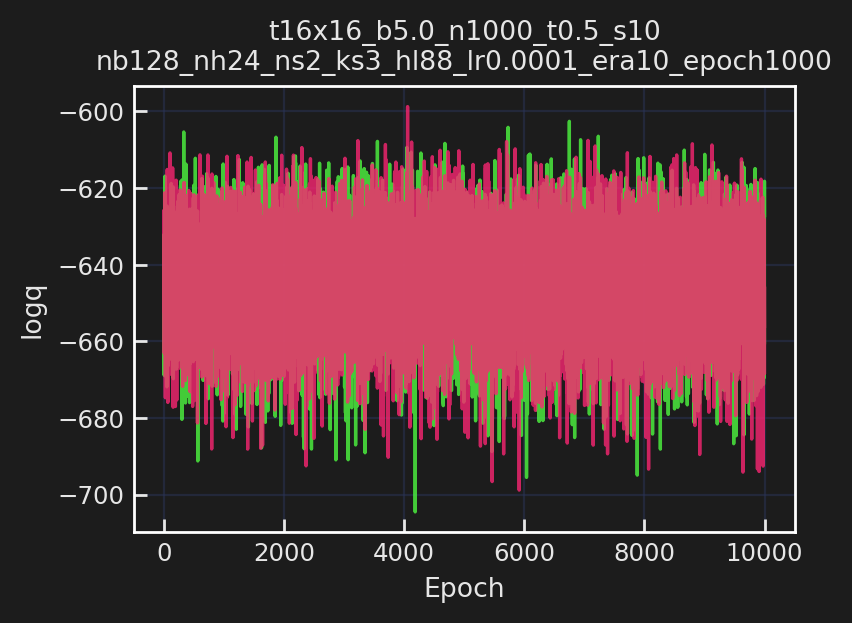

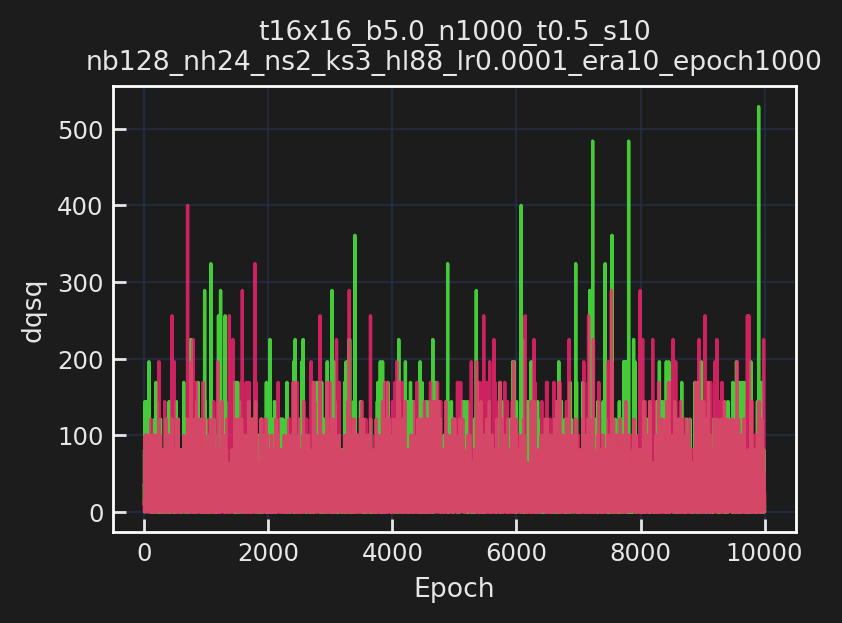

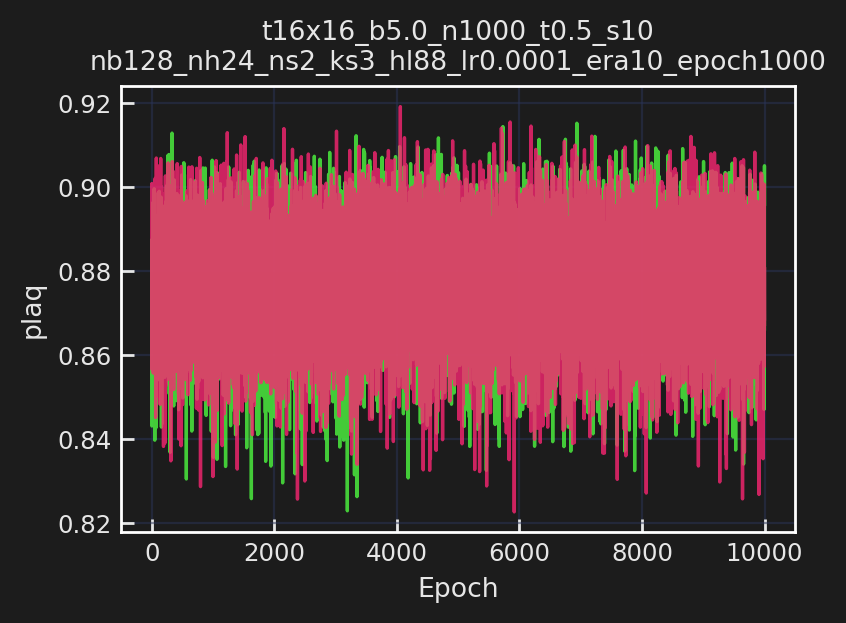

[00:11:11]  Saving train_history to ../../logs/t16x16_b5.0_n1000_t0.5_s10/nb128_nh24_ns2_ks3_
            hl88_lr0.0001_era10_epoch1000/training/2021-06-21-234824/train_history.z.

KeyError: 'dirs'

In [26]:
layers = train_outputs8['model'].layers #['layers']
layers.train()
train_outputs16 = transfer(L=16, param_init=param8,
                          config_init=train_config8,
                          layers_init=layers, 
                          new_lr=0.0001, run_hmc=True)

# ----------------------------------------------------------------
# Run inference on transferred model and evaluate / plot metrics
# ----------------------------------------------------------------
import fthmc.utils.qed_helpers as qed
from fthmc.utils.plot_helpers import plot_history
from fthmc.utils.samplers import make_mcmc_ensemble

sns.set_context('paper')
action_fn16 = qed.BatchAction(param8.beta)
dirs16 = train_outputs16['dirs']
logdir16 = dirs16['logdir']

inf_dir16 = os.path.join(logdir16, 'inference')
inf_pdir16 = os.path.join(inf_dir16, 'plots')
history16 = make_mcmc_ensemble(model=train_outputs16['model'],
                               action_fn=action_fn16,
                               batch_size=train_config16.batch_size,
                               num_samples=1000)
plot_history(history=history16,
             param=16, config=train_config16, skip=['epoch', 'x'],
             num_chains=4, therm_frac=0.0, xlabel='MC Step', outdir=inf_pdir16)

In [ ]:
model16.layers

In [27]:
param16

Param:
----------------
beta=5.0
L=16
tau=0.5
nstep=10
ntraj=1000
nrun=1
nprint=100
seed=1331
randinit=False
nth_interop=2
nth=2
lat=[16, 16]
nd=2
shape=[2, 16, 16]
volume=256
dt=0.05

In [ ]:
from fthmc.ft_hmc import ft_run
fields, metrics = ft_run(param16, model16.layers)

In [29]:
%debug

> /lus/grand/projects/DLHMC/conda/pytorch/2021-05-12/lib/python3.8/site-packages/numpy/core/arrayprint.py(703)_extendLine()
    701 
    702     if needs_wrap:
--> 703         s += line.rstrip() + "\n"
    704         line = next_line_prefix
    705     line += word

ipdb> up
> /lus/grand/projects/DLHMC/conda/pytorch/2021-05-12/lib/python3.8/site-packages/numpy/core/arrayprint.py(715)_extendLine_pretty()
    713     words = word.splitlines()
    714     if len(words) == 1 or legacy == '1.13':
--> 715         return _extendLine(s, line, word, line_width, next_line_prefix, legacy)
    716 
    717     max_word_length = max(len(word) for word in words)

ipdb> up
> /lus/grand/projects/DLHMC/conda/pytorch/2021-05-12/lib/python3.8/site-packages/numpy/core/arrayprint.py(802)recurser()
    800             for i in range(trailing_items, 1, -1):
    801                 word = recurser(index + (-i,), next_hanging_indent, next_width)
--> 802                 s, line = _extendLine_pretty(
    803   

# OLD

In [3]:
%matplotlib inline

In [ ]:
import matplotlib as mpl

from fthmc.train import train
from fthmc.utils.param import Param
from fthmc.config import TrainConfig, PI
from fthmc.utils.distributions import MultivariateUniform
from fthmc.utils.layers import make_u1_equiv_layers, set_weights
from fthmc.utils.plot_helpers import save_live_plots

import fthmc.utils.qed_helpers as qed

import datetime

from fthmc.config import LOGS_DIR

mpl.rcParams['text.usetex'] = False
plt.style.use('/Users/saforem2/.matplotlib/stylelib/molokai.mplstyle')

param = {
    'L': 4,
    'tau': 0.5,
    'nrun': 2,
    'beta': 4.,
    'nstep': 5,
    'ntraj': 1000,
    'nprint': 100,
    'seed': 1331,
}

train_config = TrainConfig(**{
    'n_era': 10,
    'n_epoch': 50,
    'n_layers': 24,
    'n_s_nets': 2,
    'hidden_sizes': [8, 8],
    'kernel_size': 3,
    'batch_size': 64,
    'print_freq': 20,
    'plot_freq': 20,
})

param = Param(**param)
logger.log(repr(param))
logger.log(repr(train_config))

#logdir = io.make_experiment_dirs(param, train_config)

## Specify directories for saving model, etc

In [ ]:
from fthmc.hmc import run_hmc

#hmc_mdir = io.tstamp_dir(os.path.join(logdir, 'hmc'))
#hmc_mdir = io.tstamp_dir(os.path.join(dirs, 'hmc'))

hmc_fields, hmc_history = run_hmc(param,
                                  keep_fields=True,
                                  save_history=True)

## Define `TrainConfig` and build model as
```python
model = {
    'prior': MultivariateUniform(...),
    'model': make_u1_equiv_layers(...),
}
```

### Train `model_init`:

In [ ]:
train_config.n_epoch = 100

In [ ]:
from fthmc.train import train

%matplotlib inline
plt.style.use('default')
plt.style.use('/Users/saforem2/.matplotlib/stylelib/molokai.mplstyle')
sns.set_context('paper', font_scale=0.6)

train_outputs = train(param,
                      train_config,
                      pre_model=None,
                      figsize=(5, 2))

pre_flow_plots = train_outputs['plots']
pre_flow_history = train_outputs['history']
flow_act = train_outputs['action']
pre_flow_model = train_outputs['model']
pre_flow_optimizer = train_outputs['optimizer']

## Run inference on trained model and plot history

In [ ]:
import fthmc.utils.qed_helpers as qed
from fthmc.utils.plot_helpers import plot_history
from fthmc.utils.samplers import make_mcmc_ensemble

action_fn = qed.BatchAction(param.beta)
dirs = train_outputs['dirs']
logdir = dirs['logdir']

inf_dir = os.path.join(logdir, 'inference')
inf_pdir = os.path.join(inf_dir, 'plots')
history = make_mcmc_ensemble(model=train_outputs['model'], action_fn=action_fn,
                             batch_size=train_config.batch_size, num_samples=1000)
plot_history(history=history,
             param=param, config=train_config, skip=['epoch', 'x'],
             num_chains=4, therm_frac=0.0, xlabel='MC Step', outdir=inf_pdir)

### Transfer to new lattice

In [ ]:
from dataclasses import asdict
from fthmc.train import train, transfer_to_new_lattice
%matplotlib inline

plt.style.use('default')
plt.style.use('/Users/saforem2/.matplotlib/stylelib/molokai.mplstyle')
sns.set_context('paper', font_scale=0.6)

layers = train_outputs['model']['layers']


xfr = transfer_to_new_lattice(L=6,
                              layers=layers,
                              param_init=param)
param6 = xfr['param']
model6 = xfr['model']

cfg_dict = asdict(train_config)
cfg_dict['base_lr'] = 0.0005
train_config6 = TrainConfig(**cfg_dict)

train_outputs6 = train(param6,
                       train_config6,
                       model=model6,
                       pre_model=None,
                       figsize=(5, 2))

#pre_flow_plots = train_outputs['plots']
#pre_flow_history = train_outputs['history']
#flow_act = train_outputs['action']
#pre_flow_model = train_outputs['model']
#pre_flow_optimizer = train_outputs['optimizer']

In [ ]:
txfrtxfr

In [ ]:
from fthmc.utils.samplers import make_mcmc_ensemble
import fthmc.utils.qed_helpers as qed

tstamp = io.get_timestamp('%Y-%m-%d-%H%M%S')

history = make_mcmc_ensemble(model=train_outputs['model'],
                             action_fn=train_outputs['action'],
                             batch_size=train_config.batch_size,
                             num_samples=1000)

pdir = os.path.join(PLOTS_DIR, 'inference', 'pre_flow_model', TSTAMP)
if os.path.isdir(pdir):
    pdir = os.path.join(PLOTS_DIR, 'inference', 'pre_flow_model', tstamp)
    
mdir = os.path.join(PLOTS_DIR,' inference', 'pre_flow_model', TSTAMP)
if os.path.isdir(mdir):
    mdir = os.path.join(METRICS_DIR, 'inference', 'pre_flow_model', TSTAMP)
    
io.check_else_make_dir(pdir)
io.check_else_make_dir(mdir)

plot_history(history=history,
             param=param, skip=['epoch', 'x'],
             num_chains=2, therm_frac=0.0,#, thin=10,
             xlabel='MC Step', outdir=pdir, alpha=0.5)

mfile = os.path.join(mdir, 'inference_metrics.z')

io.save_history(history, mfile, name='inference_metrics')

logger.log(f'Accept rate: {np.mean(history["accepted"])}')

In [ ]:
from fthmc.config import grab

#for key, val in history.items():
#    #x = grab(val)
#    if key == 'x':
#        continue
#        
#    logger.log(f'({key}) shape: {val.shape}, mean: {np.mean(val)}')
np.mean(history['accepted'])
#np.mean(history['accepted'])

In [ ]:
from fthmc.utils.samplers import generate_ensemble

outputs = generate_ensemble(pre_flow_model, flow_act, logger=logger)

history = outputs['history']
#u1_ens = outputs['ensemble']

pre_flow = pre_flow_model['layers']

In [ ]:
import matplotlib.pyplot as plt

from fthmc.utils.plot_helpers import plot_history

tstamp = io.get_timestamp('%Y-%m-%d-%H%M%S')

pdir = os.path.join(PLOTS_DIR, 'training', 'pre_flow_model', TSTAMP)
if os.path.isdir(pdir):
    pdir = os.path.join(PLOTS_DIR, 'training', 'pre_flow_model', tstamp)
    
mdir = os.path.join(METRICS_DIR, 'training', 'pre_flow_model', TSTAMP)
if os.path.isdir(mdir):
    mdir = os.path.join(METRICS_DIR, 'training', 'pre_flow_model', tstamp)
    
io.check_else_make_dir(pdir)
io.check_else_make_dir(mdir)

plot_history(history=train_outputs['history'],
             param=param, skip=['epoch'],
             num_chains=2, therm_frac=0.0, thin=10,
             xlabel='Epoch', outdir=outdir, alpha=0.5)

mfile = os.path.join(mdir, 'train_metrics.z')
io.save_history(train_outputs['history'], mfile, name='train_metrics')

In [ ]:
train_force = False
flow_model = None

if train_force:
    flow_model, flow_act = flow_train(param, with_force=True, pre_model=pre_flow_model)
else:
    flow_model = pre_flow_model
    
u1_ens = generate_ensemble(flow_model, flow_act, logger=logger)
flow = flow_model['layers']
flow.eval()

# Try increasing $\beta$ on `4x4` lattice

In [ ]:
from dataclasses import asdict

pdict = asdict(param)
logger.log(pdict)

In [ ]:
type(pre_flow_model['layers'])

In [ ]:
from math import pi as PI
from fthmc.utils.distributions import MultivariateUniform
from fthmc.utils.layers import make_net_from_layers, get_nets
from fthmc.utils.samplers import make_mcmc_ensemble
import fthmc.utils.qed_helpers as qed
from fthmc.utils.plot_helpers import plot_history

param4 = Param(**{
    'L': 4,
    'tau': 1.,
    'nrun': 5,
    'beta': 4.5,
    'nstep': 10,
    'ntraj': 256,
    'nprint': 100,
    'seed': 1331,
})

logger.log(repr(param4))

flow4 = make_net_from_layers(lattice_shape=tuple(param.lat),
                              nets=get_nets(pre_flow_model['layers']))


train_config4 = TrainConfig(**{
    'n_era': 10,
    'n_epoch': 100,
    'n_layers': 24,
    'n_s_nets': 2,
    'hidden_sizes': [8, 8],
    'kernel_size': 3,
    'batch_size': 256,
    'print_freq': 100,
    'plot_freq': 100,
})

prior4 = MultivariateUniform(torch.zeros((2, *param4.lat)),
                              2. * PI * torch.ones(tuple(param4.lat)))

model4 = {'layers': flow4, 'prior': prior4}

DAYSTR4 = io.get_timestamp('%Y-%m-%d')
NOW4 = io.get_timestamp('%Y-%m-%d-%H%M%S')
TSTAMP4 = io.get_timestamp('%Y-%m-%d-%H%M')

PARAM_DIR4 = os.path.join(LOGS_DIR,
                           param4.uniquestr())
METRICS_DIR4 = os.path.join(PARAM_DIR4, 'metrics')
MODEL_DIR4 = os.path.join(PARAM_DIR4, 'models')
PLOTS_DIR4 = os.path.join(PARAM_DIR4, 'plots')
#OUTDIR = os.path.join(METRICS_DIR)

io.check_else_make_dir(PARAM_DIR4)
io.check_else_make_dir(MODEL_DIR4)
io.check_else_make_dir(METRICS_DIR4)
io.check_else_make_dir(PLOTS_DIR4)

train_outputs4 = train(param4,
                        train_config4,
                        model=model4,
                        pre_model=None,
                        logger=logger,
                        figsize=(7.5, 2))

pre_flow_plots4 = train_outputs4['plots']
pre_flow_history4 = train_outputs4['history']
flow_act4 = train_outputs4['action']

pre_flow_model4 = train_outputs4['model']
pre_flow_optimizer4 = train_outputs4['optimizer_kdl']

# Save model, optimizer, and history to checkpoint
step4 = train_config4.n_era * train_config4.n_epoch

outfile4 = os.path.join(MODEL_DIR4, 'pre_flow_model', TSTAMP4, 'pre_flow_model.tar')
io.save_checkpoint(
    epoch=step4,
    outfile=outfile4,
    model=pre_flow_model4['layers'],
    optimizer=pre_flow_optimizer4,
    history=train_outputs4['history'],
    overwrite=True,
)

plots4 = train_outputs4['plots']
outdir4 = os.path.join(PLOTS_DIR4, 'training', 'pre_flow_model', TSTAMP4)

save_live_plots(plots4, outdir4)


tstamp4 = io.get_timestamp('%Y-%m-%d-%H%M%S')

pdir4 = os.path.join(PLOTS_DIR4, 'training', 'pre_flow_model', TSTAMP4)
if os.path.isdir(pdir4):
    pdir4 = os.path.join(PLOTS_DIR4, 'training', 'pre_flow_model', tstamp4)
    
mdir4 = os.path.join(METRICS_DIR4, 'training', 'pre_flow_model', TSTAMP4)
if os.path.isdir(mdir4):
    mdir4 = os.path.join(METRICS_DIR4, 'training', 'pre_flow_model', tstamp4)
    
io.check_else_make_dir(pdir4)
io.check_else_make_dir(mdir4)

plot_history(history=train_outputs4['history'],
             param=param, skip=['epoch'],
             num_chains=2, therm_frac=0.0, thin=10,
             xlabel='Epoch', outdir=pdir4, alpha=0.5)

mfile4 = os.path.join(mdir4, 'train_metrics.z')
io.save_history(train_outputs4['history'], mfile4, name='train_metrics')


history4 = make_mcmc_ensemble(model=train_outputs4['model'],
                               action_fn=train_outputs4['action'],
                               batch_size=train_config4.batch_size,
                               num_samples=10000)

pdir4 = os.path.join(PLOTS_DIR4, 'inference', 'pre_flow_model', TSTAMP4)
if os.path.isdir(pdir):
    pdir4 = os.path.join(PLOTS_DIR4, 'inference', 'pre_flow_model', tstamp4)
    
mdir4 = os.path.join(PLOTS_DIR4,'inference', 'pre_flow_model', TSTAMP4)
if os.path.isdir(mdir):
    mdir4 = os.path.join(METRICS_DIR4, 'inference', 'pre_flow_model', TSTAMP4)
    
io.check_else_make_dir(pdir4)
io.check_else_make_dir(mdir4)

plot_history(history=history4,
             param=param4,
             outdir=pdir4,
             skip=['epoch', 'x'],
             num_chains=2,
             therm_frac=0.0,#, thin=10,
             xlabel='MC Step',
             alpha=0.5)

mfile4 = os.path.join(mdir4, 'inference_metrics.z')

io.save_history(history4, mfile4, name='inference_metrics')

logger.log(f'Accept rate: {np.mean(history["accepted"])}')

## Extract layers from `pre_flow_model` and transfer learning to larger lattice

## Transfer up to $8\times8$ lattice

In [ ]:
logger.log(repr(param))
logger.log(train_config)

In [ ]:
from math import pi as PI
from fthmc.utils.distributions import MultivariateUniform
from fthmc.utils.layers import make_net_from_layers, get_nets
from fthmc.utils.samplers import make_mcmc_ensemble
import fthmc.utils.qed_helpers as qed
from fthmc.utils.plot_helpers import plot_history

param8 = Param(**{
    'L': 8,
    'tau': 1.,
    'nrun': 5,
    'beta': 4.5,
    'nstep': 10,
    'ntraj': 256,
    'nprint': 100,
    'seed': 1331,
})

logger.log(repr(param8))

flow8 = make_net_from_layers(lattice_shape=tuple(param8.lat),
                             nets=get_nets(pre_flow_model['layers']))


train_config8 = TrainConfig(**{
    'n_era': 10,
    'n_epoch': 100,
    'n_layers': 24,
    'n_s_nets': 2,
    'hidden_sizes': [8, 8],
    'kernel_size': 3,
    'batch_size': 256,
    'print_freq': 100,
    'plot_freq': 100,
})
logger.log(repr(param8))

prior8 = MultivariateUniform(torch.zeros((2, *param8.lat)),
                              2. * PI * torch.ones(tuple(param8.lat)))

model8 = {'layers': flow8, 'prior': prior8}

DAYSTR8 = io.get_timestamp('%Y-%m-%d')
NOW8 = io.get_timestamp('%Y-%m-%d-%H%M%S')
TSTAMP8 = io.get_timestamp('%Y-%m-%d-%H%M')

PARAM_DIR8 = os.path.join(LOGS_DIR,
                           param8.uniquestr())
METRICS_DIR8 = os.path.join(PARAM_DIR8, 'metrics')
MODEL_DIR8 = os.path.join(PARAM_DIR8, 'models')
PLOTS_DIR8 = os.path.join(PARAM_DIR8, 'plots')
#OUTDIR = os.path.join(METRICS_DIR)

io.check_else_make_dir(PARAM_DIR8)
io.check_else_make_dir(MODEL_DIR8)
io.check_else_make_dir(METRICS_DIR8)
io.check_else_make_dir(PLOTS_DIR8)

train_outputs8 = train(param8,
                        train_config8,
                        model=model8,
                        pre_model=None,
                        logger=logger,
                        figsize=(7.5, 2))

pre_flow_plots8 = train_outputs8['plots']
pre_flow_history8 = train_outputs8['history']
flow_act8 = train_outputs8['action']

pre_flow_model8 = train_outputs8['model']
pre_flow_optimizer8 = train_outputs8['optimizer_kdl']

# Save model, optimizer, and history to checkpoint
step8 = train_config8.n_era * train_config8.n_epoch

outfile8 = os.path.join(MODEL_DIR8, 'pre_flow_model', TSTAMP8, 'pre_flow_model.tar')
io.save_checkpoint(
    epoch=step8,
    outfile=outfile8,
    model=pre_flow_model8['layers'],
    optimizer=pre_flow_optimizer8,
    history=train_outputs8['history'],
    overwrite=True,
)

plots8 = train_outputs8['plots']
outdir8 = os.path.join(PLOTS_DIR8, 'training', 'pre_flow_model', TSTAMP8)

save_live_plots(plots8, outdir8)


tstamp8 = io.get_timestamp('%Y-%m-%d-%H%M%S')

pdir8 = os.path.join(PLOTS_DIR8, 'training', 'pre_flow_model', TSTAMP8)
if os.path.isdir(pdir8):
    pdir8 = os.path.join(PLOTS_DIR8, 'training', 'pre_flow_model', tstamp8)
    
mdir8 = os.path.join(METRICS_DIR8, 'training', 'pre_flow_model', TSTAMP8)
if os.path.isdir(mdir8):
    mdir8 = os.path.join(METRICS_DIR8, 'training', 'pre_flow_model', tstamp8)
    
io.check_else_make_dir(pdir8)
io.check_else_make_dir(mdir8)

plot_history(history=train_outputs8['history'],
             param=param, skip=['epoch'],
             num_chains=2, therm_frac=0.0, thin=10,
             xlabel='Epoch', outdir=pdir8, alpha=0.5)

mfile8 = os.path.join(mdir8, 'train_metrics.z')
io.save_history(train_outputs8['history'], mfile8, name='train_metrics')


history8 = make_mcmc_ensemble(model=train_outputs8['model'],
                               action_fn=train_outputs8['action'],
                               batch_size=train_config8.batch_size,
                               num_samples=10000)

pdir8 = os.path.join(PLOTS_DIR8, 'inference', 'pre_flow_model', TSTAMP8)
if os.path.isdir(pdir):
    pdir8 = os.path.join(PLOTS_DIR8, 'inference', 'pre_flow_model', tstamp8)
    
mdir8 = os.path.join(PLOTS_DIR8,'inference', 'pre_flow_model', TSTAMP8)
if os.path.isdir(mdir):
    mdir8 = os.path.join(METRICS_DIR8, 'inference', 'pre_flow_model', TSTAMP8)
    
io.check_else_make_dir(pdir8)
io.check_else_make_dir(mdir8)

plot_history(history=history8,
             param=param8,
             outdir=pdir8,
             skip=['epoch', 'x'],
             num_chains=2,
             therm_frac=0.0,#, thin=10,
             xlabel='MC Step',
             alpha=0.5)

mfile8 = os.path.join(mdir8, 'inference_metrics.z')

io.save_history(history8, mfile8, name='inference_metrics')

logger.log(f'Accept rate: {np.mean(history["accepted"])}')

# Try increasing $\beta$, using previously trained `8x8` network

In [ ]:
param8_1 = Param(
    beta=3.,
    L=8,
    tau=0.5,
    nstep=10,
    ntraj=256,
    nrun=5,
    nprint=100,
    seed=1331,
    randinit=False,
    nth=2,
    nth_interop=2,
)

logger.log(repr(param8_1))

flow8_1 = make_net_from_layers(lattice_shape=tuple(param8_1.lat),
                              nets=get_nets(pre_flow_model['layers']))


train_config8_1 = TrainConfig(
    n_era=10,
    n_epoch=100,
    n_layers=24,
    n_s_nets=2,
    hidden_sizes=[8, 8],
    kernel_size=3,
    base_lr=0.001,
    batch_size=64,
    print_freq=10,
    plot_freq=10,
    with_force=False,
)

prior8_1 = MultivariateUniform(torch.zeros((2, *param8_1.lat)),
                              2. * PI * torch.ones(tuple(param8_1.lat)))

model8_1 = {'layers': flow8_1, 'prior': prior8_1}

DAYSTR8_1 = io.get_timestamp('%Y-%m-%d')
NOW8_1 = io.get_timestamp('%Y-%m-%d-%H%M%S')
TSTAMP8_1 = io.get_timestamp('%Y-%m-%d-%H%M')

PARAM_DIR8_1 = os.path.join(LOGS_DIR,
                           param8_1.uniquestr())
METRICS_DIR8_1 = os.path.join(PARAM_DIR8_1, 'metrics')
MODEL_DIR8_1 = os.path.join(PARAM_DIR8_1, 'models')
PLOTS_DIR8_1 = os.path.join(PARAM_DIR8_1, 'plots')
#OUTDIR = os.path.join(METRICS_DIR)

io.check_else_make_dir(PARAM_DIR8_1)
io.check_else_make_dir(MODEL_DIR8_1)
io.check_else_make_dir(METRICS_DIR8_1)
io.check_else_make_dir(PLOTS_DIR8_1)

train_outputs8_1 = train(param8_1,
                        train_config8_1,
                        model=model8_1,
                        pre_model=None,
                        logger=logger,
                        figsize=(7.5, 2))

pre_flow_plots8_1 = train_outputs8_1['plots']
pre_flow_history8_1 = train_outputs8_1['history']
flow_act8_1 = train_outputs8_1['action']

pre_flow_model8_1 = train_outputs8_1['model']
pre_flow_optimizer8_1 = train_outputs8_1['optimizer_kdl']

# Save model, optimizer, and history to checkpoint
step8_1 = train_config8_1.n_era * train_config8_1.n_epoch

outfile8_1 = os.path.join(MODEL_DIR8_1, 'pre_flow_model', TSTAMP8_1, 'pre_flow_model.tar')
io.save_checkpoint(
    epoch=step8_1,
    outfile=outfile8_1,
    model=pre_flow_model8_1['layers'],
    optimizer=pre_flow_optimizer8_1,
    history=train_outputs8_1['history'],
    overwrite=True,
)

plots8_1 = train_outputs8_1['plots']
outdir8_1 = os.path.join(PLOTS_DIR8_1, 'training', 'pre_flow_model', TSTAMP8_1)

save_live_plots(plots8_1, outdir8_1)


tstamp8_1 = io.get_timestamp('%Y-%m-%d-%H%M%S')

pdir8_1 = os.path.join(PLOTS_DIR8_1, 'training', 'pre_flow_model', TSTAMP8_1)
if os.path.isdir(pdir8_1):
    pdir8_1 = os.path.join(PLOTS_DIR8_1, 'training', 'pre_flow_model', tstamp8_1)
    
mdir8_1 = os.path.join(METRICS_DIR8_1, 'training', 'pre_flow_model', TSTAMP8_1)
if os.path.isdir(mdir8_1):
    mdir8_1 = os.path.join(METRICS_DIR8_1, 'training', 'pre_flow_model', tstamp8_1)
    
io.check_else_make_dir(pdir8_1)
io.check_else_make_dir(mdir8_1)

plot_history(history=train_outputs8_1['history'],
             param=param, skip=['epoch'],
             num_chains=2, therm_frac=0.0, thin=10,
             xlabel='Epoch', outdir=pdir8_1, alpha=0.5)

mfile8_1 = os.path.join(mdir8_1, 'train_metrics.z')
io.save_history(train_outputs8_1['history'], mfile8_1, name='train_metrics')


history8_1 = make_mcmc_ensemble(model=train_outputs8_1['model'],
                               action_fn=train_outputs8_1['action'],
                               batch_size=train_config8_1.batch_size,
                               num_samples=10000)

pdir8_1 = os.path.join(PLOTS_DIR8_1, 'inference', 'pre_flow_model', TSTAMP8_1)
if os.path.isdir(pdir):
    pdir8_1 = os.path.join(PLOTS_DIR8_1, 'inference', 'pre_flow_model', tstamp8_1)
    
mdir8_1 = os.path.join(PLOTS_DIR8_1,'inference', 'pre_flow_model', TSTAMP8_1)
if os.path.isdir(mdir):
    mdir8_1 = os.path.join(METRICS_DIR8_1, 'inference', 'pre_flow_model', TSTAMP8_1)
    
io.check_else_make_dir(pdir8_1)
io.check_else_make_dir(mdir8_1)

plot_history(history=history8_1,
             param=param8_1,
             outdir=pdir8_1,
             skip=['epoch', 'x'],
             num_chains=2,
             therm_frac=0.0,#, thin=10,
             xlabel='MC Step',
             alpha=0.5)

mfile8_1 = os.path.join(mdir8_1, 'inference_metrics.z')

io.save_history(history8_1, mfile8_1, name='inference_metrics')

logger.log(f'Accept rate: {np.mean(history["accepted"])}')

# Try increasing $\beta$ again...

In [ ]:
param8_1 = Param(
    beta=3.,
    L=8,
    tau=0.5,
    nstep=10,
    ntraj=256,
    nrun=5,
    nprint=100,
    seed=1331,
    randinit=False,
    nth=2,
    nth_interop=2,
)

logger.log(repr(param8_1))

flow8_1 = make_net_from_layers(lattice_shape=tuple(param8_1.lat),
                              nets=get_nets(pre_flow_model['layers']))


train_config8_1 = TrainConfig(
    n_era=10,
    n_epoch=100,
    n_layers=24,
    n_s_nets=2,
    hidden_sizes=[8, 8],
    kernel_size=3,
    base_lr=0.001,
    batch_size=64,
    print_freq=10,
    plot_freq=10,
    with_force=False,
)

prior8_1 = MultivariateUniform(torch.zeros((2, *param8_1.lat)),
                              2. * PI * torch.ones(tuple(param8_1.lat)))

model8_1 = {'layers': flow8_1, 'prior': prior8_1}

DAYSTR8_1 = io.get_timestamp('%Y-%m-%d')
NOW8_1 = io.get_timestamp('%Y-%m-%d-%H%M%S')
TSTAMP8_1 = io.get_timestamp('%Y-%m-%d-%H%M')

PARAM_DIR8_1 = os.path.join(LOGS_DIR,
                           param8_1.uniquestr())
METRICS_DIR8_1 = os.path.join(PARAM_DIR8_1, 'metrics')
MODEL_DIR8_1 = os.path.join(PARAM_DIR8_1, 'models')
PLOTS_DIR8_1 = os.path.join(PARAM_DIR8_1, 'plots')
#OUTDIR = os.path.join(METRICS_DIR)

io.check_else_make_dir(PARAM_DIR8_1)
io.check_else_make_dir(MODEL_DIR8_1)
io.check_else_make_dir(METRICS_DIR8_1)
io.check_else_make_dir(PLOTS_DIR8_1)

train_outputs8_1 = train(param8_1,
                        train_config8_1,
                        model=model8_1,
                        pre_model=None,
                        logger=logger,
                        figsize=(7.5, 2))

pre_flow_plots8_1 = train_outputs8_1['plots']
pre_flow_history8_1 = train_outputs8_1['history']
flow_act8_1 = train_outputs8_1['action']

pre_flow_model8_1 = train_outputs8_1['model']
pre_flow_optimizer8_1 = train_outputs8_1['optimizer_kdl']

# Save model, optimizer, and history to checkpoint
step8_1 = train_config8_1.n_era * train_config8_1.n_epoch

outfile8_1 = os.path.join(MODEL_DIR8_1, 'pre_flow_model', TSTAMP8_1, 'pre_flow_model.tar')
io.save_checkpoint(
    epoch=step8_1,
    outfile=outfile8_1,
    model=pre_flow_model8_1['layers'],
    optimizer=pre_flow_optimizer8_1,
    history=train_outputs8_1['history'],
    overwrite=True,
)

plots8_1 = train_outputs8_1['plots']
outdir8_1 = os.path.join(PLOTS_DIR8_1, 'training', 'pre_flow_model', TSTAMP8_1)

save_live_plots(plots8_1, outdir8_1)


tstamp8_1 = io.get_timestamp('%Y-%m-%d-%H%M%S')

pdir8_1 = os.path.join(PLOTS_DIR8_1, 'training', 'pre_flow_model', TSTAMP8_1)
if os.path.isdir(pdir8_1):
    pdir8_1 = os.path.join(PLOTS_DIR8_1, 'training', 'pre_flow_model', tstamp8_1)
    
mdir8_1 = os.path.join(METRICS_DIR8_1, 'training', 'pre_flow_model', TSTAMP8_1)
if os.path.isdir(mdir8_1):
    mdir8_1 = os.path.join(METRICS_DIR8_1, 'training', 'pre_flow_model', tstamp8_1)
    
io.check_else_make_dir(pdir8_1)
io.check_else_make_dir(mdir8_1)

plot_history(history=train_outputs8_1['history'],
             param=param, skip=['epoch'],
             num_chains=2, therm_frac=0.0, thin=10,
             xlabel='Epoch', outdir=pdir8_1, alpha=0.5)

mfile8_1 = os.path.join(mdir8_1, 'train_metrics.z')
io.save_history(train_outputs8_1['history'], mfile8_1, name='train_metrics')


history8_1 = make_mcmc_ensemble(model=train_outputs8_1['model'],
                               action_fn=train_outputs8_1['action'],
                               batch_size=train_config8_1.batch_size,
                               num_samples=10000)

pdir8_1 = os.path.join(PLOTS_DIR8_1, 'inference', 'pre_flow_model', TSTAMP8_1)
if os.path.isdir(pdir):
    pdir8_1 = os.path.join(PLOTS_DIR8_1, 'inference', 'pre_flow_model', tstamp8_1)
    
mdir8_1 = os.path.join(PLOTS_DIR8_1,'inference', 'pre_flow_model', TSTAMP8_1)
if os.path.isdir(mdir):
    mdir8_1 = os.path.join(METRICS_DIR8_1, 'inference', 'pre_flow_model', TSTAMP8_1)
    
io.check_else_make_dir(pdir8_1)
io.check_else_make_dir(mdir8_1)

plot_history(history=history8_1,
             param=param8_1,
             outdir=pdir8_1,
             skip=['epoch', 'x'],
             num_chains=2,
             therm_frac=0.0,#, thin=10,
             xlabel='MC Step',
             alpha=0.5)

mfile8_1 = os.path.join(mdir8_1, 'inference_metrics.z')

io.save_history(history8_1, mfile8_1, name='inference_metrics')

logger.log(f'Accept rate: {np.mean(history["accepted"])}')

# Transfer to `12x12` lattice

In [ ]:
from math import pi as PI
from fthmc.utils.distributions import MultivariateUniform
from fthmc.utils.layers import make_net_from_layers, get_nets
from fthmc.utils.samplers import make_mcmc_ensemble
import fthmc.utils.qed_helpers as qed
from fthmc.utils.plot_helpers import plot_history


param12 = {
    'L': 12,
    'tau': 0.5,
    'nrun': 5,
    'beta': 2.,
    'nstep': 10,
    'ntraj': 256,
    'nprint': 50,
    'seed': 1331,
    'randinit': True,
}

param12 = Param(**param12)
logger.log(repr(param12))

flow12 = make_net_from_layers(lattice_shape=tuple(param12.lat),
                              nets=get_nets(pre_flow_model['layers']))

train_config12 = TrainConfig(**{
    'n_era': 10,
    'n_epoch': 100,
    'n_layers': 24,
    'n_s_nets': 2,
    'hidden_sizes': [8, 8],
    'kernel_size': 3,
    'batch_size': 64,
    'print_freq': 10,
    'plot_freq': 10,
})

prior12 = MultivariateUniform(torch.zeros((2, *param12.lat)),
                              2. * PI * torch.ones(tuple(param12.lat)))

model12 = {'layers': flow12, 'prior': prior12}

DAYSTR12 = io.get_timestamp('%Y-%m-%d')
NOW12 = io.get_timestamp('%Y-%m-%d-%H%M%S')
TSTAMP12 = io.get_timestamp('%Y-%m-%d-%H%M')

PARAM_DIR12 = os.path.join(LOGS_DIR,
                           param12.uniquestr())
METRICS_DIR12 = os.path.join(PARAM_DIR12, 'metrics')
MODEL_DIR12 = os.path.join(PARAM_DIR12, 'models')
PLOTS_DIR12 = os.path.join(PARAM_DIR12, 'plots')
#OUTDIR = os.path.join(METRICS_DIR)

io.check_else_make_dir(PARAM_DIR12)
io.check_else_make_dir(MODEL_DIR12)
io.check_else_make_dir(METRICS_DIR12)
io.check_else_make_dir(PLOTS_DIR12)

train_outputs12 = train(param12,
                        train_config12,
                        model=model12,
                        pre_model=None,
                        logger=logger,
                        figsize=(7.5, 2))

pre_flow_plots12 = train_outputs12['plots']
pre_flow_history12 = train_outputs12['history']
flow_act12 = train_outputs12['action']

pre_flow_model12 = train_outputs12['model']
pre_flow_optimizer12 = train_outputs12['optimizer_kdl']

# Save model, optimizer, and history to checkpoint
step12 = train_config12.n_era * train_config12.n_epoch

outfile12 = os.path.join(MODEL_DIR12, 'pre_flow_model', TSTAMP12, 'pre_flow_model.tar')
io.save_checkpoint(
    epoch=step12,
    outfile=outfile12,
    model=pre_flow_model12['layers'],
    optimizer=pre_flow_optimizer12,
    history=train_outputs12['history'],
    overwrite=True,
)

plots12 = train_outputs12['plots']
outdir12 = os.path.join(PLOTS_DIR12, 'training', 'pre_flow_model', TSTAMP12)

save_live_plots(plots12, outdir12)


tstamp12 = io.get_timestamp('%Y-%m-%d-%H%M%S')

pdir12 = os.path.join(PLOTS_DIR12, 'training', 'pre_flow_model', TSTAMP12)
if os.path.isdir(pdir12):
    pdir12 = os.path.join(PLOTS_DIR12, 'training', 'pre_flow_model', tstamp12)
    
mdir12 = os.path.join(METRICS_DIR12, 'training', 'pre_flow_model', TSTAMP12)
if os.path.isdir(mdir12):
    mdir12 = os.path.join(METRICS_DIR12, 'training', 'pre_flow_model', tstamp12)
    
io.check_else_make_dir(pdir12)
io.check_else_make_dir(mdir12)

plot_history(history=train_outputs12['history'],
             param=param, skip=['epoch'],
             num_chains=2, therm_frac=0.0, thin=10,
             xlabel='Epoch', outdir=pdir12, alpha=0.5)

mfile12 = os.path.join(mdir12, 'train_metrics.z')
io.save_history(train_outputs12['history'], mfile12, name='train_metrics')


history12 = make_mcmc_ensemble(model=train_outputs12['model'],
                               action_fn=train_outputs12['action'],
                               batch_size=train_config12.batch_size,
                               num_samples=10000)

pdir12 = os.path.join(PLOTS_DIR12, 'inference', 'pre_flow_model', TSTAMP12)
if os.path.isdir(pdir):
    pdir12 = os.path.join(PLOTS_DIR12, 'inference', 'pre_flow_model', tstamp12)
    
mdir12 = os.path.join(PLOTS_DIR12,'inference', 'pre_flow_model', TSTAMP12)
if os.path.isdir(mdir):
    mdir12 = os.path.join(METRICS_DIR12, 'inference', 'pre_flow_model', TSTAMP12)
    
io.check_else_make_dir(pdir12)
io.check_else_make_dir(mdir12)

plot_history(history=history12,
             param=param12,
             outdir=pdir12,
             skip=['epoch', 'x'],
             num_chains=2,
             therm_frac=0.0,#, thin=10,
             xlabel='MC Step',
             alpha=0.5)

mfile12 = os.path.join(mdir12, 'inference_metrics.z')

io.save_history(history12, mfile12, name='inference_metrics')

logger.log(f'Accept rate: {np.mean(history["accepted"])}')

In [ ]:
from math import pi as PI
from fthmc.utils.distributions import MultivariateUniform
from fthmc.utils.layers import make_net_from_layers, get_nets
from fthmc.utils.samplers import make_mcmc_ensemble
import fthmc.utils.qed_helpers as qed
from fthmc.utils.plot_helpers import plot_history


param16 = {
    'L': 16,
    'tau': 0.5,
    'nrun': 5,
    'beta': 2.,
    'nstep': 10,
    'ntraj': 256,
    'nprint': 50,
    'seed': 1331,
    'randinit': True,
}

param16 = Param(**param16)
logger.log(repr(param16))

flow16 = make_net_from_layers(lattice_shape=tuple(param16.lat),
                              nets=get_nets(pre_flow_model['layers']))

train_config16 = TrainConfig(**{
    'n_era': 10,
    'n_epoch': 100,
    'n_layers': 24,
    'n_s_nets': 2,
    'hidden_sizes': [8, 8],
    'kernel_size': 3,
    'batch_size': 64,
    'print_freq': 10,
    'plot_freq': 10,
})

prior16 = MultivariateUniform(torch.zeros((2, *param16.lat)),
                              2. * PI * torch.ones(tuple(param16.lat)))

model16 = {'layers': flow16, 'prior': prior16}

DAYSTR16 = io.get_timestamp('%Y-%m-%d')
NOW16 = io.get_timestamp('%Y-%m-%d-%H%M%S')
TSTAMP16 = io.get_timestamp('%Y-%m-%d-%H%M')

PARAM_DIR16 = os.path.join(LOGS_DIR,
                           param16.uniquestr())
METRICS_DIR16 = os.path.join(PARAM_DIR16, 'metrics')
MODEL_DIR16 = os.path.join(PARAM_DIR16, 'models')
PLOTS_DIR16 = os.path.join(PARAM_DIR16, 'plots')
#OUTDIR = os.path.join(METRICS_DIR)

io.check_else_make_dir(PARAM_DIR16)
io.check_else_make_dir(MODEL_DIR16)
io.check_else_make_dir(METRICS_DIR16)
io.check_else_make_dir(PLOTS_DIR16)

train_outputs16 = train(param16,
                        train_config16,
                        model=model16,
                        pre_model=None,
                        logger=logger,
                        figsize=(7.5, 2))

pre_flow_plots16 = train_outputs16['plots']
pre_flow_history16 = train_outputs16['history']
flow_act16 = train_outputs16['action']

pre_flow_model16 = train_outputs16['model']
pre_flow_optimizer16 = train_outputs16['optimizer_kdl']

# Save model, optimizer, and history to checkpoint
step16 = train_config16.n_era * train_config16.n_epoch

outfile16 = os.path.join(MODEL_DIR16, 'pre_flow_model', TSTAMP16, 'pre_flow_model.tar')
io.save_checkpoint(
    epoch=step16,
    outfile=outfile16,
    model=pre_flow_model16['layers'],
    optimizer=pre_flow_optimizer16,
    history=train_outputs16['history'],
    overwrite=True,
)

plots16 = train_outputs16['plots']
outdir16 = os.path.join(PLOTS_DIR16, 'training', 'pre_flow_model', TSTAMP16)

save_live_plots(plots16, outdir16)


tstamp16 = io.get_timestamp('%Y-%m-%d-%H%M%S')

pdir16 = os.path.join(PLOTS_DIR16, 'training', 'pre_flow_model', TSTAMP16)
if os.path.isdir(pdir16):
    pdir16 = os.path.join(PLOTS_DIR16, 'training', 'pre_flow_model', tstamp16)
    
mdir16 = os.path.join(METRICS_DIR16, 'training', 'pre_flow_model', TSTAMP16)
if os.path.isdir(mdir16):
    mdir16 = os.path.join(METRICS_DIR16, 'training', 'pre_flow_model', tstamp16)
    
io.check_else_make_dir(pdir16)
io.check_else_make_dir(mdir16)

plot_history(history=train_outputs16['history'],
             param=param, skip=['epoch'],
             num_chains=2, therm_frac=0.0, thin=10,
             xlabel='Epoch', outdir=pdir16, alpha=0.5)

mfile16 = os.path.join(mdir16, 'train_metrics.z')
io.save_history(train_outputs16['history'], mfile16, name='train_metrics')


history16 = make_mcmc_ensemble(model=train_outputs16['model'],
                               action_fn=train_outputs16['action'],
                               batch_size=train_config16.batch_size,
                               num_samples=10000)

pdir16 = os.path.join(PLOTS_DIR16, 'inference', 'pre_flow_model', TSTAMP16)
if os.path.isdir(pdir):
    pdir16 = os.path.join(PLOTS_DIR16, 'inference', 'pre_flow_model', tstamp16)
    
mdir16 = os.path.join(PLOTS_DIR16,'inference', 'pre_flow_model', TSTAMP16)
if os.path.isdir(mdir):
    mdir16 = os.path.join(METRICS_DIR16, 'inference', 'pre_flow_model', TSTAMP16)
    
io.check_else_make_dir(pdir16)
io.check_else_make_dir(mdir16)

plot_history(history=history16,
             param=param16,
             outdir=pdir16,
             skip=['epoch', 'x'],
             num_chains=2,
             therm_frac=0.0,#, thin=10,
             xlabel='MC Step',
             alpha=0.5)

mfile16 = os.path.join(mdir16, 'inference_metrics.z')

io.save_history(history16, mfile16, name='inference_metrics')

logger.log(f'Accept rate: {np.mean(history["accepted"])}')

In [ ]:
logger.log(repr(param))

In [ ]:
logger.log(train_config)

In [ ]:
from math import pi as PI
from fthmc.utils.distributions import MultivariateUniform
from fthmc.utils.layers import make_net_from_layers, get_nets

param12 = {
    'L': 12,
    'tau': 0.5,
    'nrun': 5,
    'beta': 2.,
    'nstep': 10,
    'ntraj': 256,
    'nprint': 50,
    'seed': 1331,
    'randinit': True,
}

param12 = Param(**param12)
logger.log(repr(param12))

flow12 = make_net_from_layers(lattice_shape=tuple(param12.lat),
                              nets=get_nets(pre_flow_model['layers']))

train_config12 = TrainConfig(**{
    'n_era': 10,
    'n_epoch': 1000,
    'n_layers': 24,
    'n_s_nets': 2,
    'hidden_sizes': [12, 12],
    'kernel_size': 5,
    'batch_size': 256,
    'print_freq': 100,
    'plot_freq': 100,
})

prior12 = MultivariateUniform(torch.zeros((2, *param12.lat)),
                              2. * PI * torch.ones(tuple(param12.lat)))

model12 = {'layers': flow12, 'prior': prior12}

In [ ]:
DAYSTR12 = io.get_timestamp('%Y-%m-%d')
NOW12 = io.get_timestamp('%Y-%m-%d-%H%M%S')
TSTAMP12 = io.get_timestamp('%Y-%m-%d-%H%M')

PARAM_DIR12 = os.path.join(LOGS_DIR,
                           param12.uniquestr())
METRICS_DIR12 = os.path.join(PARAM_DIR12, 'metrics')
MODEL_DIR12 = os.path.join(PARAM_DIR12, 'models')
PLOTS_DIR12 = os.path.join(PARAM_DIR12, 'plots')
#OUTDIR = os.path.join(METRICS_DIR)

io.check_else_make_dir(PARAM_DIR12)
io.check_else_make_dir(MODEL_DIR12)
io.check_else_make_dir(METRICS_DIR12)
io.check_else_make_dir(PLOTS_DIR12)

In [ ]:
train_outputs12 = train(param12,
                        train_config12,
                        model=model12,
                        pre_model=None,
                        logger=logger,
                        figsize=(7.5, 2))

pre_flow_plots12 = train_outputs12['plots']
pre_flow_history12 = train_outputs12['history']
flow_act12 = train_outputs12['action']

pre_flow_model12 = train_outputs12['model']
pre_flow_optimizer12 = train_outputs12['optimizer_kdl']

# Save model, optimizer, and history to checkpoint
step12 = train_config12.n_era * train_config12.n_epoch

outfile12 = os.path.join(MODEL_DIR12, 'pre_flow_model', TSTAMP12, 'pre_flow_model.tar')
io.save_checkpoint(
    epoch=step12,
    outfile=outfile12,
    model=pre_flow_model12['layers'],
    optimizer=pre_flow_optimizer12,
    history=train_outputs12['history'],
    overwrite=True,
)

plots12 = train_outputs12['plots']
outdir12 = os.path.join(PLOTS_DIR12, 'training', 'pre_flow_model', TSTAMP12)

save_live_plots(plots12, outdir12)

In [ ]:
from fthmc.utils.plot_helpers import plot_history

tstamp12 = io.get_timestamp('%Y-%m-%d-%H%M%S')

pdir12 = os.path.join(PLOTS_DIR12, 'training', 'pre_flow_model', TSTAMP12)
if os.path.isdir(pdir12):
    pdir12 = os.path.join(PLOTS_DIR12, 'training', 'pre_flow_model', tstamp12)
    
mdir12 = os.path.join(METRICS_DIR12, 'training', 'pre_flow_model', TSTAMP12)
if os.path.isdir(mdir12):
    mdir12 = os.path.join(METRICS_DIR12, 'training', 'pre_flow_model', tstamp12)
    
io.check_else_make_dir(pdir12)
io.check_else_make_dir(mdir12)

plot_history(history=train_outputs12['history'],
             param=param, skip=['epoch'],
             num_chains=2, therm_frac=0.0, thin=10,
             xlabel='Epoch', outdir=pdir12, alpha=0.5)

mfile12 = os.path.join(mdir12, 'train_metrics.z')
io.save_history(train_outputs12['history'], mfile12, name='train_metrics')

In [ ]:
from fthmc.utils.samplers import make_mcmc_ensemble
import fthmc.utils.qed_helpers as qed


history12 = make_mcmc_ensemble(model=train_outputs12['model'],
                               action_fn=train_outputs12['action'],
                               batch_size=train_config12.batch_size,
                               num_samples=10000)

pdir12 = os.path.join(PLOTS_DIR12, 'inference', 'pre_flow_model', TSTAMP12)
if os.path.isdir(pdir):
    pdir12 = os.path.join(PLOTS_DIR12, 'inference', 'pre_flow_model', tstamp12)
    
mdir12 = os.path.join(PLOTS_DIR12,'inference', 'pre_flow_model', TSTAMP12)
if os.path.isdir(mdir):
    mdir12 = os.path.join(METRICS_DIR12, 'inference', 'pre_flow_model', TSTAMP12)
    
io.check_else_make_dir(pdir12)
io.check_else_make_dir(mdir12)

plot_history(history=history12,
             param=param12,
             outdir=pdir12,
             skip=['epoch', 'x'],
             num_chains=2,
             therm_frac=0.0,#, thin=10,
             xlabel='MC Step',
             alpha=0.5)

mfile12 = os.path.join(mdir12, 'inference_metrics.z')

io.save_history(history12, mfile12, name='inference_metrics')

logger.log(f'Accept rate: {np.mean(history["accepted"])}')

In [ ]:
from math import pi as PI
from fthmc.utils.distributions import MultivariateUniform
from fthmc.utils.layers import make_net_from_layers, get_nets
from fthmc.utils.samplers import make_mcmc_ensemble
import fthmc.utils.qed_helpers as qed

from fthmc.utils.plot_helpers import plot_history

param16 = {
    'L': 16,
    'tau': 0.5,
    'nrun': 5,
    'beta': 2.,
    'nstep': 10,
    'ntraj': 256,
    'nprint': 50,
    'seed': 1331,
    'randinit': True,
}

param16 = Param(**param16)
logger.log(repr(param16))

flow16 = make_net_from_layers(lattice_shape=tuple(param16.lat),
                              nets=get_nets(pre_flow_model12['layers']))

train_config16 = TrainConfig(**{
    'n_era': 10,
    'n_epoch': 1000,
    'n_layers': 24,
    'n_s_nets': 2,
    'hidden_sizes': [16, 16],
    'kernel_size': 5,
    'batch_size': 256,
    'print_freq': 100,
    'plot_freq': 100,
})

prior16 = MultivariateUniform(torch.zeros((2, *param16.lat)),
                              2. * PI * torch.ones(tuple(param16.lat)))

model16 = {'layers': flow16, 'prior': prior16}

DAYSTR16 = io.get_timestamp('%Y-%m-%d')
NOW16 = io.get_timestamp('%Y-%m-%d-%H%M%S')
TSTAMP16 = io.get_timestamp('%Y-%m-%d-%H%M')

PARAM_DIR16 = os.path.join(LOGS_DIR,
                           param16.uniquestr())
METRICS_DIR16 = os.path.join(PARAM_DIR16, 'metrics')
MODEL_DIR16 = os.path.join(PARAM_DIR16, 'models')
PLOTS_DIR16 = os.path.join(PARAM_DIR16, 'plots')
#OUTDIR = os.path.join(METRICS_DIR)

io.check_else_make_dir(PARAM_DIR16)
io.check_else_make_dir(MODEL_DIR16)
io.check_else_make_dir(METRICS_DIR16)
io.check_else_make_dir(PLOTS_DIR16)


train_outputs16 = train(param16,
                        train_config16,
                        model=model16,
                        pre_model=None,
                        logger=logger,
                        figsize=(7.5, 2))

pre_flow_plots16 = train_outputs16['plots']
pre_flow_history16 = train_outputs16['history']
flow_act16 = train_outputs16['action']

pre_flow_model16 = train_outputs16['model']
pre_flow_optimizer16 = train_outputs16['optimizer_kdl']

# Save model, optimizer, and history to checkpoint
step16 = train_config16.n_era * train_config16.n_epoch

outfile16 = os.path.join(MODEL_DIR16, 'pre_flow_model', TSTAMP16, 'pre_flow_model.tar')
io.save_checkpoint(
    epoch=step16,
    outfile=outfile16,
    model=pre_flow_model16['layers'],
    optimizer=pre_flow_optimizer16,
    history=train_outputs16['history'],
    overwrite=True,
)

plots16 = train_outputs16['plots']
outdir16 = os.path.join(PLOTS_DIR16, 'training', 'pre_flow_model', TSTAMP16)

save_live_plots(plots16, outdir16)


tstamp16 = io.get_timestamp('%Y-%m-%d-%H%M%S')

pdir16 = os.path.join(PLOTS_DIR16, 'training', 'pre_flow_model', TSTAMP16)
if os.path.isdir(pdir16):
    pdir16 = os.path.join(PLOTS_DIR16, 'training', 'pre_flow_model', tstamp16)
    
mdir16 = os.path.join(METRICS_DIR16, 'training', 'pre_flow_model', TSTAMP16)
if os.path.isdir(mdir16):
    mdir16 = os.path.join(METRICS_DIR16, 'training', 'pre_flow_model', tstamp16)
    
io.check_else_make_dir(pdir16)
io.check_else_make_dir(mdir16)

plot_history(history=train_outputs16['history'],
             param=param, skip=['epoch'],
             num_chains=2, therm_frac=0.0, thin=10,
             xlabel='Epoch', outdir=pdir16, alpha=0.5)

mfile16 = os.path.join(mdir16, 'train_metrics.z')
io.save_history(train_outputs16['history'], mfile16, name='train_metrics')



history16 = make_mcmc_ensemble(model=train_outputs16['model'],
                               action_fn=train_outputs16['action'],
                               batch_size=train_config16.batch_size,
                               num_samples=10000)

pdir16 = os.path.join(PLOTS_DIR16, 'inference', 'pre_flow_model', TSTAMP16)
if os.path.isdir(pdir):
    pdir16 = os.path.join(PLOTS_DIR16, 'inference', 'pre_flow_model', tstamp16)
    
mdir16 = os.path.join(PLOTS_DIR16,'inference', 'pre_flow_model', TSTAMP16)
if os.path.isdir(mdir):
    mdir16 = os.path.join(METRICS_DIR16, 'inference', 'pre_flow_model', TSTAMP16)
    
io.check_else_make_dir(pdir16)
io.check_else_make_dir(mdir16)

plot_history(history=history16,
             param=param16,
             outdir=pdir16,
             skip=['epoch', 'x'],
             num_chains=2,
             therm_frac=0.0,#, thin=10,
             xlabel='MC Step',
             alpha=0.5)

mfile16 = os.path.join(mdir16, 'inference_metrics.z')

io.save_history(history16, mfile16, name='inference_metrics')

logger.log(f'Accept rate: {np.mean(history["accepted"])}')

In [ ]:
pre_flow_model.keys()

In [ ]:
layers8 = pre_flow_model['layers']
logger.log([val.shape for _, val in layers8.state_dict().items()])

In [ ]:
layers12 = model12['layers']
logger.log([val.shape for _, val in layers12.state_dict().items()])

In [ ]:
layers12 = model12['layers']
logger.log(layers12.state_dict())

In [ ]:
import seaborn as sns

from dataclasses import asdict
from copy import deepcopy
from utils.distributions import MultivariateUniform
from utils.layers import make_u1_equiv_layers, set_weights
from math import pi as PI
import utils.qed_helpers as qed

TWO_PI = 2 * PI
# from train import train

sns.set_context('notebook')
sns.set_palette('bright')

train_cfg_force = asdict(train_config)
train_cfg_force['with_force'] = True

tconfig_force = TrainConfig(**train_cfg_force)

link_shape = (2, *param.lat)
lattice_shape = tuple(param.lat)
u1_action = qed.BatchAction(param.beta)

prior = MultivariateUniform(torch.zeros(link_shape),
                            TWO_PI * torch.ones(link_shape))

tconfig_force
layers = make_u1_equiv_layers(lattice_shape=lattice_shape,
                              n_layers=tconfig_force.n_layers,
                              n_mixture_comps=tconfig_force.n_s_nets,
                              hidden_sizes=tconfig_force.hidden_sizes,
                              kernel_size=tconfig_force.kernel_size)

set_weights(layers)

model_force = {
    'prior': prior,
    'layers': layers,
}
                              

outputs = train(param, tconfig_force,
                model=model_force,
                pre_model=pre_flow_model,
                figsize=(8, 2.),
                use_alt=False,
                force_factor=0.001,
                dkl_factor=1.)#, logger=logger)

flow_model_force = outputs['model']
flow_model_force_history = outputs['history']
flow_action_force = outputs['action']

In [ ]:
def test_force(
    param: Param,
    model: dict,
    x: torch.Tensor = None,
    pre_model: dict = None
):
    """Test the force.
    
    If `x` is None:
      - Draw samples `xi (~ pre_prior)` from prior and pass through `pre_model` 
        to get `x (~ pre_posterior)`.
     
    Pass `x` backwards through the `model` to get `xi (~ prior)`.
    
    Calculate `force(xi)` and `norm(force(xi))`.
    """
    if x is None:
        if pre_model is None:
            raise ValueError(f'Either `x` or `pre_model` must be specified.')
            
        # Draw samples `xi` from prior
        pre_xi = pre_model['prior'].sample_n(1)
        
        # Pass `xi` through layers in `pre_model`
        x = qed.ft_flow(pre_model['layers'], pre_xi)
        
    # Pass `x` backwards through layers in `model`
    xi = qed.ft_flow_inv(model['layers'], x)
    # Calculate force
    force = qed.ft_force(param, model['layers'], xi)
    force_norm = torch.linalg.norm(force)
    return force_norm

In [ ]:
from train import run as hmc_run
fields, metrics = hmc_run(param, logger=logger, keep_fields=True)

#metrics_dir = os.path.join(OUTDIR, 'metrics', 'hmc')
#metrics_file = os.path.join(metrics_dir, 'metrics.z')
#io.savez(metrics, metrics_file)

In [ ]:
#field_arr = torch.stack(tuple(fields.values()), dim=0)
len(fields)
#
field_arr = np.array([qed.grab(torch.stack(i)) for i in fields])
field_arr.shape
#logger.log(field_arr.shape)

In [ ]:
for field in field_arr:
    force_tf = test_force(param, flow_model_force, pre_model=pre_flow_model)
    logger.log(f'ft_flow(players, pxi), (pxi ~ pre_prior): {force_tf:.5g}') 
    
    x = torch.from_numpy(field[-1]).squeeze()[None, :]
    if torch.cuda.is_available():
        x = x.cuda()
    
    #x_ = field_arr.squeeze()[None, :]
    force_ = test_force(param, flow_model_force, x=x, pre_model=pre_flow_model)
    logger.log(f'ft_flow(layers, field_arr), (pxi ~ pre_prior): {force_:.5g}')

In [ ]:
# field_arr generated from generic HMC run
for idx, fields in enumerate(field_arr):
    # x generated from HMC
    x = torch.from_numpy(fields)
    if torch.cuda.is_available():
        x = x.cuda()
        
    # flow HMC samples backwards through `flow_model_force` and calculate force
    force1 = test_force(param, flow_model_force, x=x)
    
    # sample x ~ pre_flow_model_prior, flow through `pre_flow_model` to get xi 
    # flow xi backwards through `flow_model_force` and calculate force
    force2 = test_force(param, flow_model_force, pre_model=pre_flow_model)
    
    logger.log(f'run={idx}\n'
               f'  (xi ~ HMC): force_xi={force1:.5g}\n'
               f"  (xi ~ pre_flow_model_prior): force_xi_pre={force2:.5g}")

In [ ]:
#field_run = torch.stack(tuple(fields.values()), dim=0)
##flows = flow

#x0 = field_arr[0][None, :]
#x = field_arr[0][None, :]

# select last trajectory from last run
x = torch.from_numpy(field_arr[-1][-1][None, :]).cuda()
x0 = torch.from_numpy(field_arr[-1][-1][None, :]).cuda()

if torch.cuda.is_available():
    x = x.cuda()

plaq0 = qed.action(param, x) / (-param.beta * param.volume)
logger.log(f'plaq(field_arr[0])={plaq0:.8g}')

#logger\.log(f'plaq(field_run[0]) {qed.action(param, x) / (-param.beta*param.volume)}')
# field.requires_grad_(True)
#x = field_run[0][None, :]
logJ = 0.0
for layer in reversed(flow_model_force['layers']):
    x, lJ = layer.reverse(x)
    logJ += lJ

# x is the prior distribution now
    
x.requires_grad_(True)
    
y = x
logJy = 0.0
for layer in flow_model_force['layers']:
    y, lJ = layer.forward(y)
    logJy += lJ
    
s = qed.action(param, y[0][None, :]) - logJy

logger.log(f'sum(logJ): {qed.grab(logJ.sum())}')
logger.log(f'sum(logJy): {qed.grab(logJy.sum())}')
#print(logJ,logJy)


# print("eff_action", s + 136.3786)

logger.log(f'original_action: {qed.action(param, y[0][None, :]) + 91}')
#print("original_action", qed.action(param, y[0][None, :]) + 91)

logger.log(f'eff_action: {s + 56}')
#print("eff_action", {s + 56)

s.backward()

f = x.grad

x.requires_grad_(False)

logger.log(f'plaq(x) {qed.action(param, x[0][None, :]) / (-param.beta*param.volume)}  logJ {qed.grab(logJ)}  force.norm {torch.linalg.norm(f)}')
logger.log(f'plaq(y) {qed.action(param, y[0][None, :]) / (-param.beta*param.volume)}')
logger.log(f'plaq(x) {qed.action(param, x0) / (-param.beta*param.volume)}  force.norm {torch.linalg.norm(qed.force(param, x0))}')

In [ ]:
logger.log(x.shape)

field_tensor = torch.from_numpy(field_arr).cuda()

x = qed.ft_flow_inv(flow, field_tensor[-1])
# x = field_run
#for layer in reversed(flows):
#    x, lJ = layer.reverse(x)
ff = qed.ft_force(param, flow, x)
logger.log(torch.linalg.norm(ff))
fff = qed.ft_force(param, flow, x)
logger.log(torch.linalg.norm(fff))

In [ ]:
x = qed.ft_flow_inv(flow, field_tensor[-1])
logger.log(qed.grab(qed.ft_action(param, flow, x)))